### This code is used to automatically measure how ever many samples are are the coverslip. There are multiple locations where the values of the number of samples, patient names, and number of data points to be measured need to be edited per run through

In [1]:
from utilityraman import Camera
#Import relevant auxiliary package
import numpy as np
import time
from time import sleep
from ctypes import *
import matplotlib.pyplot as plt
import pandas as pd
from scipy.linalg import cholesky
from scipy.sparse import csc_matrix, eye, diags
from scipy.sparse.linalg import spsolve

def moving_average(data,window_size):
    weights = np.ones(window_size)/window_size  
    return np.convolve(data,weights,mode='valid')

def calculate_entropy(intensities):
#     window_size = 3
#     intensities = moving_average(intensities,window_size)
    normalized_int = intensities / np.sum(intensities)
    entropy = -np.sum(normalized_int * np.log2(normalized_int))
    return entropy

def calculate_sharpness(intensities):
#     window_size = 3
#     intensities = moving_average(intensities,window_size)
    gradient = np.gradient(intensities)
    sharpness = np.sum(np.abs(gradient))
    return sharpness

In [2]:
#Initialize all relevant modules
##TO EDIT: grating and center wavelength
grating = 3;
centerWavelength = 853;

#Import Stage Control for ASI
from ms2k import MS2000

print(f"COM Ports: {MS2000.scan_ports()}")

#Initiate MS2000
border_pos = np.zeros((4,2))

# connect to the MS2000
ms2k = MS2000("COM1", 9600)
ms2k.connect_to_serial()
if not ms2k.is_open():
    print("Exiting the program...")

#Import MCL and initiate
# change the path to match your system.
mcldll = CDLL("C:/Users/Carney Lab/Desktop/Death Star/Automation Code/MCL Height Adjustment/Madlib.dll")

# The correct return types for the functions used must be set.
mcldll.MCL_ReleaseHandle.restype = None
mcldll.MCL_SingleReadN.restype = c_double

# Acquire a device handle
handle = mcldll.MCL_InitHandle()
print("MCL Handle = ", handle)

#Initialize Camera
cam = Camera()
cam.init()
cam.start_cooler()
cam.setup_camera(grating, centerWavelength)

#Initialize z axis position
axis = c_uint(3)
pos = c_double(0)

# Move to a new position
error = mcldll.MCL_SingleWriteN(pos, axis, handle)
print("Error = ", error)

# Wait for nanopositioner to settle
sleep(0.025)

# Read the new position
position = mcldll.MCL_SingleReadN(axis, handle)
print("Position = ", position)

COM Ports: ['COM1', 'COM3', 'COM5']
Connected to the serial port.
Serial port = COM1 :: Baud rate = 9600
MCL Handle =  1
Initializing Camera
Function Initialize returned SUCCESS
Function Initialize returned 20002
Successfully initialize camera
Function GetCameraSerialNumber returned 20002 Serial No: 22728
Function SetTemperature returned 20002 target temperature -60
Function CoolerON returned 20002
Function GetTemperature returned 20036 current temperature = -61
Temperature stabilized
Function SetAcquisitionMode returned 20002 mode = Single Scan
Function SetReadMode returned 20002 mode = FVB
Function SetTriggerMode returned 20002 mode = Internal
Function GetDetector returned 20002 xpixels =1024 ypixels = 256
Function SetImage returned 20002 hbin = 1 vbin = 1 hstart = 1 hend = 1024 vstart = 1 vend = 256
Function GetAcquisitionTimings returned 20002 exposure = 0.00368 accumulate = 0.00739 kinetic = 0.00739
Function PrepareAcquisition returned 20002
Function GetSerialNumber returned : SUC

In [ ]:
# Reconnect to camera ONLY if it did not work the first time (if MCL handle is not = 1)
ms2k = MS2000("COM1", 9600)
ms2k.connect_to_serial()
if not ms2k.is_open():
    print("Exiting the program...")

In [3]:
##TO EDIT: filename inputs
date = "20240409"
filename = "60x_1mm_42mW_cw-853_grating3_quartz"

In [4]:
#spectral collection function for single control measurements
def controls(controlfile,exposure):    
    df_list = []
    num_rep = 5
    data_point = 1024
    int_array = np.zeros((num_rep,data_point))
    wa_array = np.zeros((num_rep,data_point))

    exp_time = exposure
    for rep in range(num_rep):
        wavenumbers, intensity = cam.camera_aquisition(exp_time)
        df = pd.DataFrame({
            'Wavelength':wavenumbers,
            'Intensity':intensity
        })
        df_list.append(df)
    final_df = pd.concat(df_list)

    final_df.to_csv(f'{controlfile}.txt',index=False,sep = ',',header = False)
    print()
    plt.figure()
    plt.plot(wavenumbers,intensity,'r')
    plt.show()

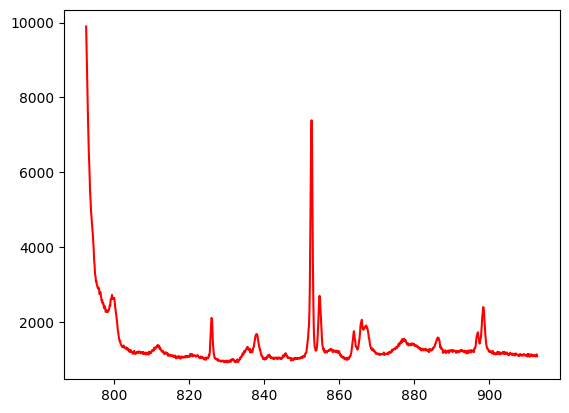

In [10]:
#PS Beads
psfilename = date + "_PS-beads_60x_1mm_42mW_cw-853_grating3_glass_1"
controls(psfilename,3)

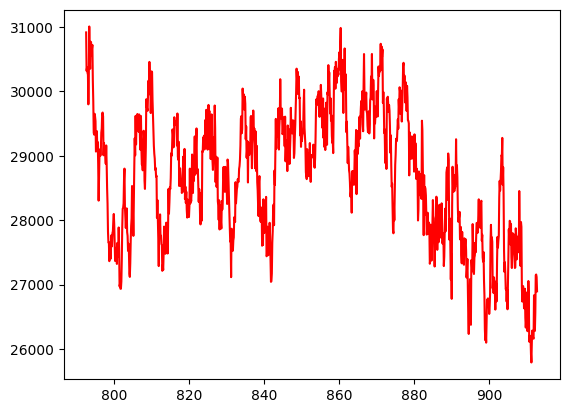

In [12]:
#Spectral Calibration
scfilename = date + "_spectralcal_60x_1mm_42mW_cw-853_grating3_air_1"
controls(scfilename,.1)

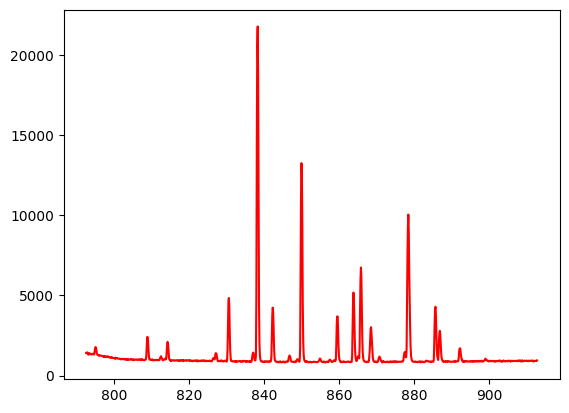

In [14]:
#Neon calibration
nfilename = date + "_neon-cal_1mm"
controls(nfilename,3)

In [15]:
##TO EDIT
#Change the number 'samples' to match how many dried samples droplets are being measured
#also change 'sample_names' to match the patient numbers for each spot in order
samples = 1
sample_names = ("340")#, "P94")
border_pos = np.zeros((samples,4,2))

In [16]:
##TO EDIT
#Change this number to match which spot position is being saved, but python 0 indexed (ie. 1st spot = 0, nth spot = n-1)

spot_number = 0

In [17]:
#Define border position, go through all 4 for each spot being measured, changing 'spot_number' in between to match each one
#TOP
border_pos[spot_number,0] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A -109024
Waiting for device...

Recv: :A -249741
Waiting for device...


In [18]:
#LEFT
border_pos[spot_number,1] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A -89709
Waiting for device...

Recv: :A -271235
Waiting for device...


In [19]:
#BOTTOM
border_pos[spot_number,2] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A -70063
Waiting for device...

Recv: :A -253389
Waiting for device...


In [20]:
#RIGHT
border_pos[spot_number,3] = ms2k.get_XYposition()
ms2k.wait_for_device()


Recv: :A -88693
Waiting for device...

Recv: :A -231533
Waiting for device...


In [21]:
#Check that the correct number of edges were inputed per number of spots measured

spot_num = border_pos.shape[0]
print(spot_num)

1


In [22]:
#check that all edges are saved in the right place
for h in range(spot_num):
    for k in range(4):
        ms2k.move(border_pos[h,k,0],border_pos[h,k,1])
        ms2k.wait_for_device()
        time.sleep(0.75)

Send: MOVE X=-109024.0 Y=-249741.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=-89709.0 Y=-271235.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=-70063.0 Y=-253389.0 Z=0
Recv: :A
Waiting for device...
Send: MOVE X=-88693.0 Y=-231533.0 Z=0
Recv: :A
Waiting for device...


In [23]:
##Calculate the grids for all spots for radial line measurements
##TO EDIT: measurements per line in the grid
data_points = 50

#name all x and y axis positions, average between the two corresponding values on each edge
y_pos = np.zeros(spot_num)
x_pos = np.zeros(spot_num)
y_min = np.zeros(spot_num)
y_max = np.zeros(spot_num)
x_min = np.zeros(spot_num)
x_max = np.zeros(spot_num)
#loop to make an n-D array with the spots in different columns
for a in range(spot_num):
    y_pos[a] = np.round((border_pos[a][0][1]+border_pos[a][2][1])/2)
    x_pos[a] = np.round((border_pos[a][1][0]+border_pos[a][3][0])/2)
    y_min[a] = border_pos[a][1][1]
    y_max[a] = border_pos[a][3][1]
    x_min[a] = border_pos[a][0][0]
    x_max[a] = border_pos[a][2][0]

#create vectors that correspond to the x and y axes
#make straight lines along each axis with evenly spaced points
vertical_line = np.round(np.linspace(x_min, x_max, data_points))
horizontal_line = np.round(np.linspace(y_min, y_max, data_points))
line_vert_y_pos = np.tile(y_pos,(data_points,1))
line_hor_x_pos = np.tile(x_pos,(data_points,1))

#create vectors that correspond to diagonal 45deg lines
#remove 30% from the maxes and mins to account for the geometry of a circle inscribed in a square
removed_range_x_min = (x_pos-x_min)*(1-1/2**(1/2))
removed_range_x_max = (x_max-x_pos)*(1-1/2**(1/2))
removed_range_y_max = (y_max-y_pos)*(1-1/2**(1/2))
removed_range_y_min = (y_pos-y_min)*(1-1/2**(1/2))

#calculate the new maxes and mins for the angles lines
angled_x_min = x_min + removed_range_x_min
angled_x_max = x_max - removed_range_x_max
angled_y_min = y_min + removed_range_y_min
angled_y_max = y_max - removed_range_y_max

#create x and y vectors that correspond to the angled vectors
#y vectors are mirrored so we get both diagonal 45deg lines
angled_vector_x = np.round(np.linspace(angled_x_min,angled_x_max,data_points))
angled_vector_y_1 = np.round(np.linspace(angled_y_min,angled_y_max,data_points))
angled_vector_y_2 = np.round(np.linspace(angled_y_max,angled_y_min,data_points))

#create n matrices for all x and y vectors in order, to put through the 2 for loops
#each grid vector has n-D for each spot, and 50x4 for each of the 4 rows
x_vectors_grid = np.zeros((spot_num,4,data_points))
y_vectors_grid = np.zeros((spot_num,4,data_points))
for b in range(spot_num):
    x_vectors_grid[b] = np.row_stack((vertical_line[:,b], line_hor_x_pos[:,b], angled_vector_x[:,b], angled_vector_x[:,b]))
    y_vectors_grid[b] = np.row_stack((line_vert_y_pos[:,b], horizontal_line[:,b], angled_vector_y_2[:,b], angled_vector_y_1[:,b]))

In [ ]:
#For double checking all grid locations for all spots, will take FOREVER if doing more than a few grid spots, use at own risk
for h in range(spot_num):
    for k in range(4):
        for i in range(data_points):
            ms2k.move(x_vectors_grid[h,k,i],y_vectors_grid[h,k,i])
            ms2k.wait_for_device()
            time.sleep(0.75)

In [24]:
#Preprocessing function for visualization (NOT what is being saved, raw data is saved)
#INPUTS: 1024x2 matrix of spectra (wavelengths and intensitites)

#whittaker smooth is a part of airPLS
def WhittakerSmooth(x,w,lambda_,differences=1):

    X=np.matrix(x)
    m=X.size
    E=eye(m,format='csc')
    for i in range(differences):
        E=E[1:]-E[:-1] # numpy.diff() does not work with sparse matrix. This is a workaround.
    W=diags(w,0,shape=(m,m))
    A=csc_matrix(W+(lambda_*E.T*E))
    B=csc_matrix(W*X.T)
    background=spsolve(A,B)
    return np.array(background)

#airPLS corrects baseline
def airPLS(x, lambda_=100, porder=1, itermax=15):

    m=x.shape[0]
    w=np.ones(m)
    for i in range(1,itermax+1):
        z = WhittakerSmooth(x,w,lambda_, porder)
        d=x-z
        dssn=np.abs(d[d<0].sum())
        if(dssn<0.001*(abs(x)).sum() or i==itermax):
            if(i==itermax): print('WARING max iteration reached!')
            break
        w[d>=0]=0 # d>0 means that this point is part of a peak, so its weight is set to 0 in order to ignore it
        w[d<0]=np.exp(i*np.abs(d[d<0])/dssn)
        w[0]=np.exp(i*(d[d<0]).max()/dssn) 
        w[-1]=w[0]
    return z

def preprocessing(spectra):
    ##TO EDIT: lower crop limit
    crop =600
    
    #change from wl to wn
    wavelength = spectra[:,0]
    intensity = spectra[:,1]
    factor = 1e7/785
    wn = [factor - 1e7 / num for num in wavelength]
    
    #Crop lower limit to 'crop'
    wn = np.array(wn)
    intensity = np.array(intensity)
    crop_location = wn >= crop
    wn = wn[crop_location]
    intensity = intensity[crop_location]

    #smoothing function to reduce noise:
    z = []
    m = len(intensity)
    E = np.eye(m)
    D = np.diff(E, axis=0)
    C = cholesky(E + 5 * D.T @ D, lower=True)
    z = np.linalg.solve(C @ C.T, intensity)
    
    baseline = airPLS(z)
    #output of smoothing function minus the baseline found in airPLS gives corrected intensity:
    corrected_intensity = z - baseline
    
#Outputs: new matrix of corrected wavenumbers and intensities
    return np.column_stack((wn,corrected_intensity))

In [25]:
def autofocus(exp_time):
    #Rough Autofocusing
    entropy_list = []
    start_time = time.time()
    #For polystyrene use 65 as upper limit
    #For biofluid, use 5 as upper limit
    ##TO EDIT: range of autofocus z-axis, (min, max, number of steps)
    z_axis_range = np.linspace(0,30,25)
    #exp_time = 0.1
    # set to false if using the old fused quartz substrates, to true if using the new crystal quartz (large)
    quartzCrystal = True

    num_rep = 5
    data_point = 1024
    pixelsToCrop = 250
    
    if quartzCrystal:
        data_point -= pixelsToCrop
        
    int_array = np.zeros((num_rep,data_point))

    for z_pos in z_axis_range:
        # Choose axis to move and new position in micrometers
        axis = c_uint(3)
        pos = c_double(z_pos)
        # Move to a new position
        error = mcldll.MCL_SingleWriteN(pos, axis, handle)
        # Wait for nanopositioner to settle
        sleep(0.025)
        # Read the new position
        position = mcldll.MCL_SingleReadN(axis, handle)

        for rep in range(num_rep):
            wavenumbers, intensity = cam.camera_aquisition(exp_time)         
            if quartzCrystal:
                intensity = intensity[pixelsToCrop:]               
            int_array[rep] = intensity
  
        intensities = np.median(int_array,0)
        ent = calculate_entropy(intensities)
        entropy_list.append(ent)

    print("Time elapsed = ", time.time()-start_time)
    entropy_graph = entropy_list
    z_axis = z_axis_range
   # plt.figure()
    #plt.plot(z_axis_range,entropy_list)

    k = np.argmin(entropy_list)
    fineMin = z_axis_range[np.clip(k-1,0,len(z_axis_range)-1)]
    fineMax = z_axis_range[np.clip(k+1,0,len(z_axis_range)-1)]

    #Fine Autofocusing
    entropy_list = []
    z_axis_range = np.linspace(fineMin,fineMax,2)

    num_rep = 5
    data_point = 1024
    if quartzCrystal:
        data_point -= pixelsToCrop
    int_array = np.zeros((num_rep,data_point))
    
    for z_pos in z_axis_range:
        # Choose axis to move and new position in micrometers
        axis = c_uint(3)
        pos = c_double(z_pos)
        # Move to a new position
        error = mcldll.MCL_SingleWriteN(pos, axis, handle)
        # Wait for nanopositioner to settle
        sleep(0.025)
        # Read the new position
        position = mcldll.MCL_SingleReadN(axis, handle)
        
        for rep in range(num_rep):
            wavenumbers, intensity = cam.camera_aquisition(exp_time)
            if quartzCrystal:
                intensity = intensity[pixelsToCrop:]
            int_array[rep] = intensity
            
        int_array = int_array[:250]
        intensities = np.median(int_array,0)
        ent = calculate_entropy(intensities)
        entropy_list.append(ent)

    focusedPos = z_axis_range[np.argmin(entropy_list)] 
    axis = c_uint(3)
    pos = c_double(focusedPos)

    # Move to a new position
    error = mcldll.MCL_SingleWriteN(pos, axis, handle)
    # Wait for nanopositioner to settle
    sleep(0.025)
    # Read the new position
    position = mcldll.MCL_SingleReadN(axis, handle)
    
    print("Position = ", position)
    return (z_axis,entropy_graph)

In [ ]:
#re-zero z-axis mover, if needed
axis = c_uint(3)
pos = c_double(0)

# Move to a new position
error = mcldll.MCL_SingleWriteN(pos, axis, handle)

In [ ]:
#one spot focus for sanity
autofocus(.1)

In [26]:
def singlespectra(exposure):    
    df_list = []
    num_rep = 1
    data_point = 1024
    int_array = np.zeros((num_rep,data_point))
    wa_array = np.zeros((num_rep,data_point))

    exp_time = exposure
    (z_axis_range,entropy_graph) = autofocus(.1)

    for rep in range(num_rep):
        wavenumbers, intensity = cam.camera_aquisition(exp_time)
        df = pd.DataFrame({
            'Wavelength':wavenumbers,
            'Intensity':intensity
        })
        df_list.append(df)
    final_df = pd.concat(df_list)
    
    collected_spectra = np.column_stack((wavenumbers,intensity))
    processed = preprocessing(collected_spectra)
    plt.figure()
    plt.figure(figsize=(11,4))
    plt.subplot(1,2,1)
    plt.plot(z_axis_range,entropy_graph)
    plt.subplot(1,2,2)
    plt.plot(processed[:,0],processed[:,1])
    plt.show()

In [ ]:
singlespectra(10)

Send: MOVE X=-99112.5 Y=-261400.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.332852840423584
Position =  18.775515428828157


<Figure size 640x480 with 0 Axes>

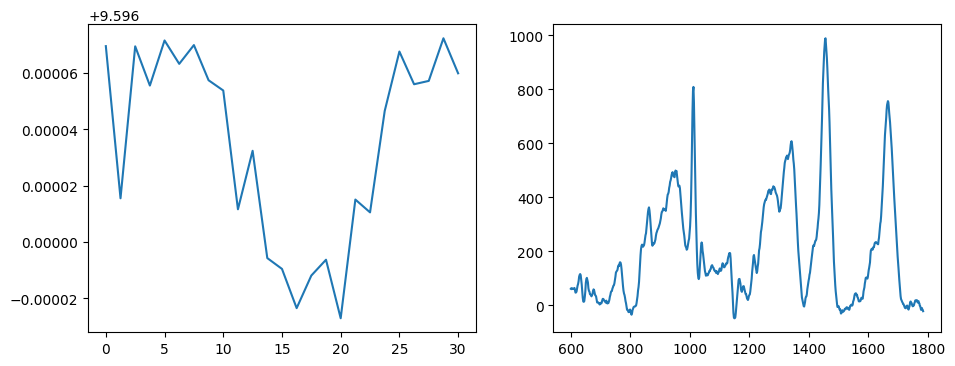

Send: MOVE X=-99112.5 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.325706243515015
Position =  11.270842635446416


<Figure size 640x480 with 0 Axes>

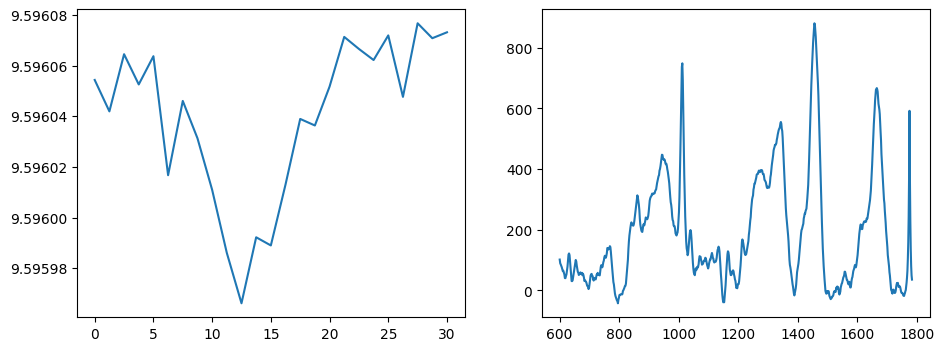

Send: MOVE X=-99112.5 Y=-241549.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.402461290359497
Position =  11.24342388980912


<Figure size 640x480 with 0 Axes>

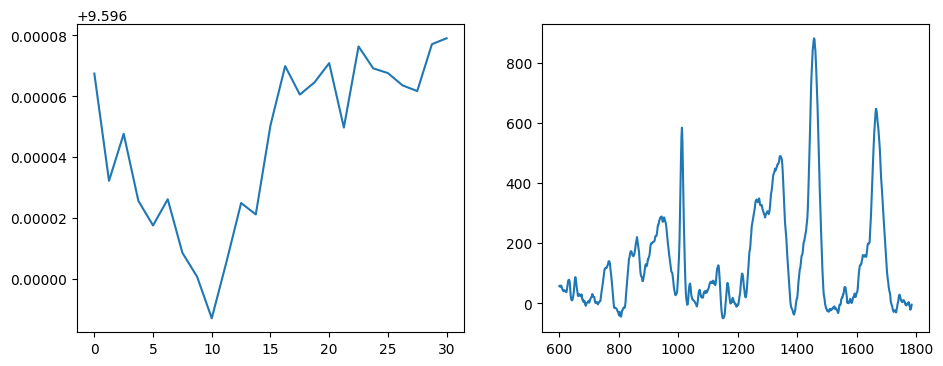

Send: MOVE X=-89201.0 Y=-261400.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.362367630004883
Position =  18.742024069235292


<Figure size 640x480 with 0 Axes>

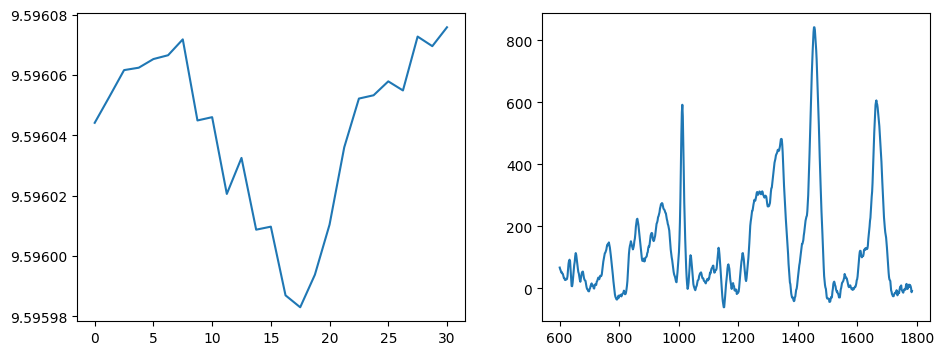

Send: MOVE X=-89201.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.453645706176758
Position =  10.005779328512416


<Figure size 640x480 with 0 Axes>

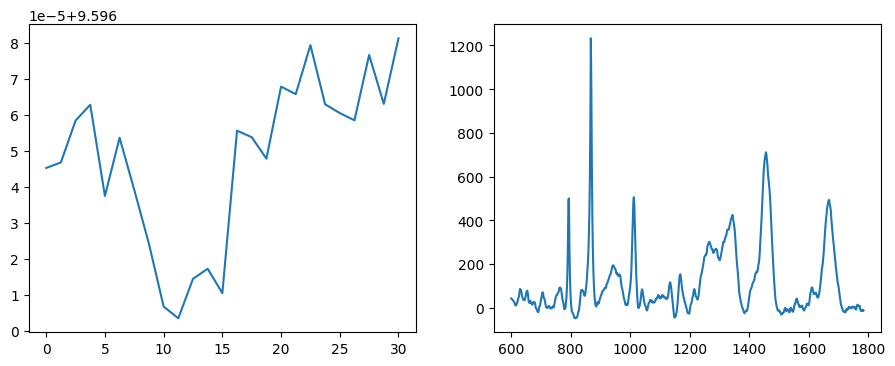

Send: MOVE X=-89201.0 Y=-241549.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.40454387664795
Position =  7.531276806337016


<Figure size 640x480 with 0 Axes>

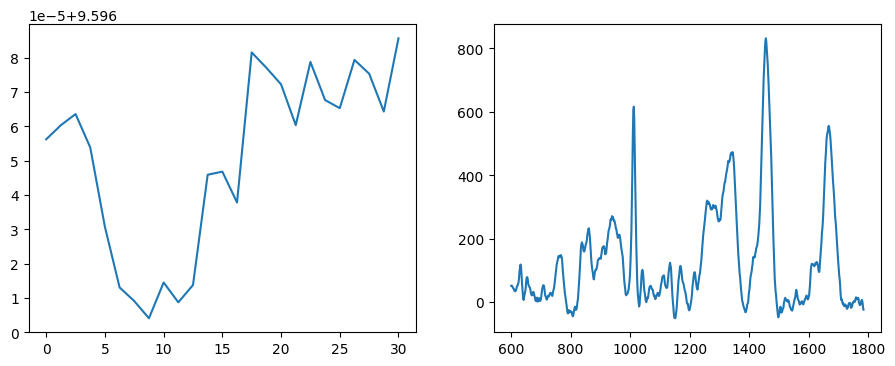

Send: MOVE X=-79632.0 Y=-261400.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.554471015930176
Position =  16.245726076696126


<Figure size 640x480 with 0 Axes>

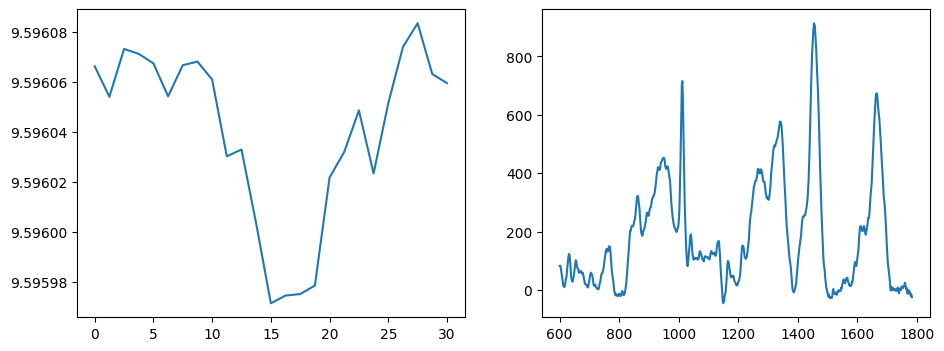

Send: MOVE X=-79632.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28234100341797
Position =  13.745679722434437


<Figure size 640x480 with 0 Axes>

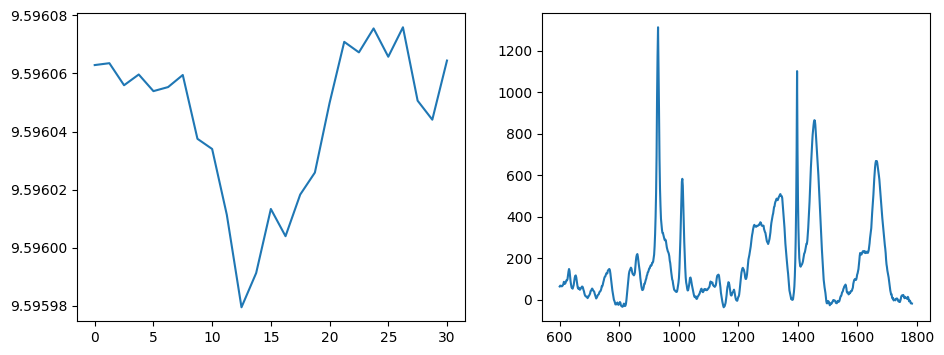

Send: MOVE X=-79632.0 Y=-241549.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.37659788131714
Position =  8.76988863786188


<Figure size 640x480 with 0 Axes>

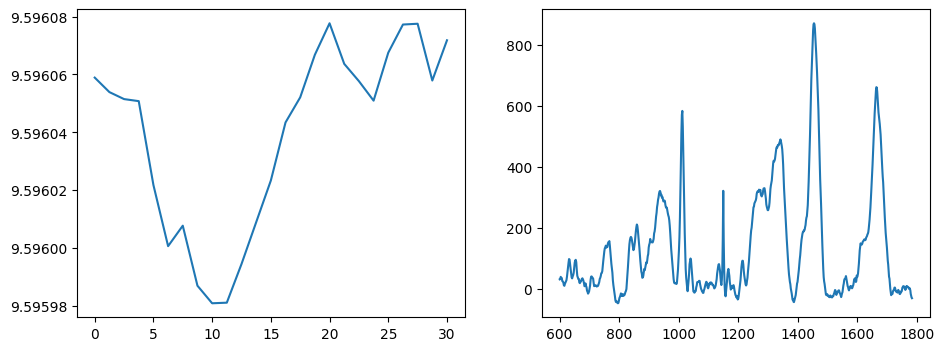

In [27]:
#Perform rough autofocusing on a grid
for q in range(spot_num):
    x_grid_1 = (x_pos[q] + x_min[q])/2
    x_grid_2 = x_pos[q]
    x_grid_3 = (x_max[q] + x_pos[q])/2
    x_grid = (x_grid_1, x_grid_2, x_grid_3)
    y_grid_1 = (y_min[q] + y_pos[q])/2
    y_grid_2 = y_pos[q]
    y_grid_3 = (y_pos[q] + y_max[q])/2
    y_grid = (y_grid_1, y_grid_2, y_grid_3)

    for r in range(3):
        for t in range(3):
            ms2k.move(x_grid[r],y_grid[t])
            ms2k.wait_for_device()
            time.sleep(0.75)
            singlespectra(10)

In [ ]:
print(sample_names[0])

Send: MOVE X=-109024.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.375477075576782
Position =  3.7419139449422003


<Figure size 640x480 with 0 Axes>

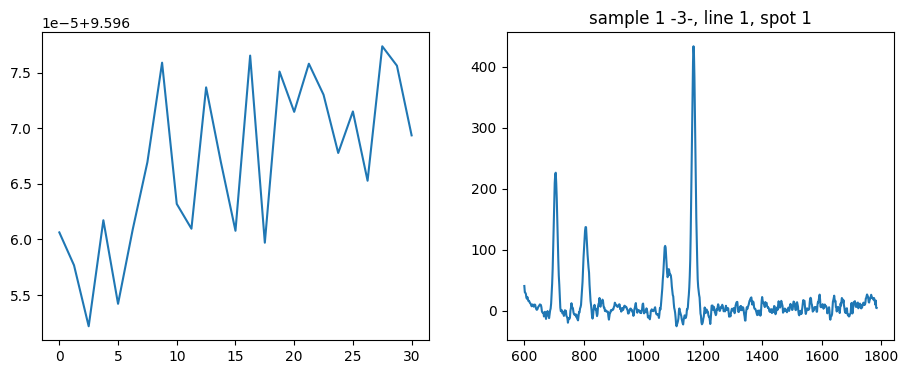

Send: MOVE X=-108229.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.280773401260376
Position =  8.77338237362182


<Figure size 640x480 with 0 Axes>

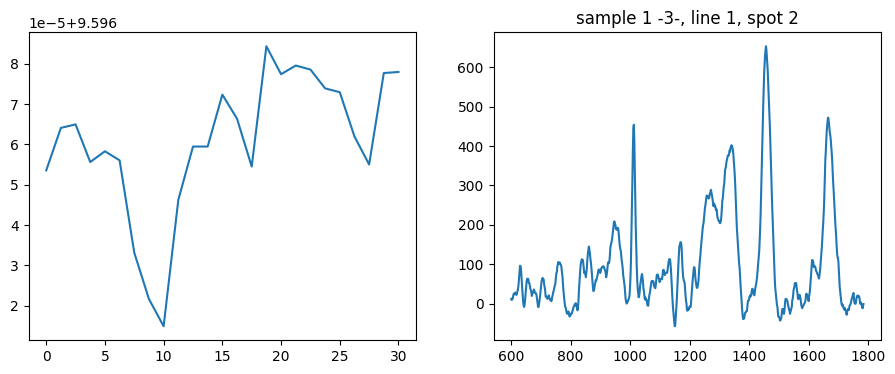

Send: MOVE X=-107434.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.378496408462524
Position =  9.996024403235943


<Figure size 640x480 with 0 Axes>

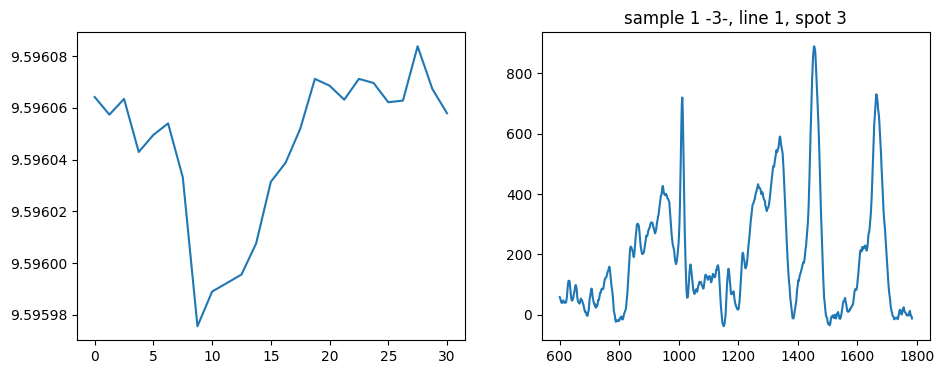

Send: MOVE X=-106639.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34306526184082
Position =  11.28400761075601


<Figure size 640x480 with 0 Axes>

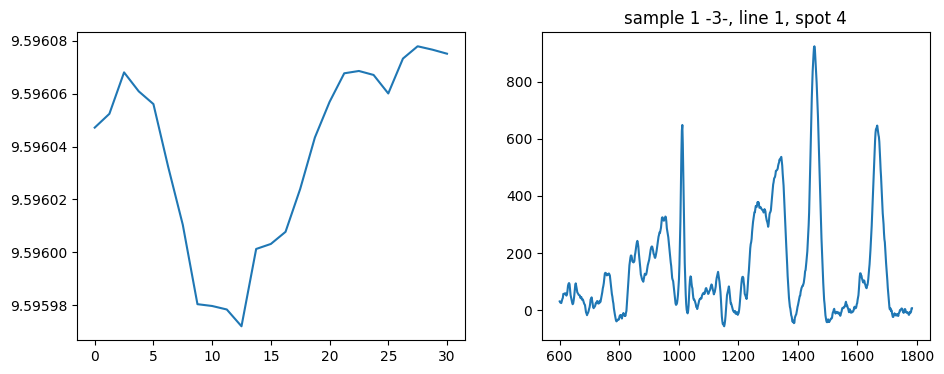

Send: MOVE X=-105844.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.520660877227783
Position =  17.52323108870581


<Figure size 640x480 with 0 Axes>

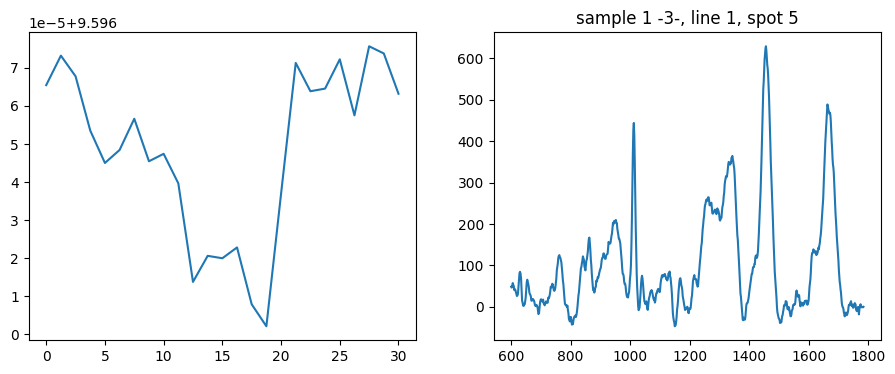

Send: MOVE X=-105048.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.284574270248413
Position =  17.491516216325188


<Figure size 640x480 with 0 Axes>

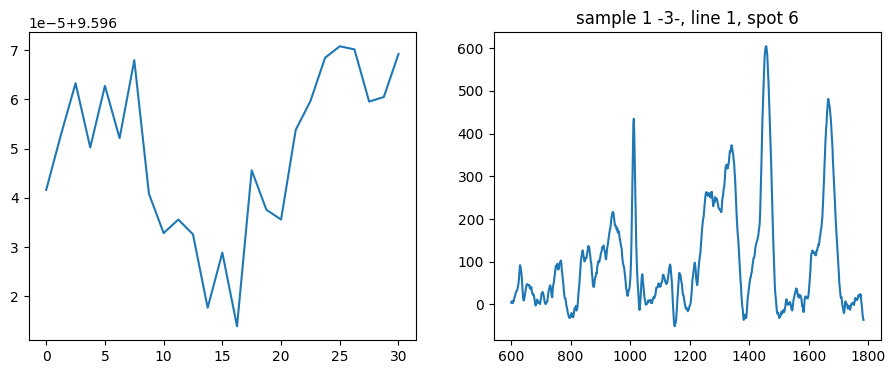

Send: MOVE X=-104253.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.49587345123291
Position =  12.492697768942367


<Figure size 640x480 with 0 Axes>

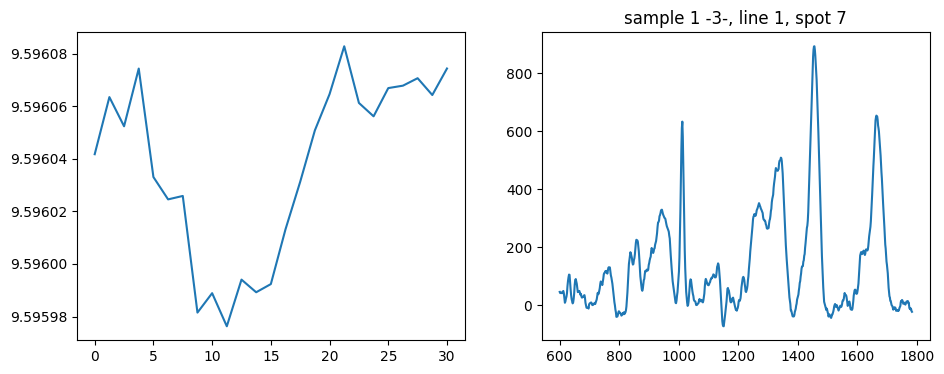

Send: MOVE X=-103458.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.293699979782104
Position =  12.492806388355083


<Figure size 640x480 with 0 Axes>

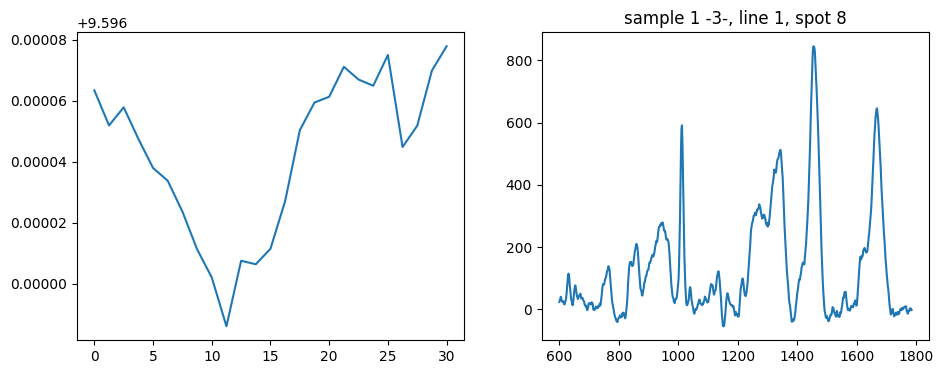

Send: MOVE X=-102663.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.46261978149414
Position =  11.275793132961896


<Figure size 640x480 with 0 Axes>

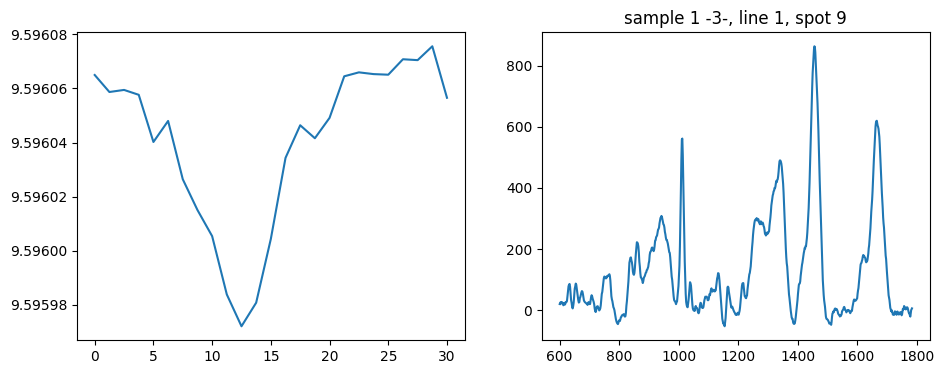

Send: MOVE X=-101868.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31687021255493
Position =  9.996514877310956


<Figure size 640x480 with 0 Axes>

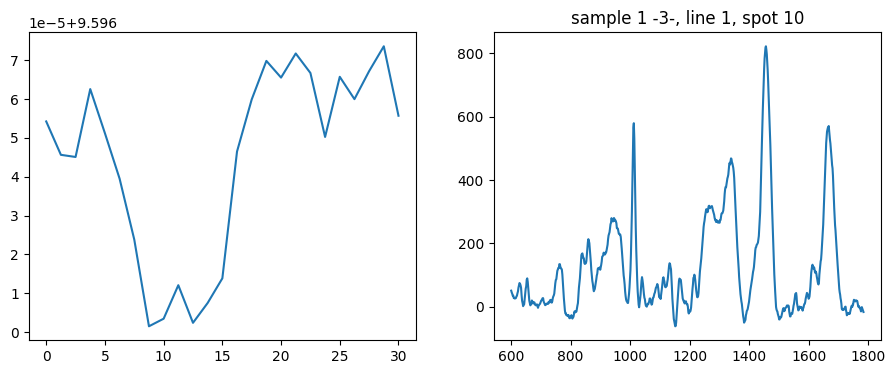

Send: MOVE X=-101073.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.473511934280396
Position =  9.99596990591113


<Figure size 640x480 with 0 Axes>

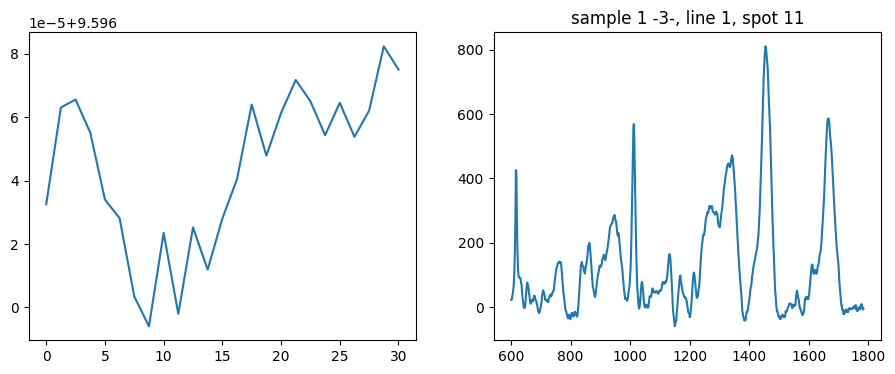

Send: MOVE X=-100278.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.333340167999268
Position =  12.492752078099926


<Figure size 640x480 with 0 Axes>

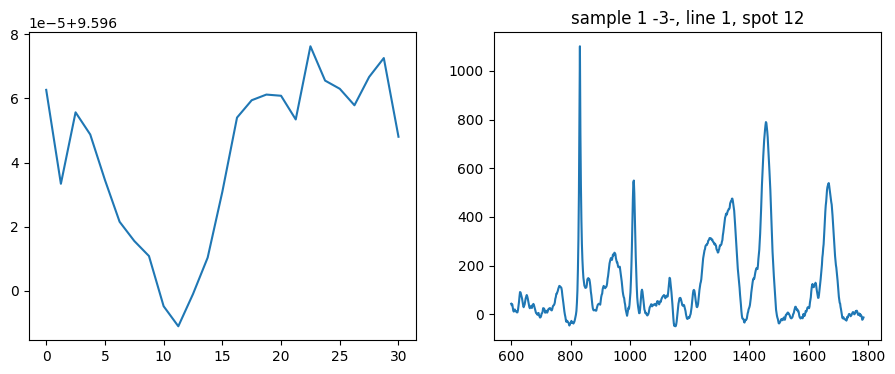

Send: MOVE X=-99483.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.578194618225098
Position =  7.538659045046349


<Figure size 640x480 with 0 Axes>

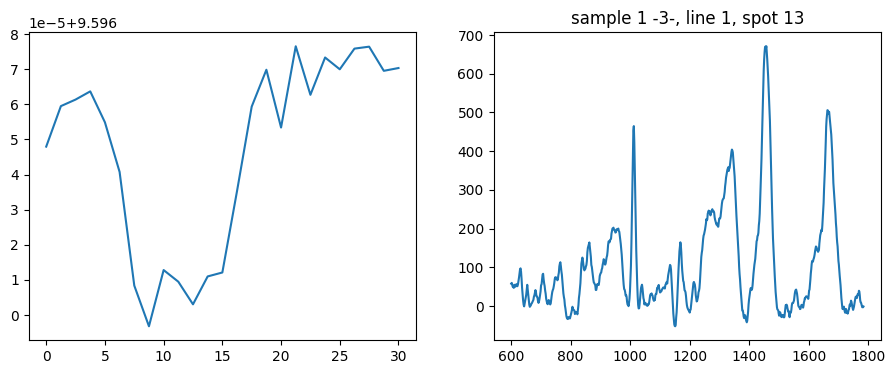

Send: MOVE X=-98687.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.29430341720581
Position =  8.743521319386623


<Figure size 640x480 with 0 Axes>

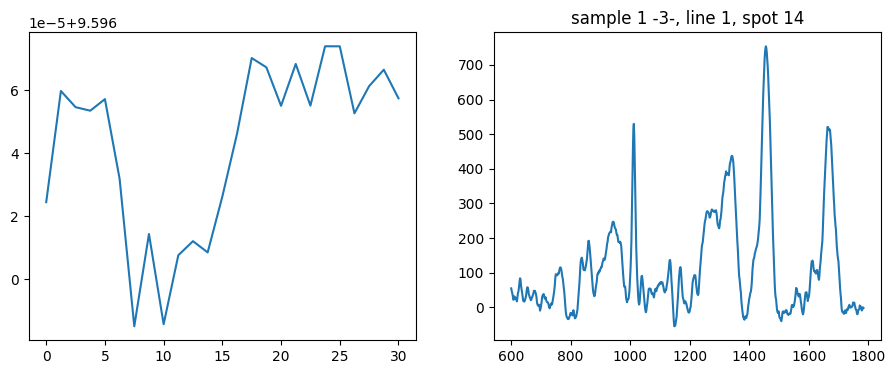

Send: MOVE X=-97892.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.520395278930664
Position =  11.279437981101763


<Figure size 640x480 with 0 Axes>

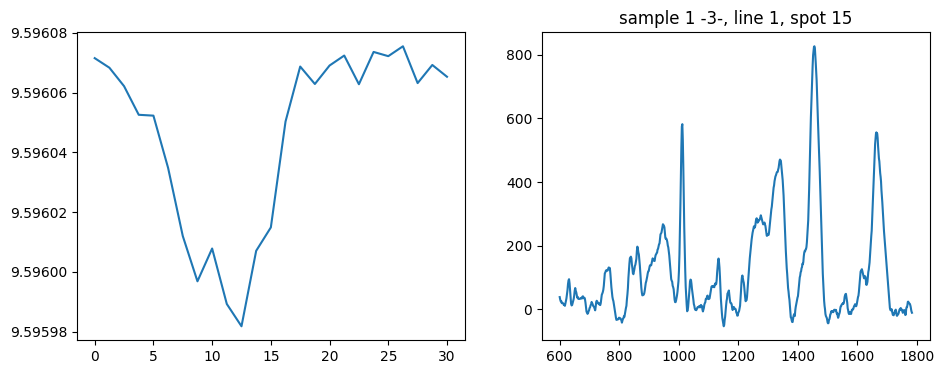

Send: MOVE X=-97097.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.342965841293335
Position =  11.24255343609346


<Figure size 640x480 with 0 Axes>

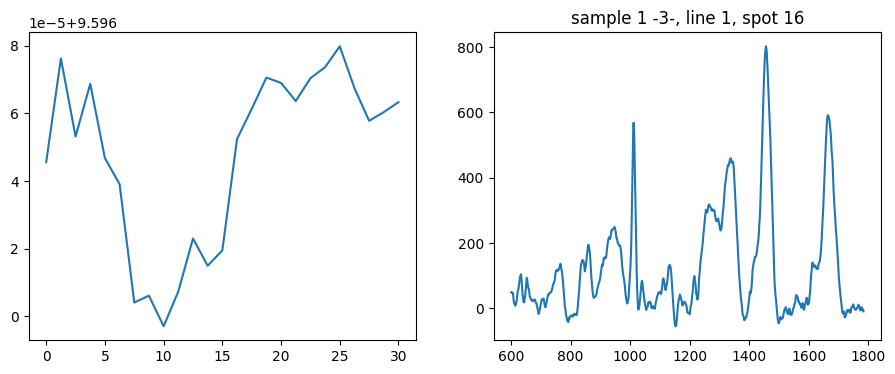

Send: MOVE X=-96302.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.537720441818237
Position =  9.995969905911133


<Figure size 640x480 with 0 Axes>

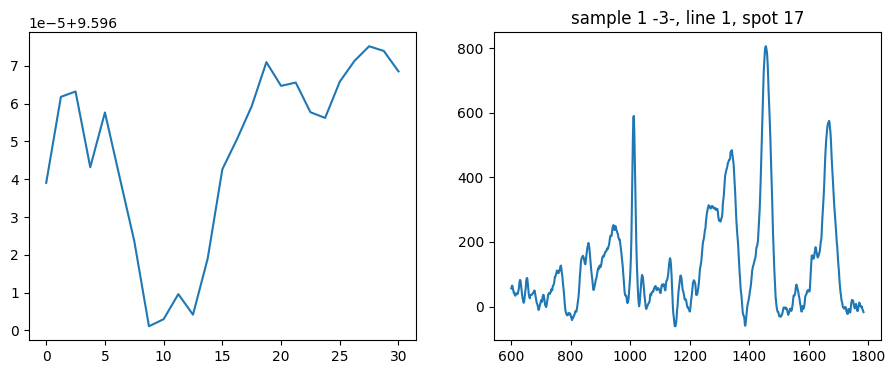

Send: MOVE X=-95507.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.230737924575806
Position =  11.243423889686538


<Figure size 640x480 with 0 Axes>

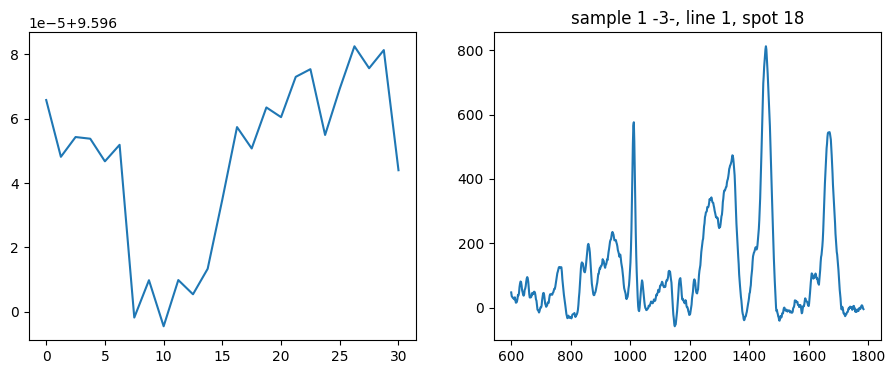

Send: MOVE X=-94712.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.504627227783203
Position =  12.529735993952055


<Figure size 640x480 with 0 Axes>

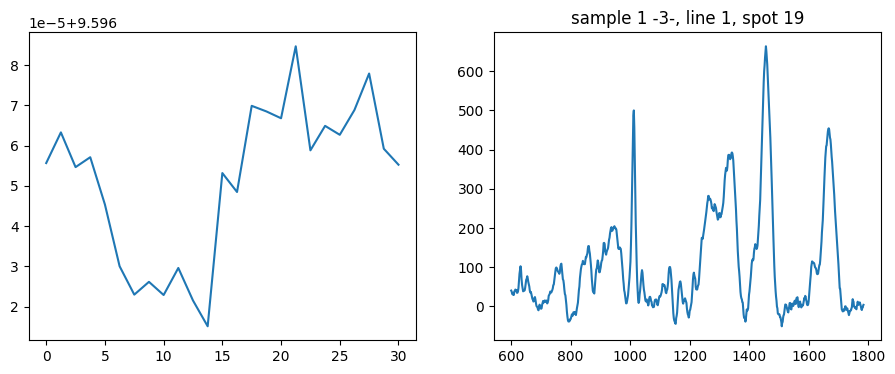

Send: MOVE X=-93917.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31401515007019
Position =  9.996242391426215


<Figure size 640x480 with 0 Axes>

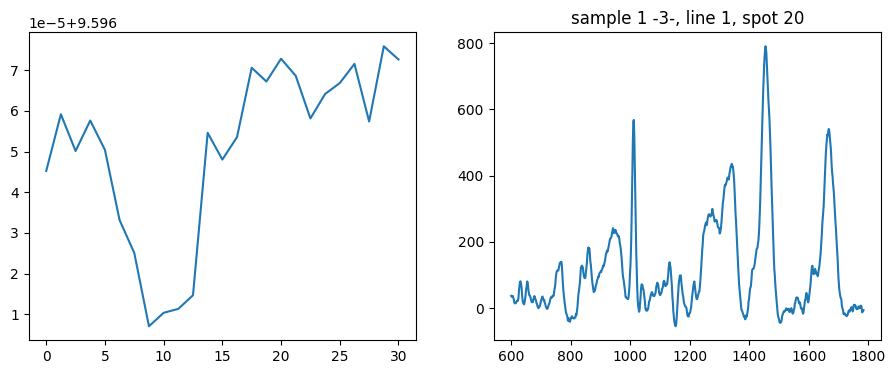

Send: MOVE X=-93122.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.462804555892944
Position =  9.996569373650006


<Figure size 640x480 with 0 Axes>

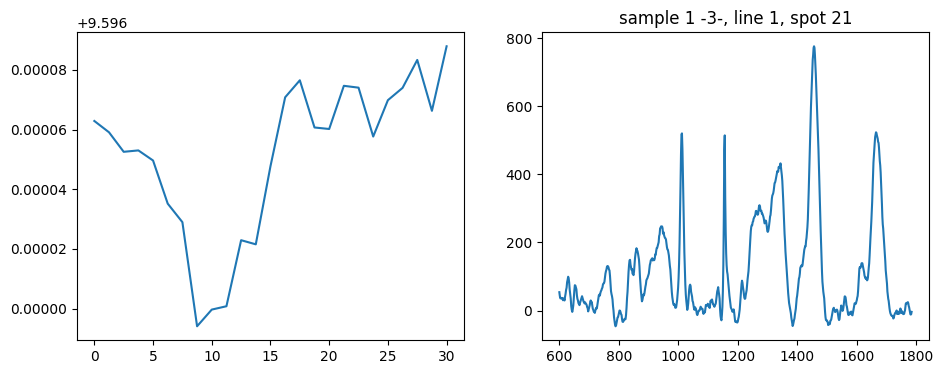

Send: MOVE X=-92326.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.259713649749756
Position =  10.025016309120831


<Figure size 640x480 with 0 Axes>

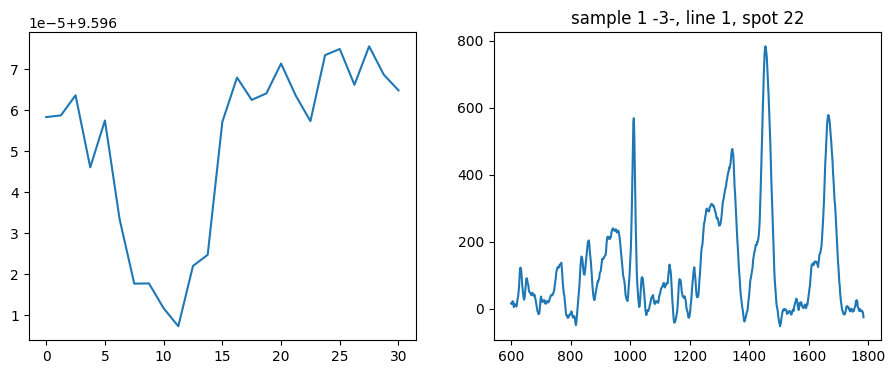

Send: MOVE X=-91531.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.458996534347534
Position =  8.768087175298312


<Figure size 640x480 with 0 Axes>

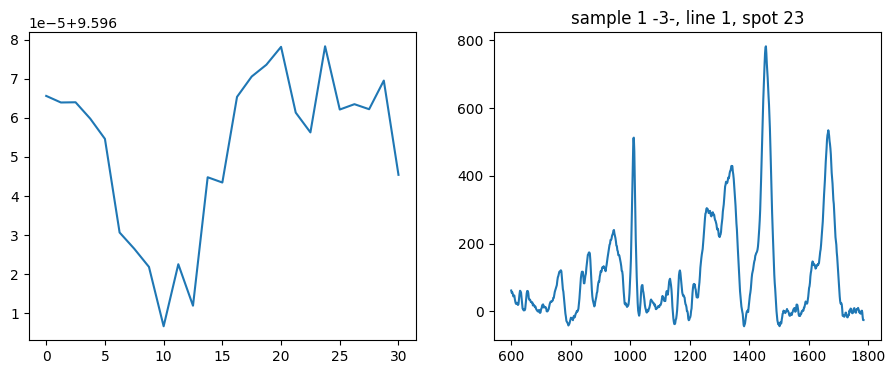

Send: MOVE X=-90736.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.339364290237427
Position =  12.49269776882041


<Figure size 640x480 with 0 Axes>

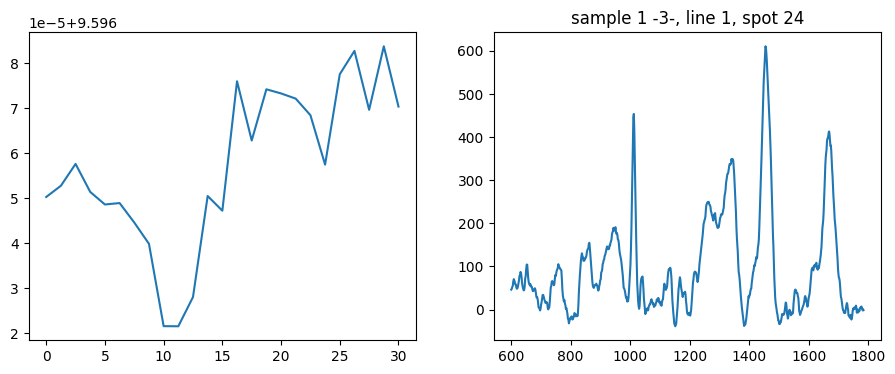

Send: MOVE X=-89941.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.51656937599182
Position =  12.492860697390693


<Figure size 640x480 with 0 Axes>

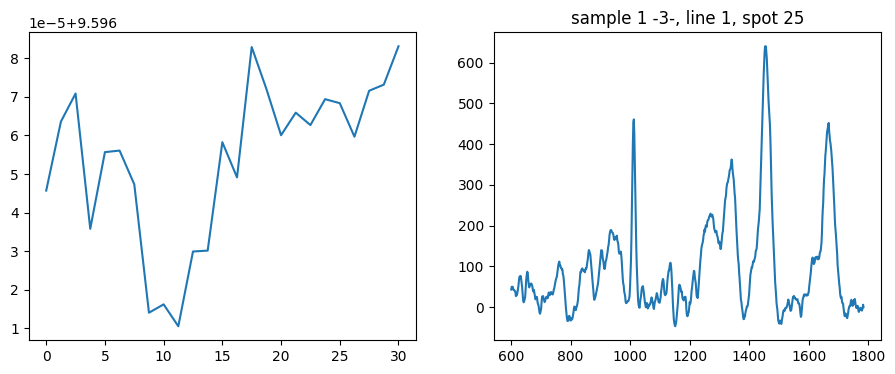

Send: MOVE X=-89146.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.26295280456543
Position =  7.534120345671373


<Figure size 640x480 with 0 Axes>

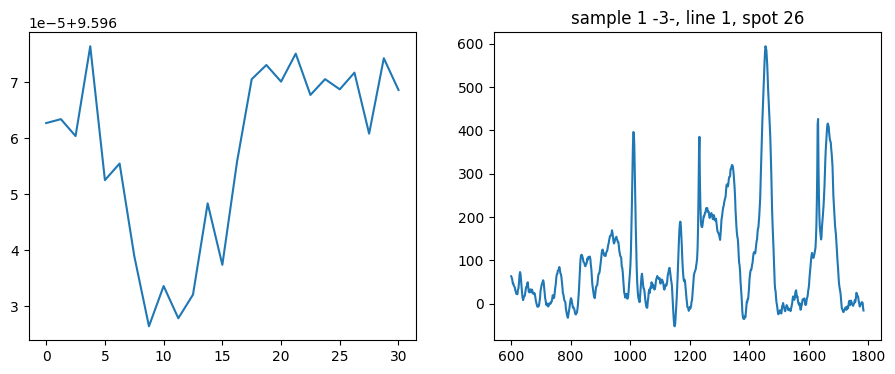

Send: MOVE X=-88351.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.441683530807495
Position =  12.4931322453737


<Figure size 640x480 with 0 Axes>

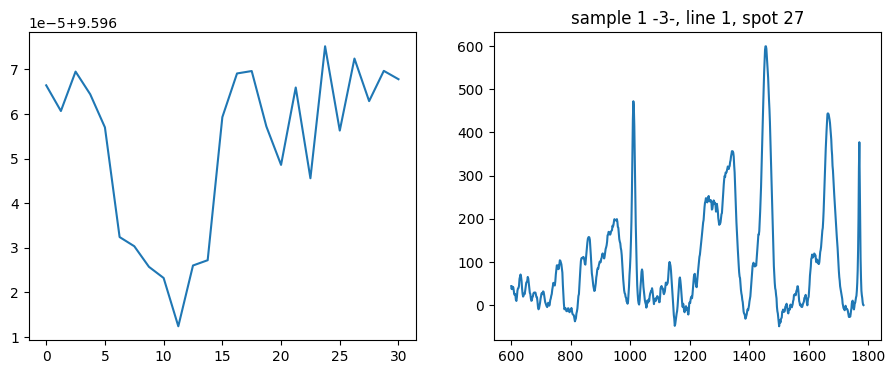

Send: MOVE X=-87556.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.288272619247437
Position =  9.995751917227985


<Figure size 640x480 with 0 Axes>

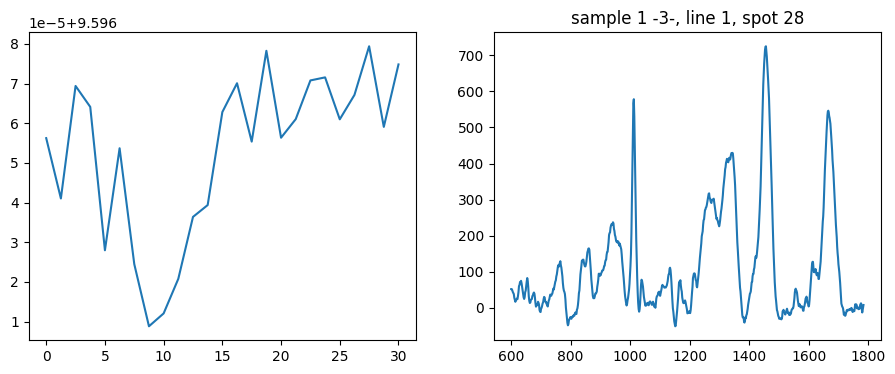

Send: MOVE X=-86761.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.46067786216736
Position =  11.24364150253317


<Figure size 640x480 with 0 Axes>

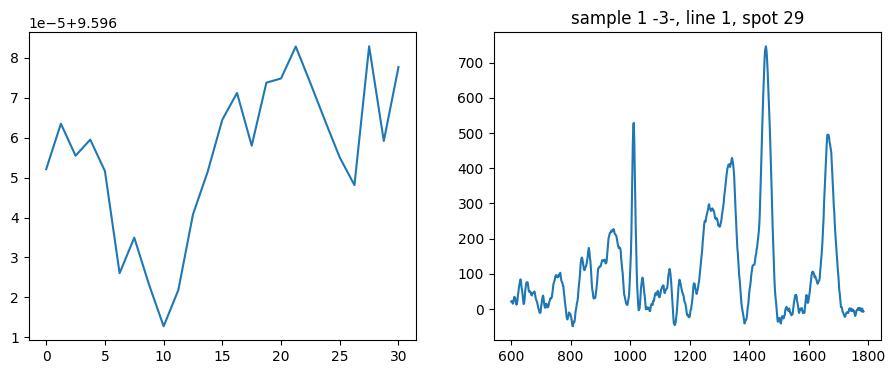

Send: MOVE X=-85965.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.297552585601807
Position =  11.242771049675603


<Figure size 640x480 with 0 Axes>

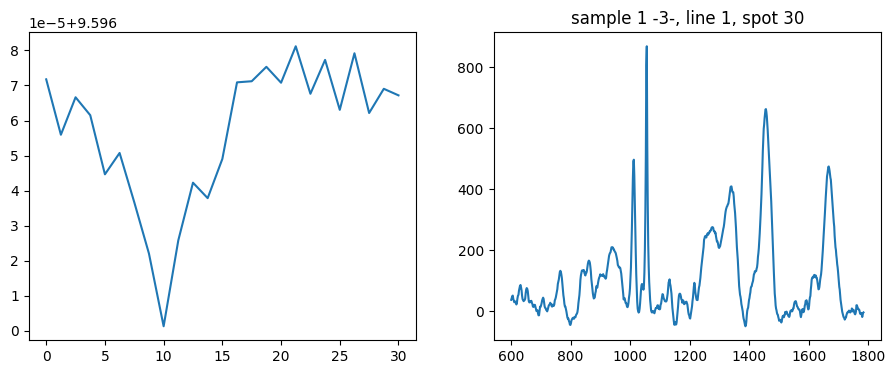

Send: MOVE X=-85170.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.475813150405884
Position =  11.271277847043073


<Figure size 640x480 with 0 Axes>

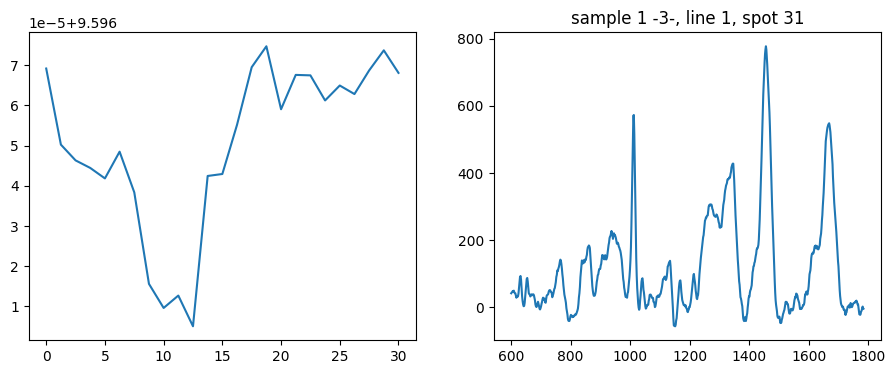

Send: MOVE X=-84375.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.380675077438354
Position =  9.989811700074364


<Figure size 640x480 with 0 Axes>

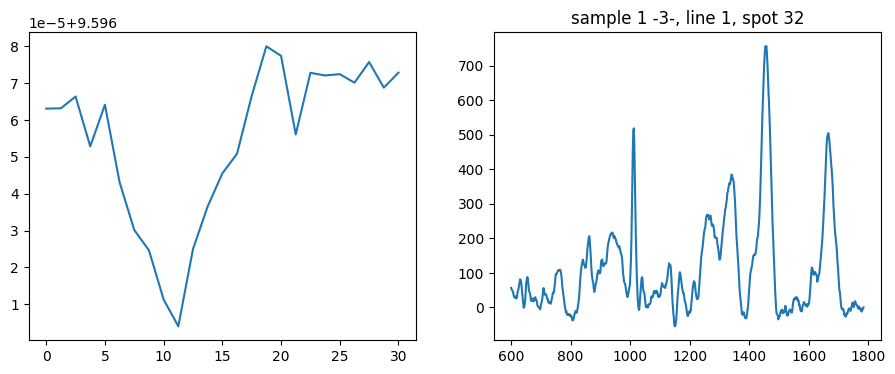

Send: MOVE X=-83580.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.477994680404663
Position =  11.26670812828104


<Figure size 640x480 with 0 Axes>

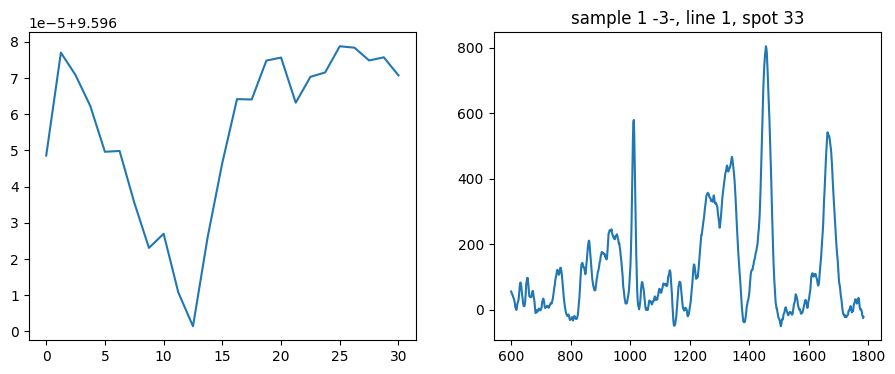

Send: MOVE X=-82785.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.296984910964966
Position =  11.242879856282805


<Figure size 640x480 with 0 Axes>

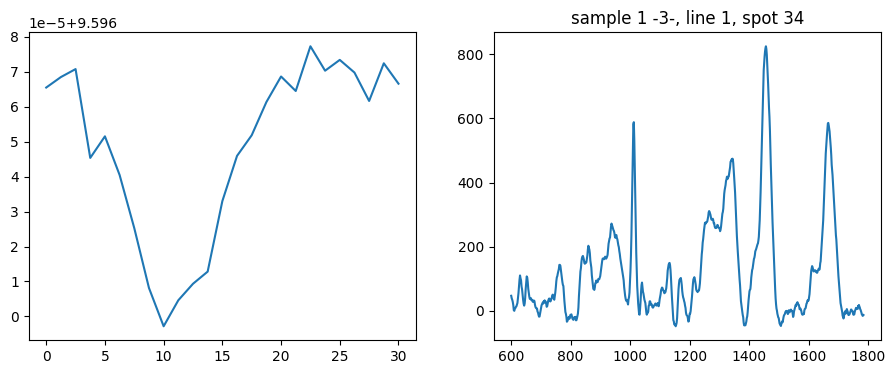

Send: MOVE X=-81990.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32833981513977
Position =  10.027032619330269


<Figure size 640x480 with 0 Axes>

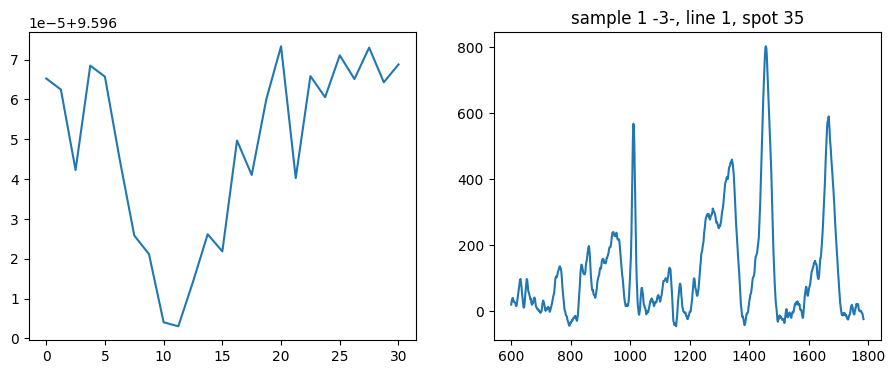

Send: MOVE X=-81195.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.309239625930786
Position =  11.271658654478264


<Figure size 640x480 with 0 Axes>

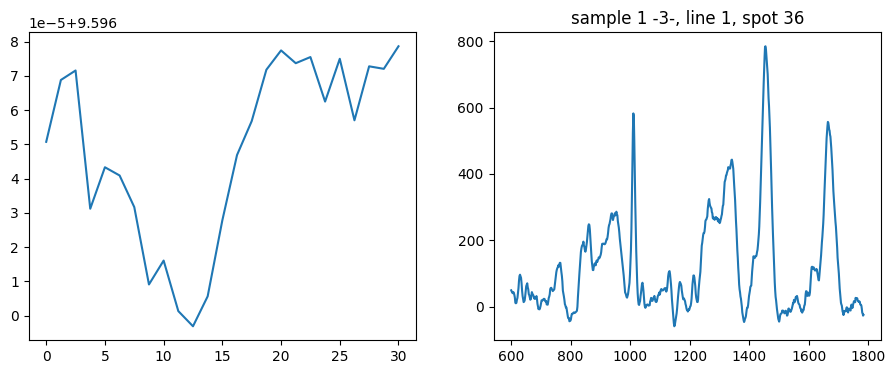

Send: MOVE X=-80400.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.530616760253906
Position =  11.243043066316181


<Figure size 640x480 with 0 Axes>

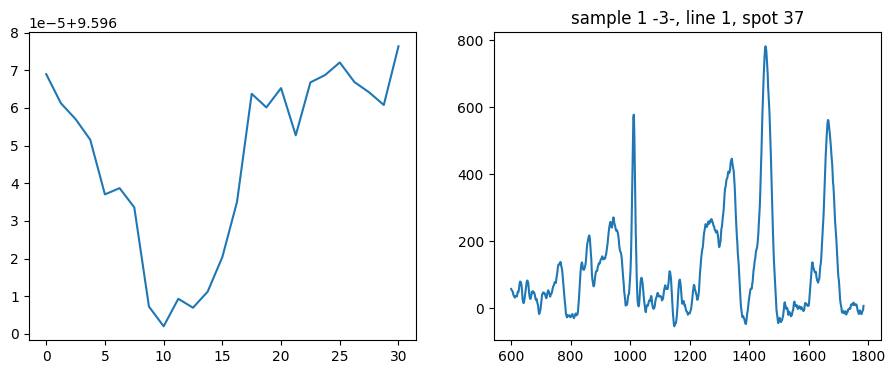

Send: MOVE X=-79604.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.438342809677124
Position =  12.493023626326842


<Figure size 640x480 with 0 Axes>

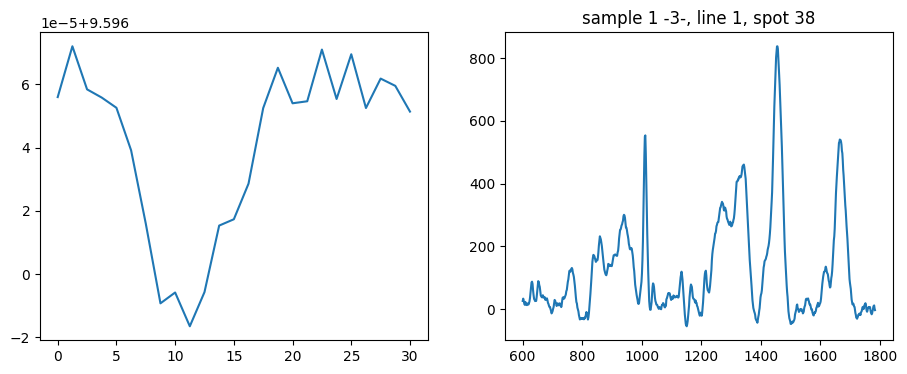

Send: MOVE X=-78809.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.45679473876953
Position =  11.274759515547238


<Figure size 640x480 with 0 Axes>

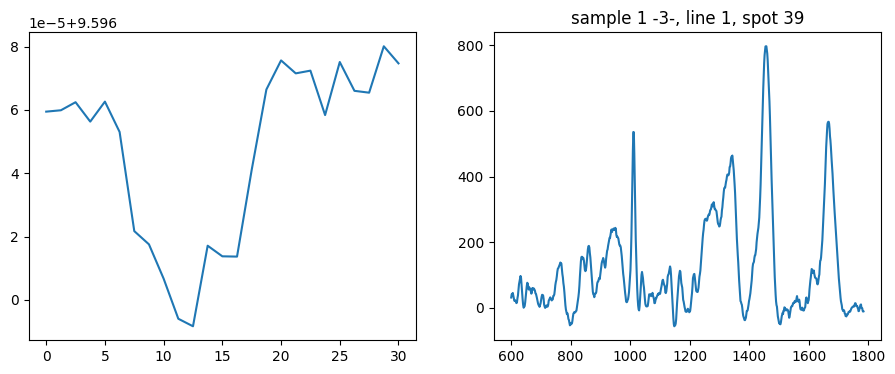

Send: MOVE X=-78014.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.406625509262085
Position =  11.2717130558206


<Figure size 640x480 with 0 Axes>

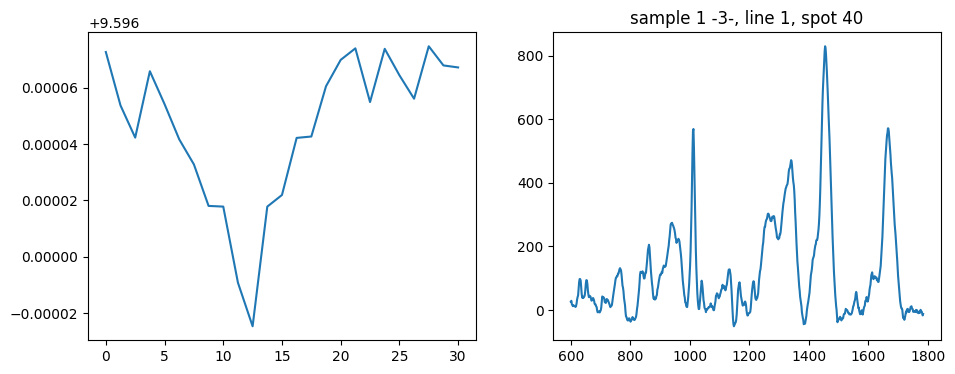

Send: MOVE X=-77219.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.565670013427734
Position =  11.242934259586402


<Figure size 640x480 with 0 Axes>

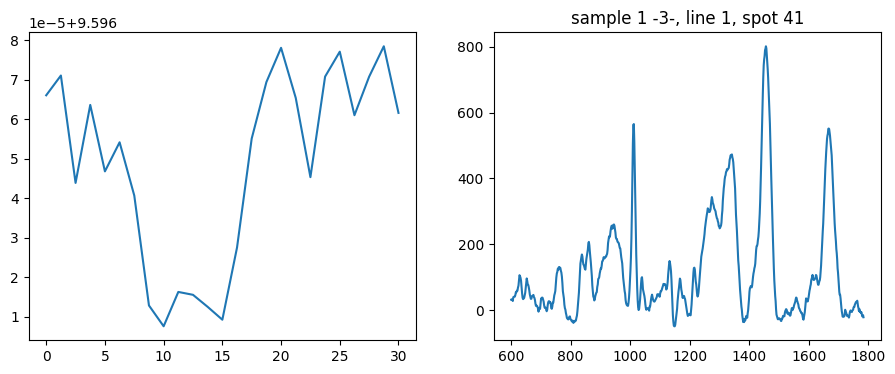

Send: MOVE X=-76424.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31293773651123
Position =  13.744595401542806


<Figure size 640x480 with 0 Axes>

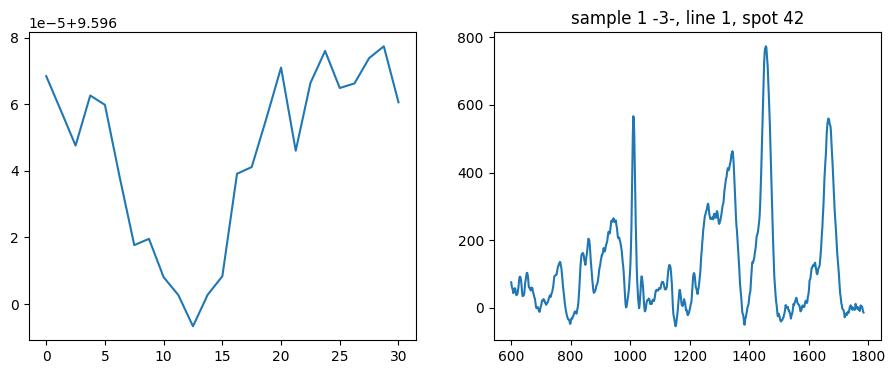

Send: MOVE X=-75629.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.482478618621826
Position =  11.272039463384305


<Figure size 640x480 with 0 Axes>

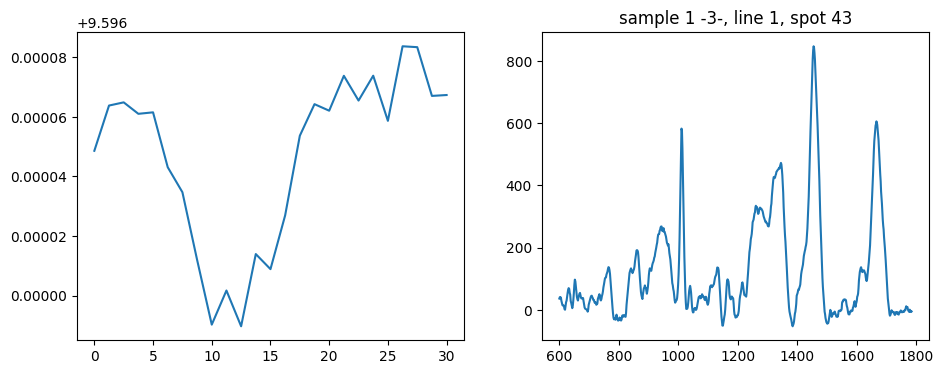

Send: MOVE X=-74834.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.27572464942932
Position =  13.775877411482583


<Figure size 640x480 with 0 Axes>

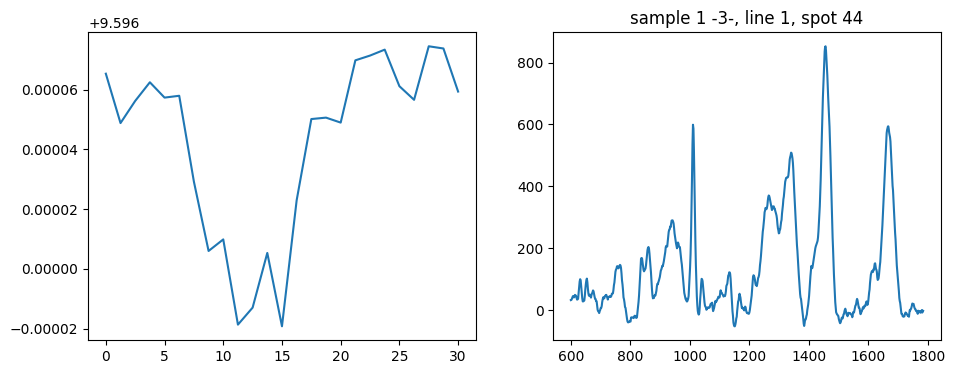

Send: MOVE X=-74039.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.533509254455566
Position =  16.276252480340926


<Figure size 640x480 with 0 Axes>

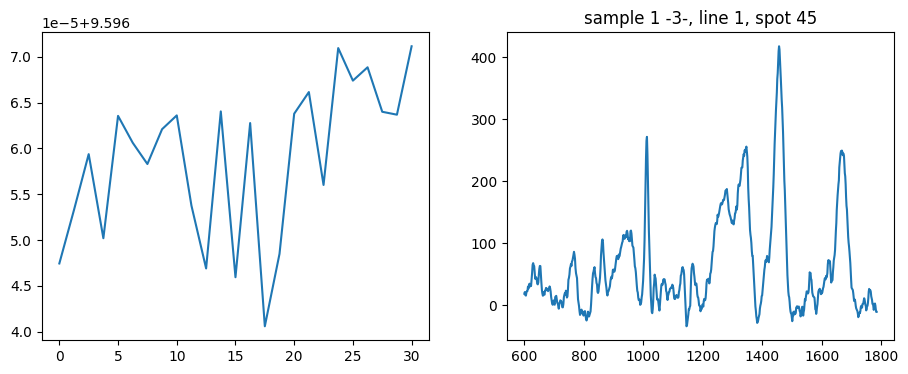

Send: MOVE X=-73243.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.300764083862305
Position =  12.523219141003041


<Figure size 640x480 with 0 Axes>

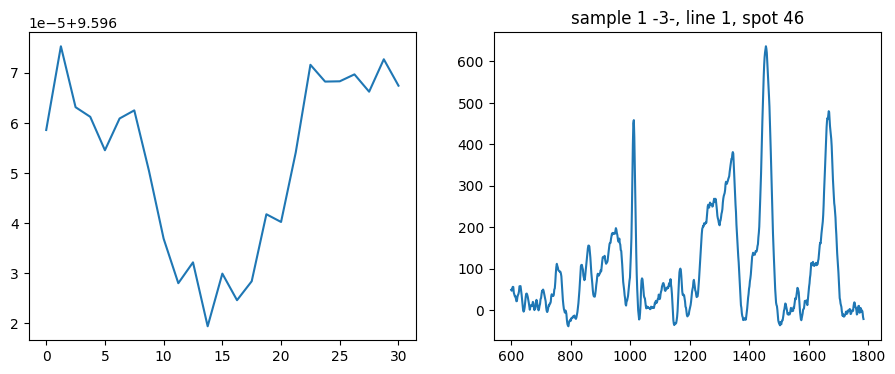

Send: MOVE X=-72448.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.444984912872314
Position =  16.270147299703606


<Figure size 640x480 with 0 Axes>

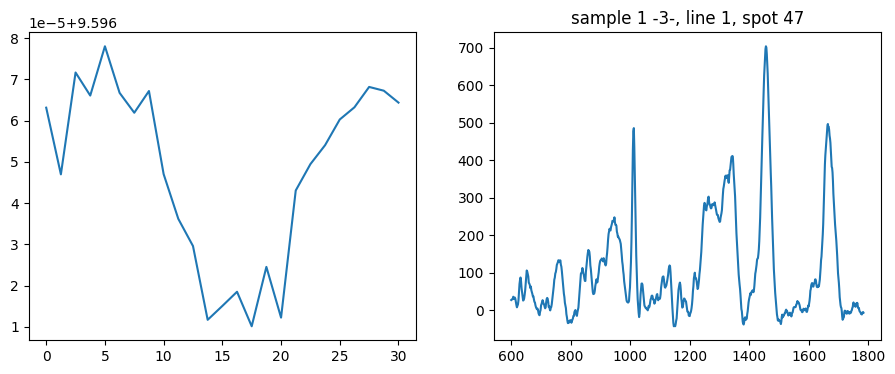

Send: MOVE X=-71653.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28463840484619
Position =  12.492915006548264


<Figure size 640x480 with 0 Axes>

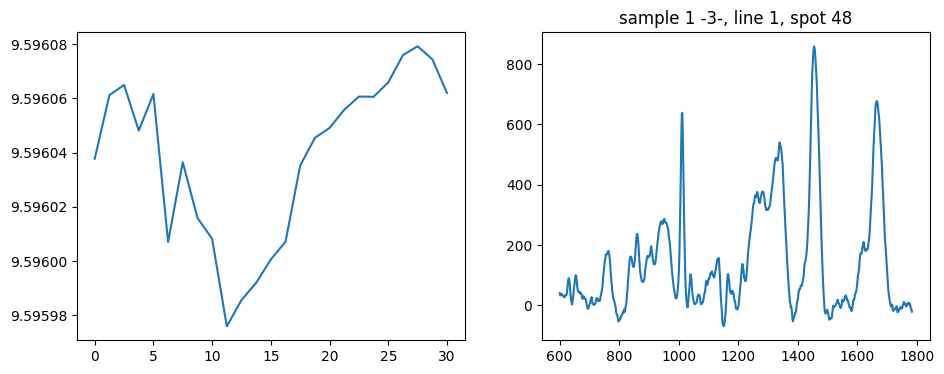

Send: MOVE X=-70858.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.511833906173706
Position =  11.269156194692084


<Figure size 640x480 with 0 Axes>

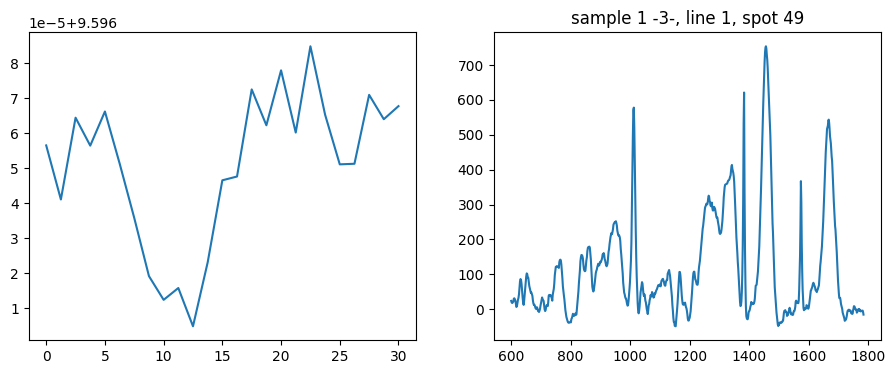

Send: MOVE X=-70063.0 Y=-251565.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.163028717041016
Position =  9.99542493389521


<Figure size 640x480 with 0 Axes>

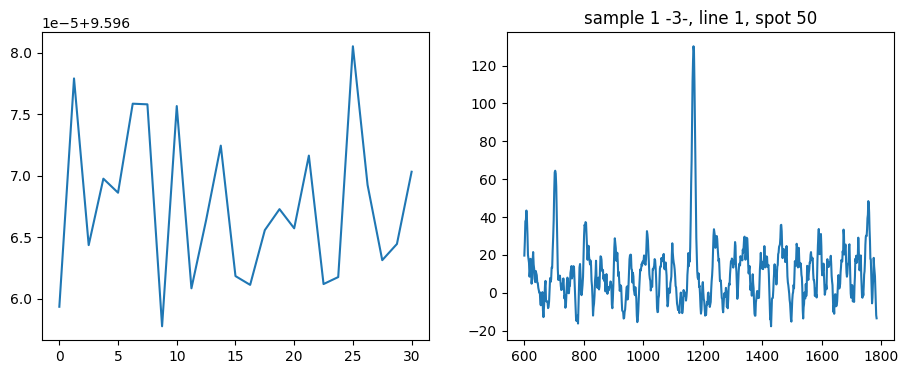

Send: MOVE X=-89201.0 Y=-271235.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.47621512413025
Position =  26.27260705712787


<Figure size 640x480 with 0 Axes>

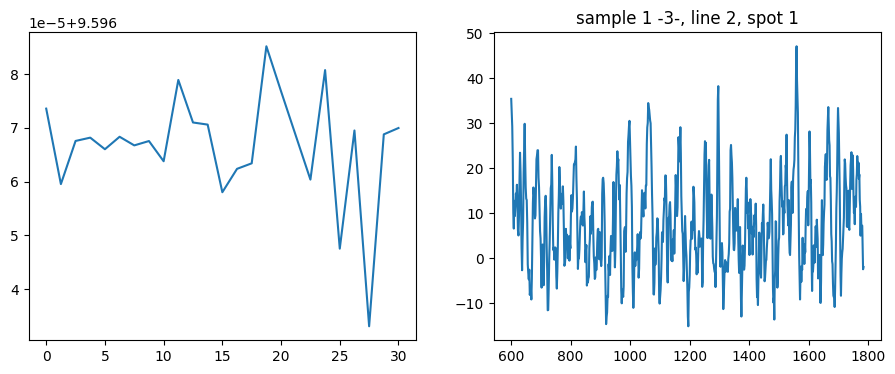

Send: MOVE X=-89201.0 Y=-270425.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.310805559158325
Position =  16.24534786559667


<Figure size 640x480 with 0 Axes>

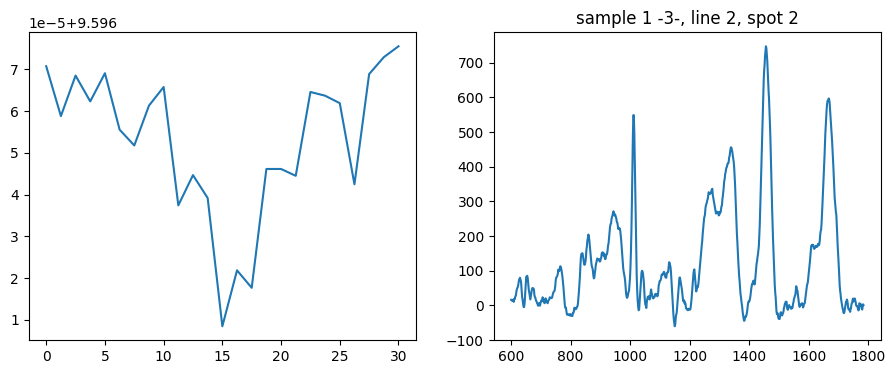

Send: MOVE X=-89201.0 Y=-269615.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.453898668289185
Position =  16.278521648357952


<Figure size 640x480 with 0 Axes>

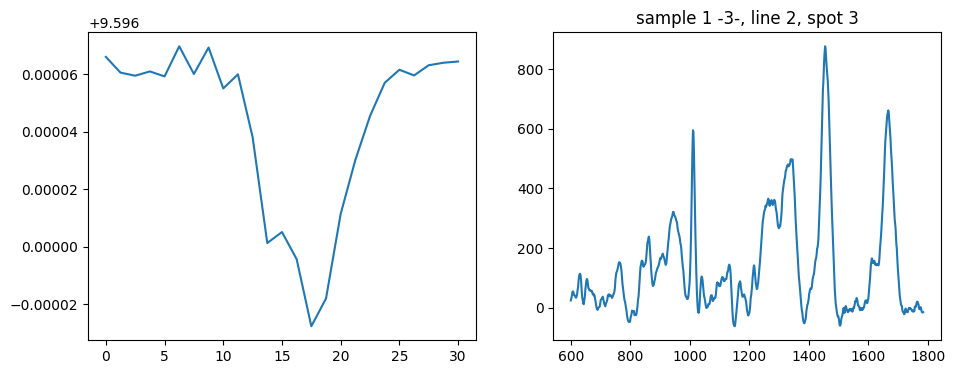

Send: MOVE X=-89201.0 Y=-268804.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.363126039505005
Position =  18.772230974393324


<Figure size 640x480 with 0 Axes>

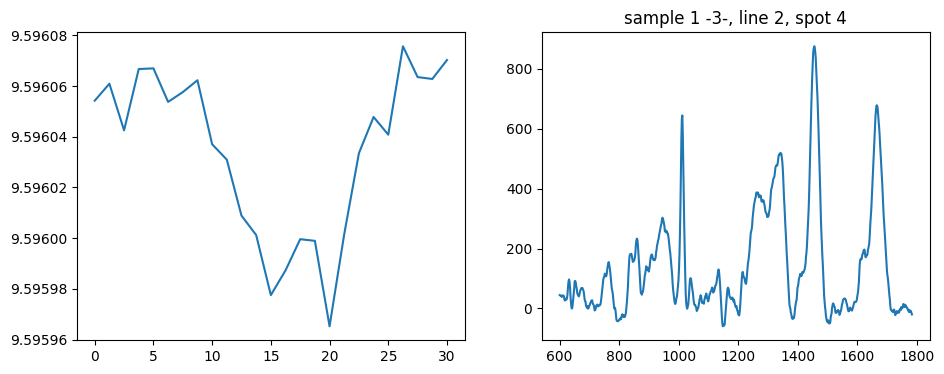

Send: MOVE X=-89201.0 Y=-267994.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31627368927002
Position =  17.51632728811654


<Figure size 640x480 with 0 Axes>

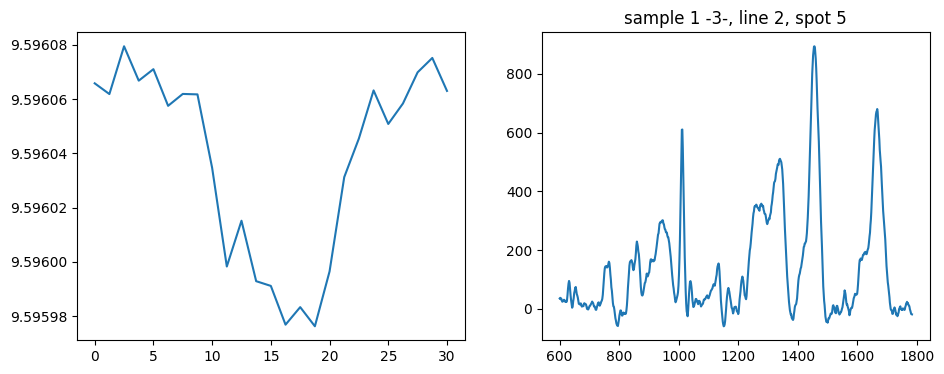

Send: MOVE X=-89201.0 Y=-267184.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.38215708732605
Position =  16.24545592604804


<Figure size 640x480 with 0 Axes>

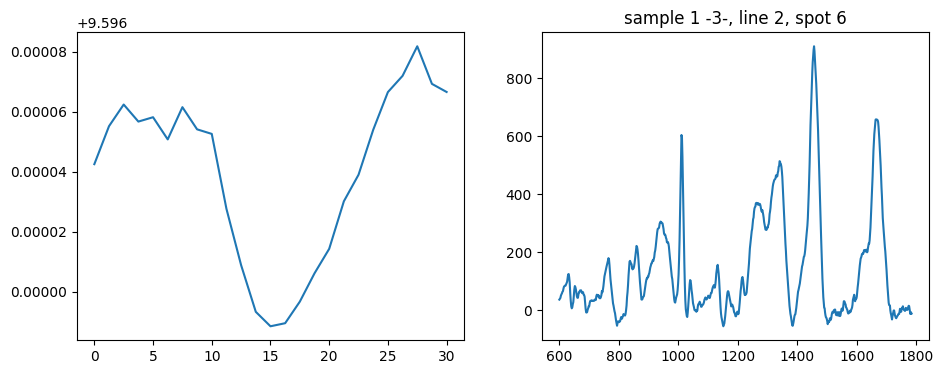

Send: MOVE X=-89201.0 Y=-266374.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.375995874404907
Position =  16.245942197478776


<Figure size 640x480 with 0 Axes>

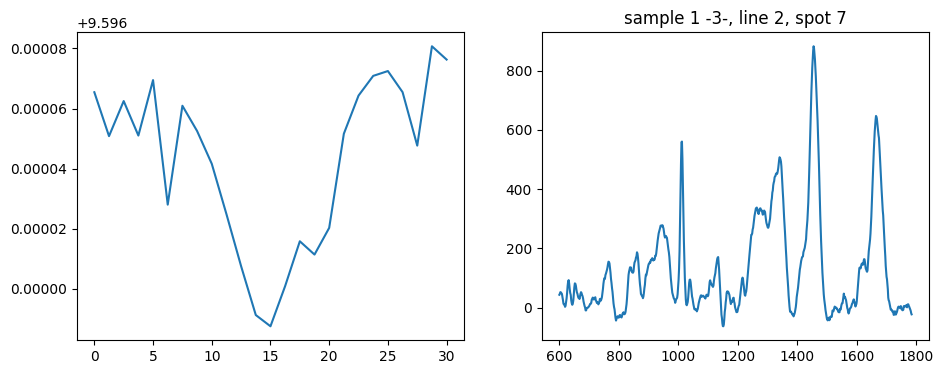

Send: MOVE X=-89201.0 Y=-265563.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.23794984817505
Position =  16.244645472782874


<Figure size 640x480 with 0 Axes>

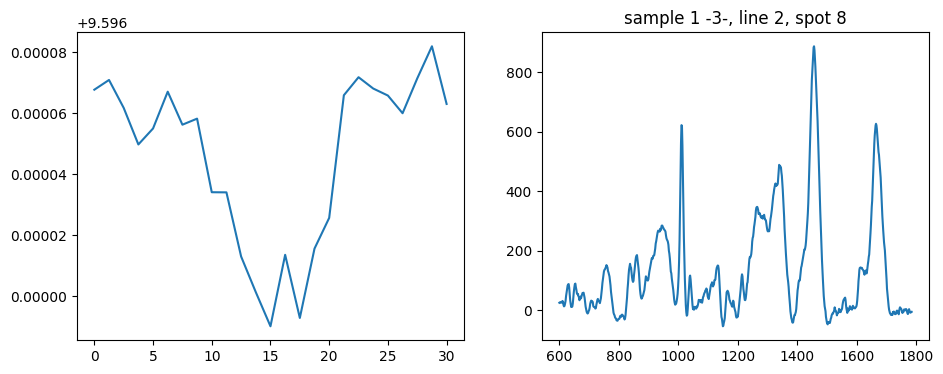

Send: MOVE X=-89201.0 Y=-264753.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.319360971450806
Position =  14.996126499374943


<Figure size 640x480 with 0 Axes>

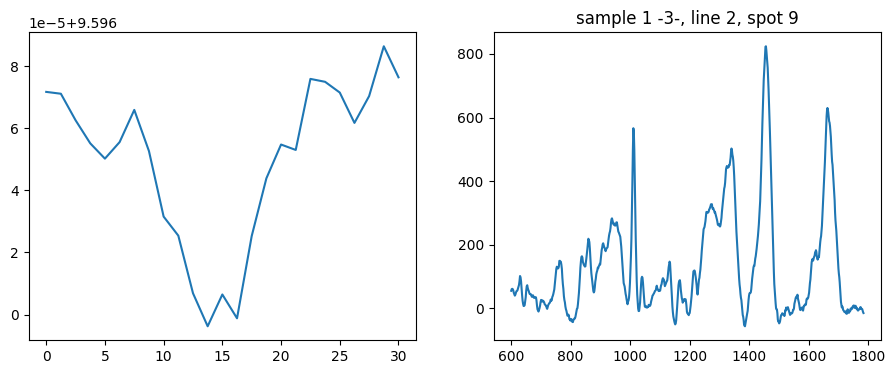

Send: MOVE X=-89201.0 Y=-263943.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.269872903823853
Position =  17.490653207727963


<Figure size 640x480 with 0 Axes>

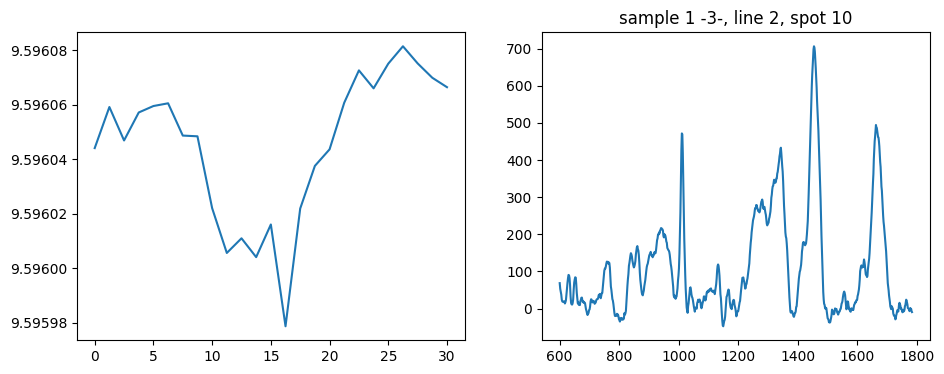

Send: MOVE X=-89201.0 Y=-263133.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.262434482574463
Position =  11.266871330837146


<Figure size 640x480 with 0 Axes>

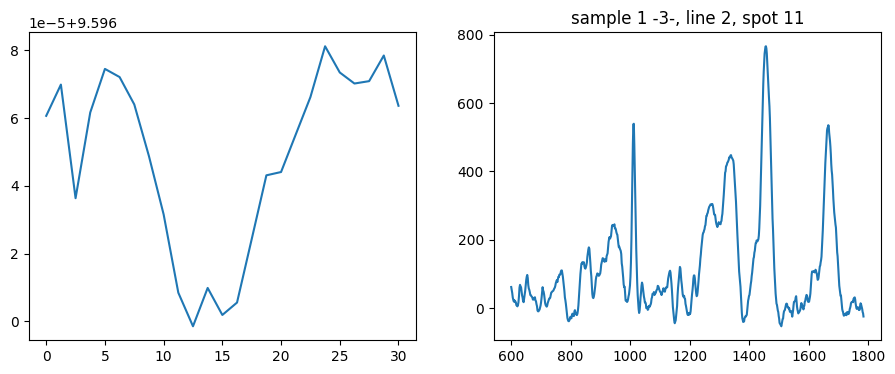

Send: MOVE X=-89201.0 Y=-262322.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32950186729431
Position =  13.783846788923478


<Figure size 640x480 with 0 Axes>

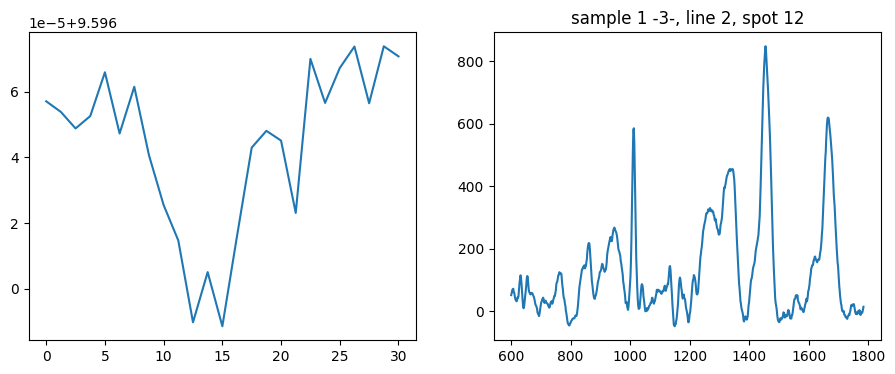

Send: MOVE X=-89201.0 Y=-261512.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.24906897544861
Position =  12.520286537952513


<Figure size 640x480 with 0 Axes>

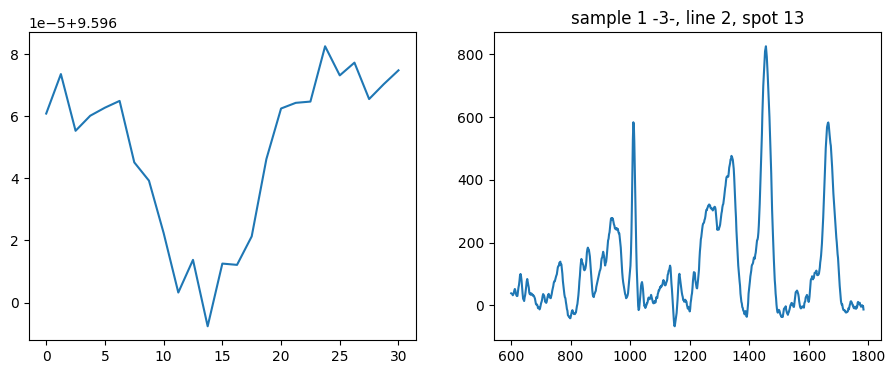

Send: MOVE X=-89201.0 Y=-260702.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28472352027893
Position =  12.519363308370027


<Figure size 640x480 with 0 Axes>

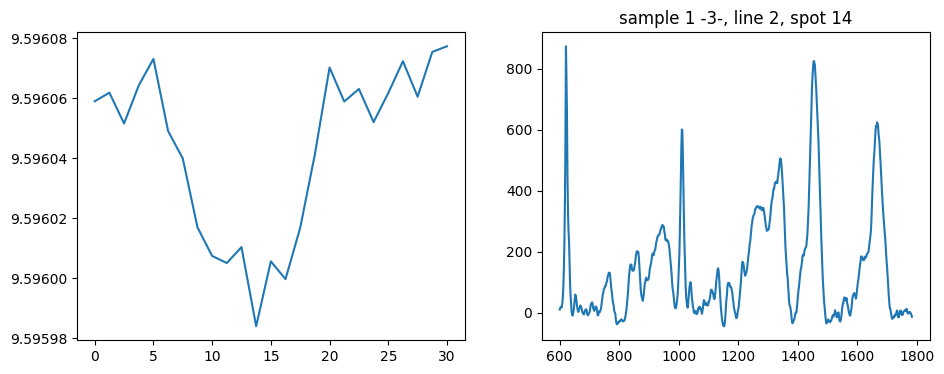

Send: MOVE X=-89201.0 Y=-259892.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.286454677581787
Position =  13.744866481705055


<Figure size 640x480 with 0 Axes>

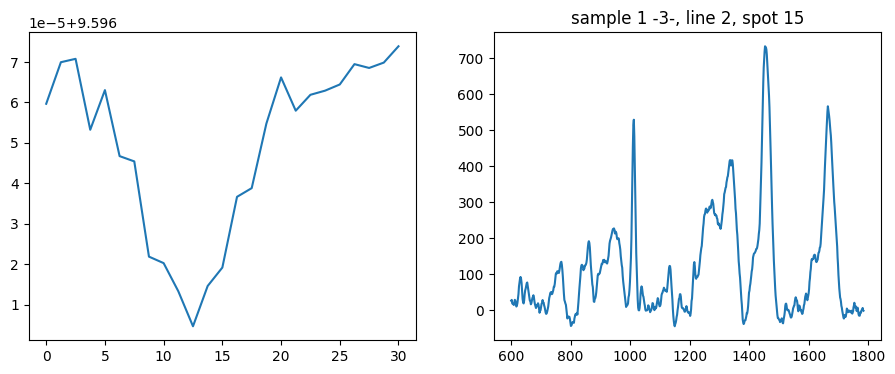

Send: MOVE X=-89201.0 Y=-259081.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34249496459961
Position =  12.49296931692537


<Figure size 640x480 with 0 Axes>

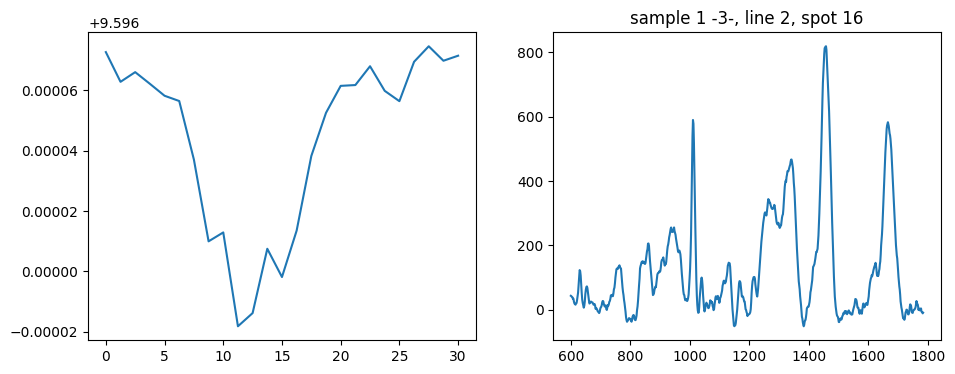

Send: MOVE X=-89201.0 Y=-258271.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.358991622924805
Position =  13.771594511681515


<Figure size 640x480 with 0 Axes>

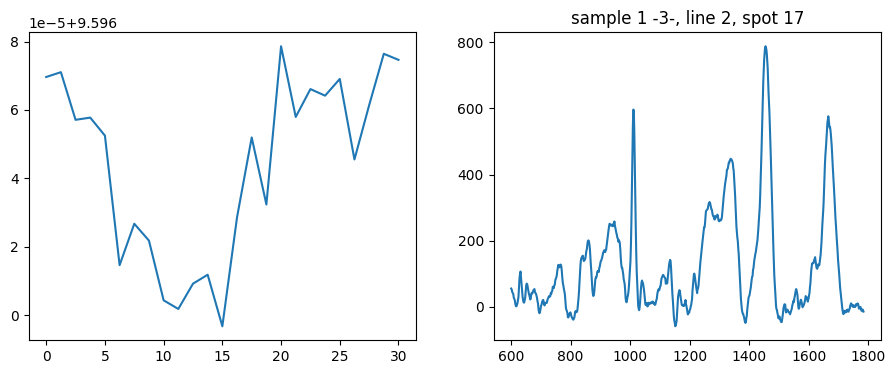

Send: MOVE X=-89201.0 Y=-257461.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.2664852142334
Position =  12.523273448331452


<Figure size 640x480 with 0 Axes>

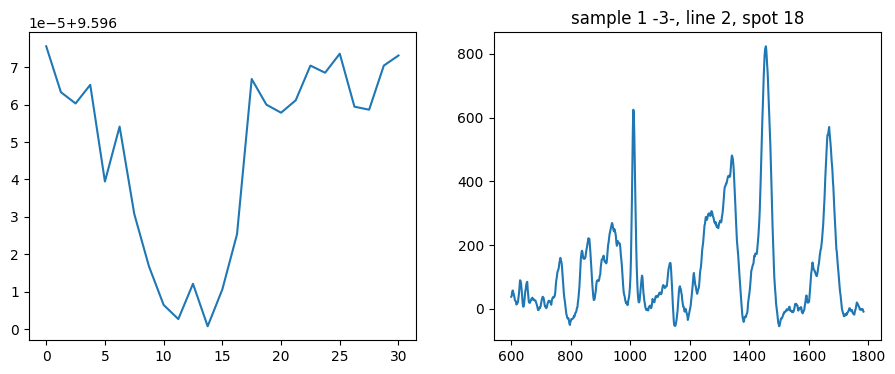

Send: MOVE X=-89201.0 Y=-256651.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.278085947036743
Position =  12.492480530116925


<Figure size 640x480 with 0 Axes>

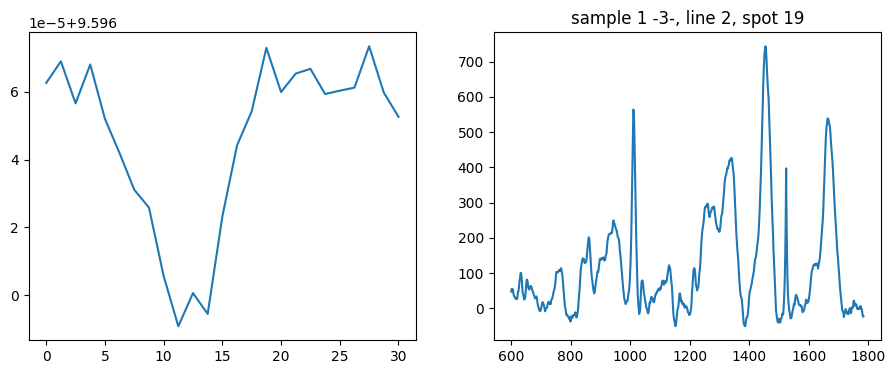

Send: MOVE X=-89201.0 Y=-255840.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.283873319625854
Position =  11.242118208683998


<Figure size 640x480 with 0 Axes>

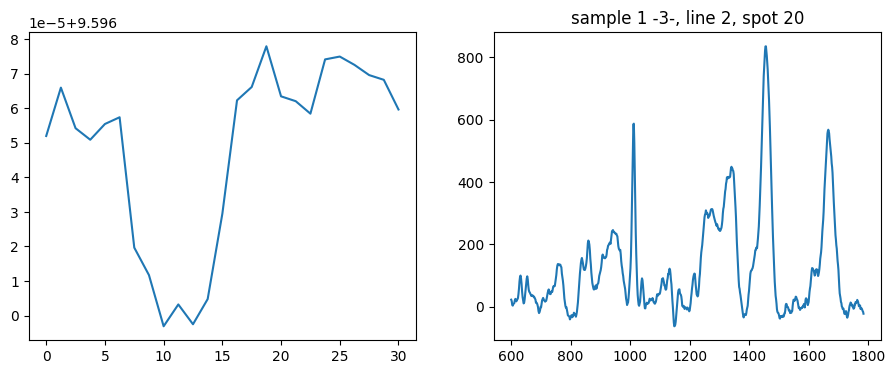

Send: MOVE X=-89201.0 Y=-255030.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.276045322418213
Position =  12.492534839518397


<Figure size 640x480 with 0 Axes>

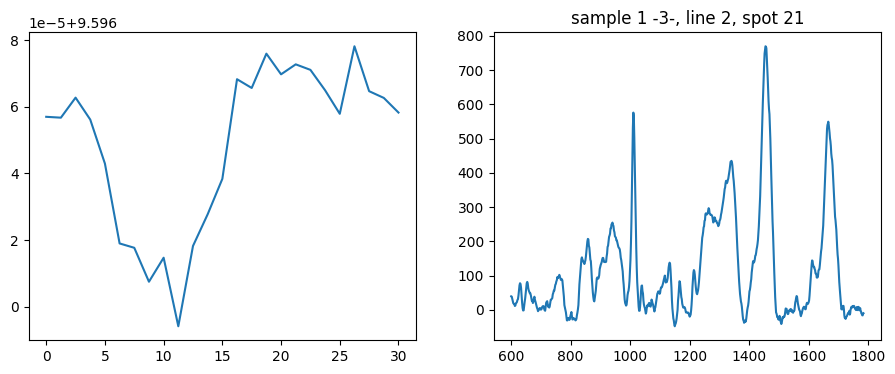

Send: MOVE X=-89201.0 Y=-254220.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.27093243598938
Position =  7.5211602786008545


<Figure size 640x480 with 0 Axes>

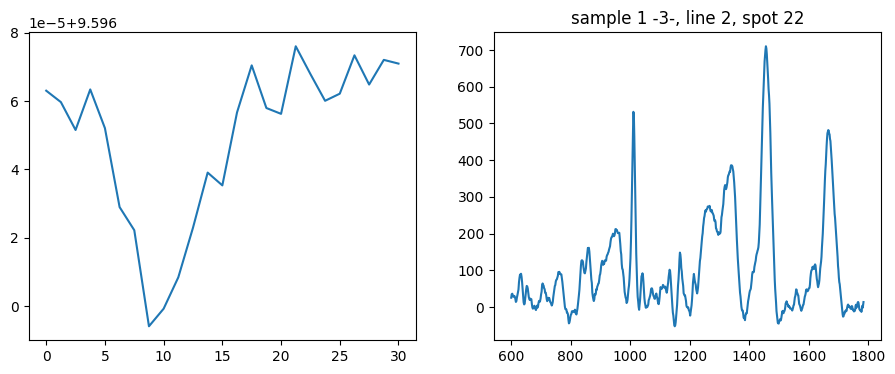

Send: MOVE X=-89201.0 Y=-253410.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.270209789276123
Position =  8.771580918117667


<Figure size 640x480 with 0 Axes>

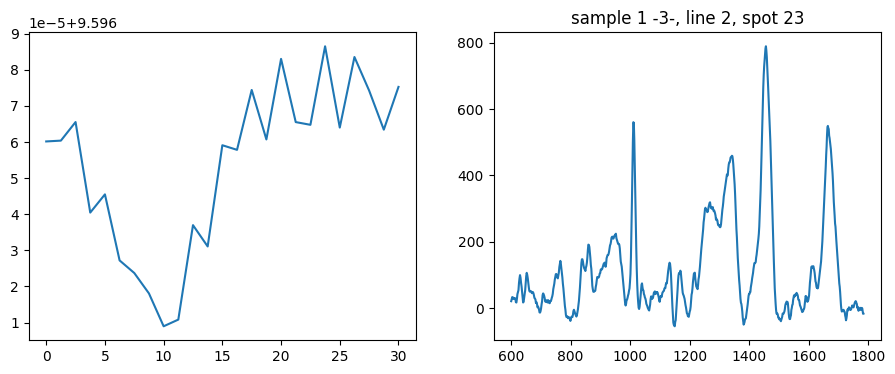

Send: MOVE X=-89201.0 Y=-252599.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28894329071045
Position =  8.777421980422078


<Figure size 640x480 with 0 Axes>

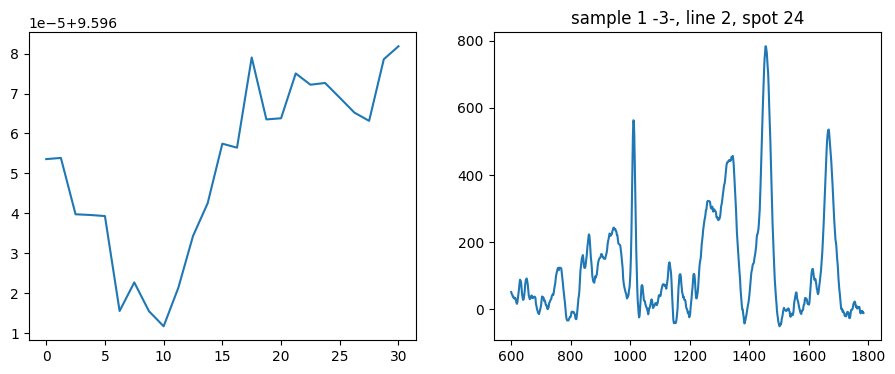

Send: MOVE X=-89201.0 Y=-251789.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.40112829208374
Position =  8.743193769366394


<Figure size 640x480 with 0 Axes>

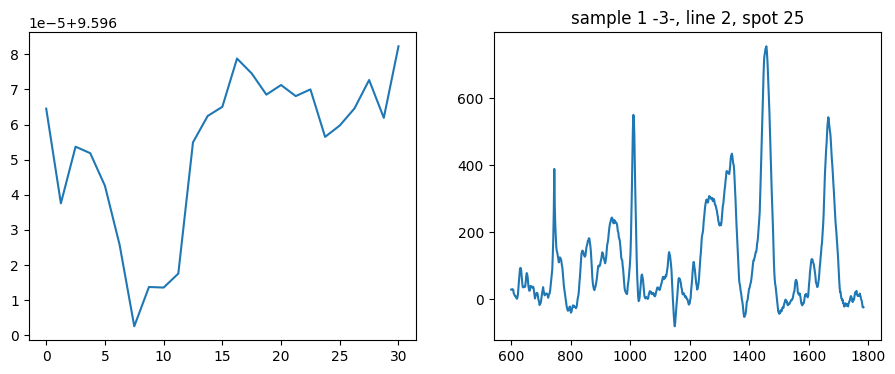

Send: MOVE X=-89201.0 Y=-250979.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.177269220352173
Position =  7.525917800771853


<Figure size 640x480 with 0 Axes>

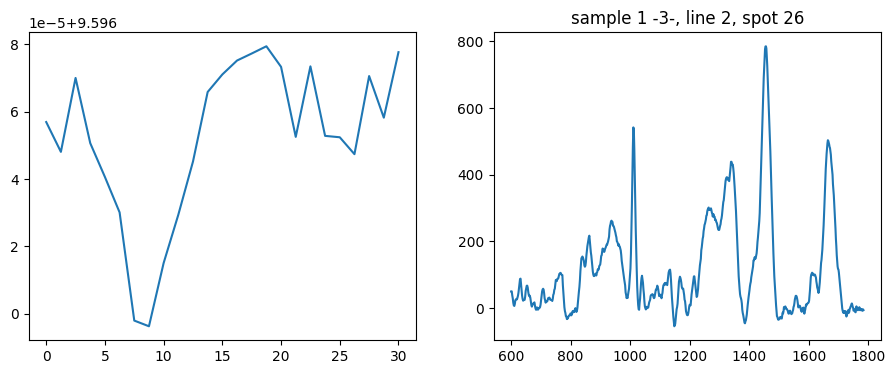

Send: MOVE X=-89201.0 Y=-250169.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.213966846466064
Position =  9.99596990603435


<Figure size 640x480 with 0 Axes>

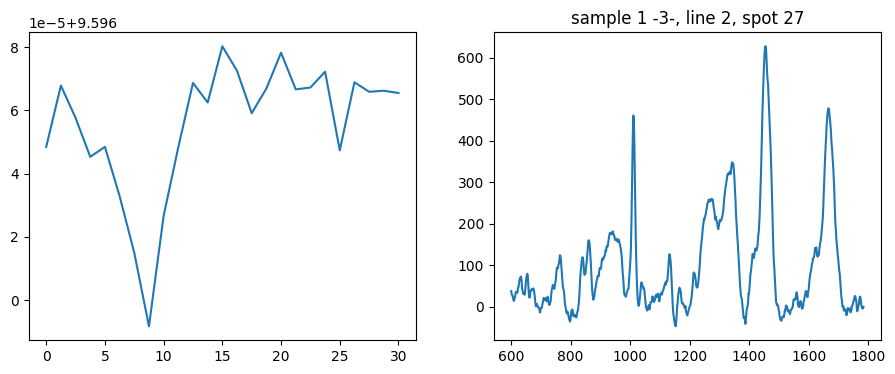

Send: MOVE X=-89201.0 Y=-249358.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.22042989730835
Position =  8.744121828211247


<Figure size 640x480 with 0 Axes>

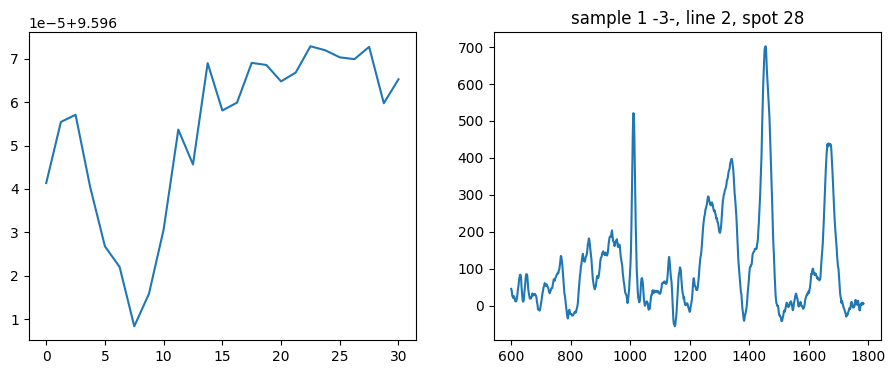

Send: MOVE X=-89201.0 Y=-248548.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34750485420227
Position =  6.270099899626183


<Figure size 640x480 with 0 Axes>

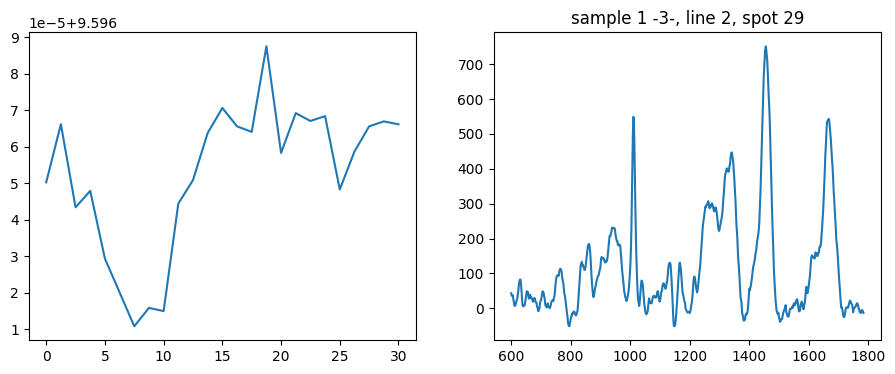

Send: MOVE X=-89201.0 Y=-247738.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.476682424545288
Position =  7.5355421071223265


<Figure size 640x480 with 0 Axes>

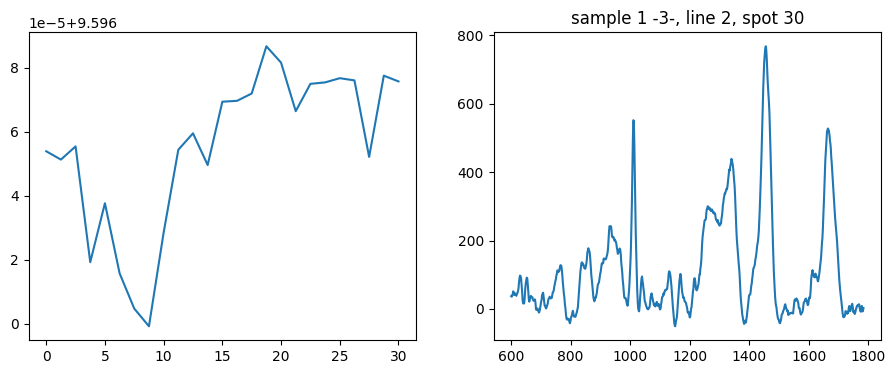

Send: MOVE X=-89201.0 Y=-246928.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34808611869812
Position =  7.519191635815214


<Figure size 640x480 with 0 Axes>

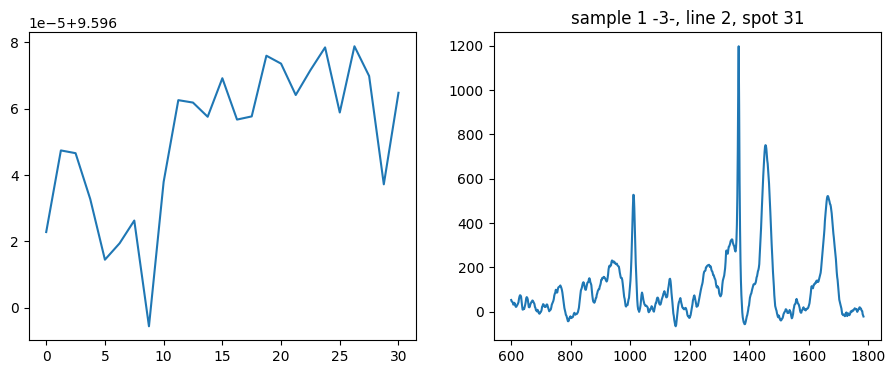

Send: MOVE X=-89201.0 Y=-246117.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.36579442024231
Position =  7.496606599573367


<Figure size 640x480 with 0 Axes>

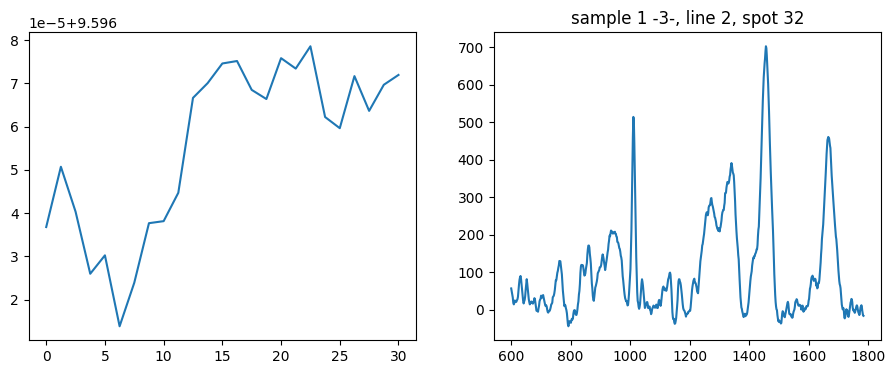

Send: MOVE X=-89201.0 Y=-245307.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.43802547454834
Position =  8.791396662271563


<Figure size 640x480 with 0 Axes>

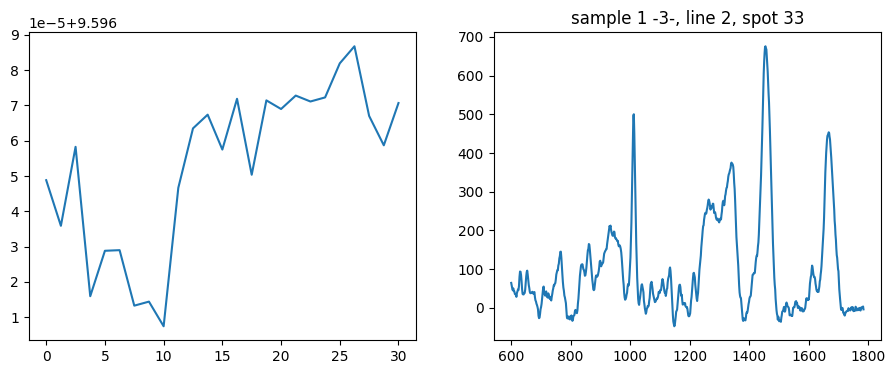

Send: MOVE X=-89201.0 Y=-244497.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.285777807235718
Position =  7.496715972130749


<Figure size 640x480 with 0 Axes>

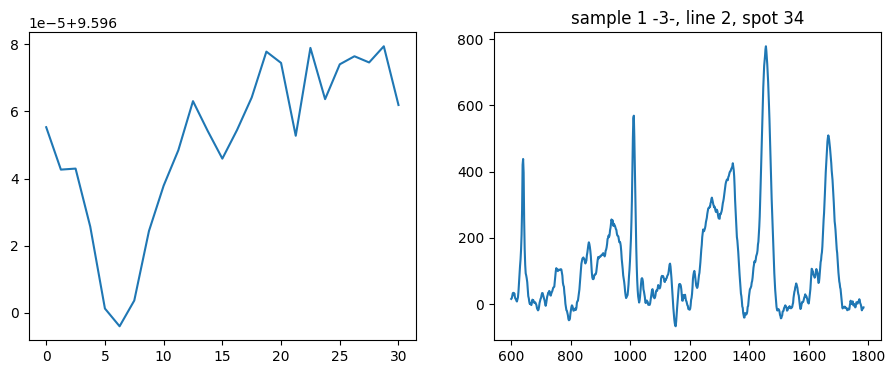

Send: MOVE X=-89201.0 Y=-243687.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.286489725112915
Position =  6.244736578113815


<Figure size 640x480 with 0 Axes>

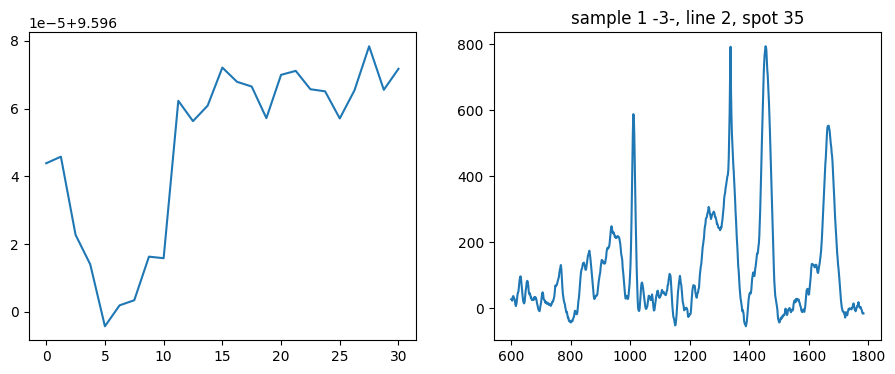

Send: MOVE X=-89201.0 Y=-242876.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33475947380066
Position =  7.496880030282026


<Figure size 640x480 with 0 Axes>

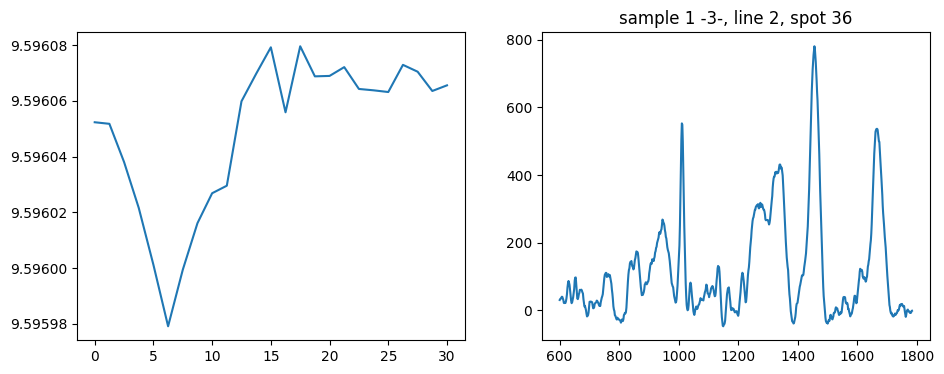

Send: MOVE X=-89201.0 Y=-242066.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.489672660827637
Position =  6.24413398275672


<Figure size 640x480 with 0 Axes>

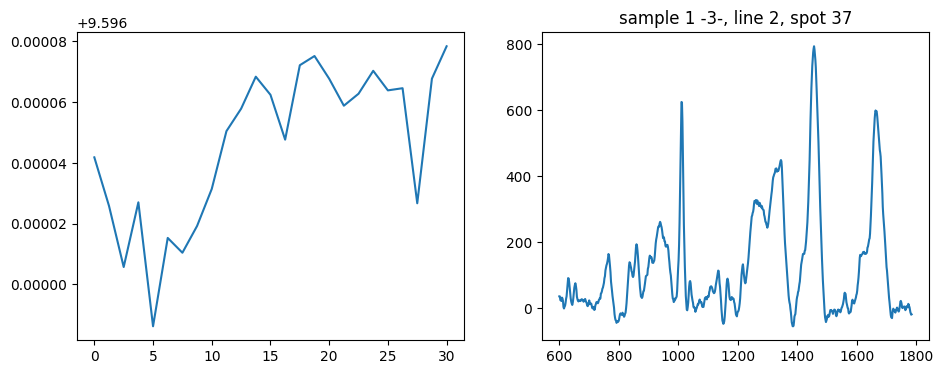

Send: MOVE X=-89201.0 Y=-241256.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.44319438934326
Position =  4.994744961263739


<Figure size 640x480 with 0 Axes>

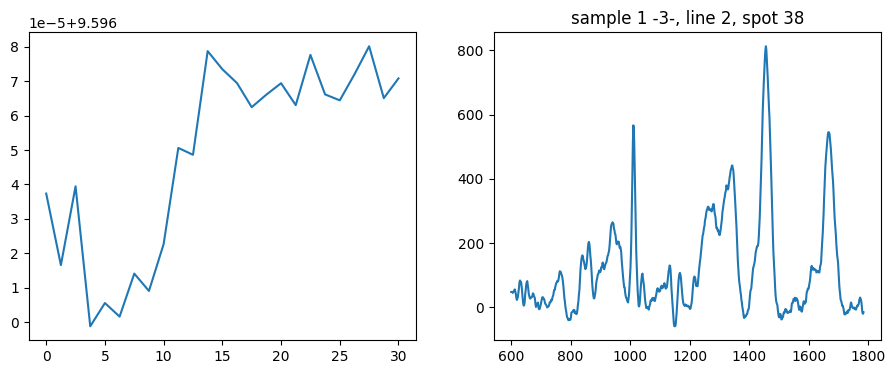

Send: MOVE X=-89201.0 Y=-240446.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.172722101211548
Position =  4.994635207972623


<Figure size 640x480 with 0 Axes>

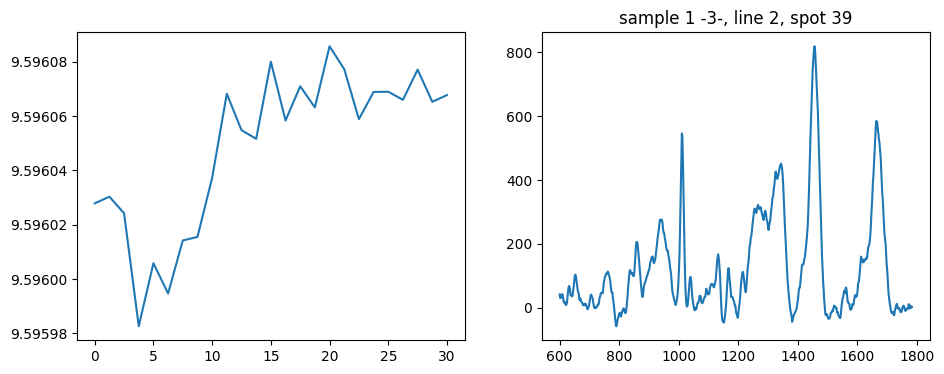

Send: MOVE X=-89201.0 Y=-239635.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39546298980713
Position =  3.7863304521130003


<Figure size 640x480 with 0 Axes>

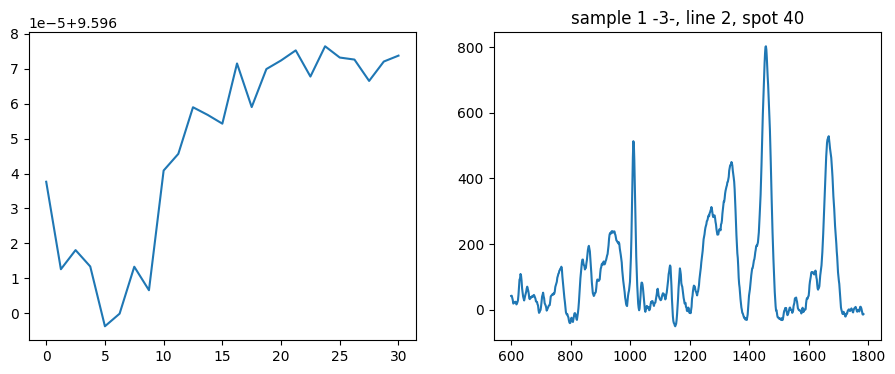

Send: MOVE X=-89201.0 Y=-238825.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.43558382987976
Position =  4.994854714680662


<Figure size 640x480 with 0 Axes>

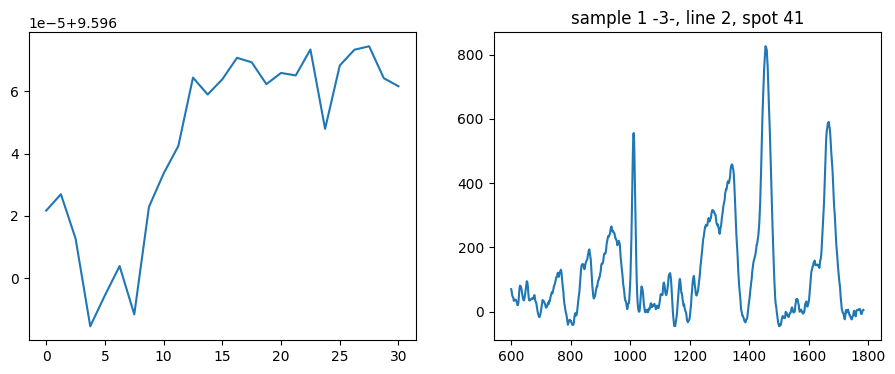

Send: MOVE X=-89201.0 Y=-238015.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33842158317566
Position =  6.273824892900127


<Figure size 640x480 with 0 Axes>

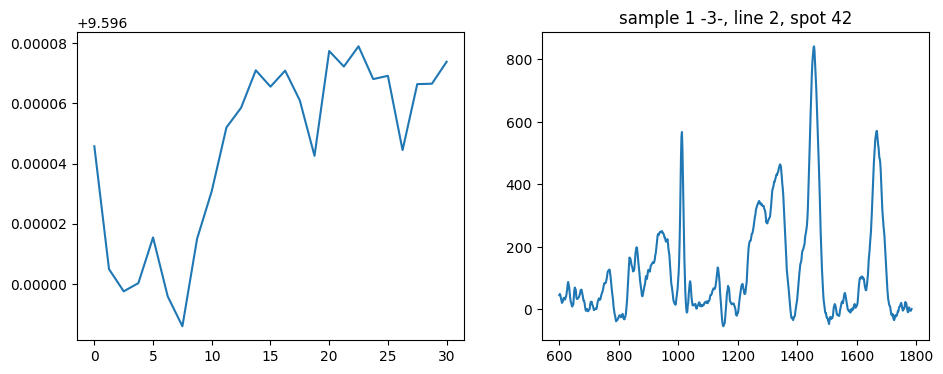

Send: MOVE X=-89201.0 Y=-237205.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.328020095825195
Position =  3.741694054505543


<Figure size 640x480 with 0 Axes>

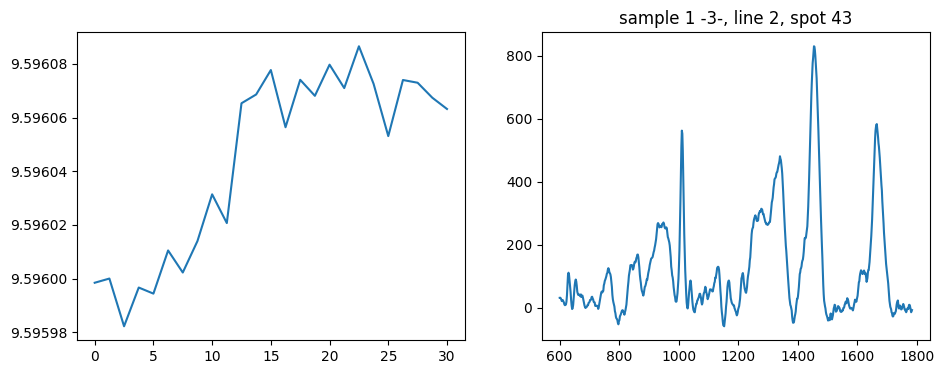

Send: MOVE X=-89201.0 Y=-236394.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.561014890670776
Position =  3.7414741635629856


<Figure size 640x480 with 0 Axes>

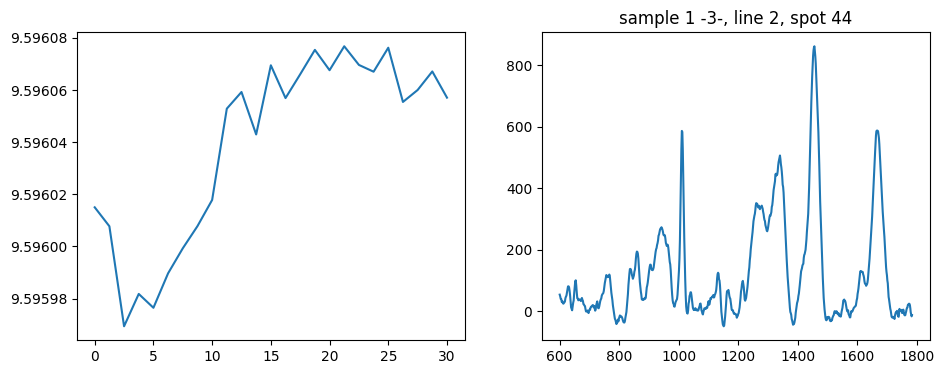

Send: MOVE X=-89201.0 Y=-235584.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39598512649536
Position =  5.032005286527465


<Figure size 640x480 with 0 Axes>

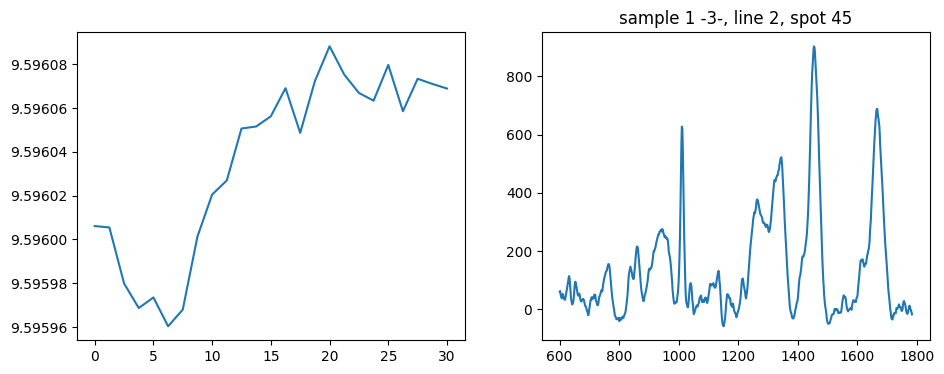

Send: MOVE X=-89201.0 Y=-234774.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.54639720916748
Position =  3.7734675428950224


<Figure size 640x480 with 0 Axes>

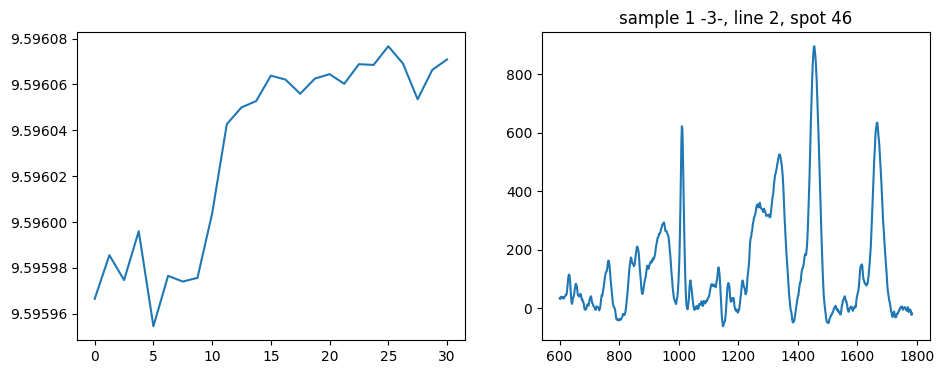

Send: MOVE X=-89201.0 Y=-233964.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.27927851676941
Position =  6.244298327149823


<Figure size 640x480 with 0 Axes>

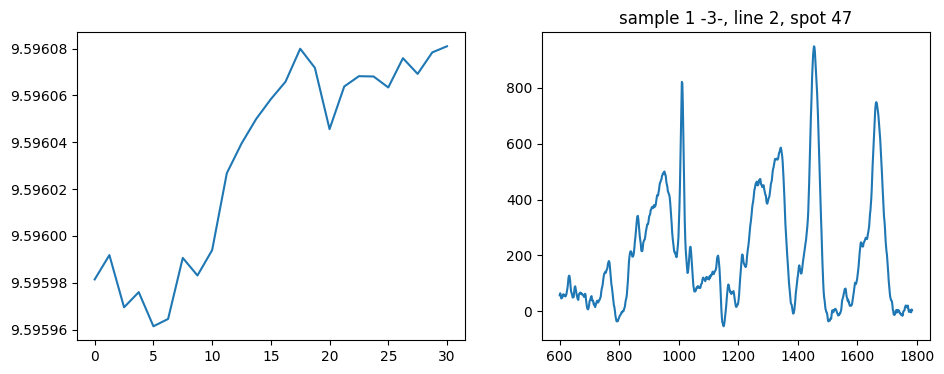

Send: MOVE X=-89201.0 Y=-233153.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.371838569641113
Position =  3.7412542735057643


<Figure size 640x480 with 0 Axes>

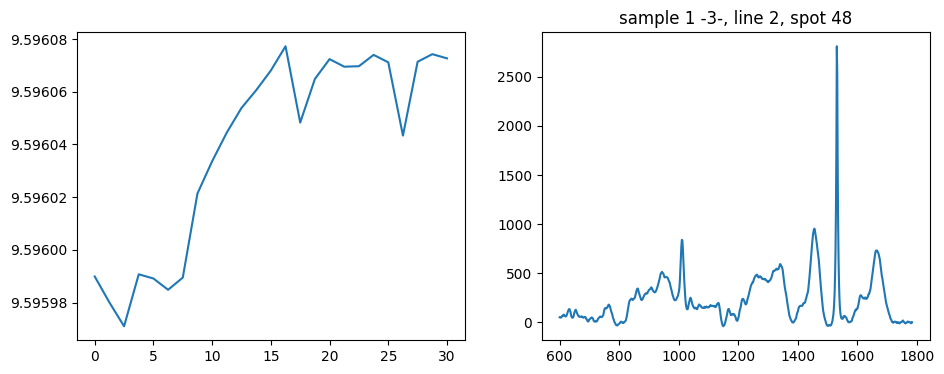

Send: MOVE X=-89201.0 Y=-232343.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.259805917739868
Position =  2.4941585221874027


<Figure size 640x480 with 0 Axes>

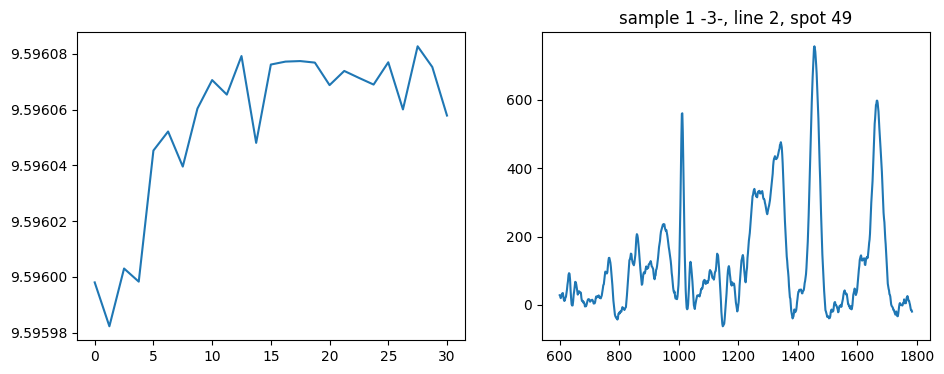

Send: MOVE X=-89201.0 Y=-231533.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.388834714889526
Position =  17.49103077468364


<Figure size 640x480 with 0 Axes>

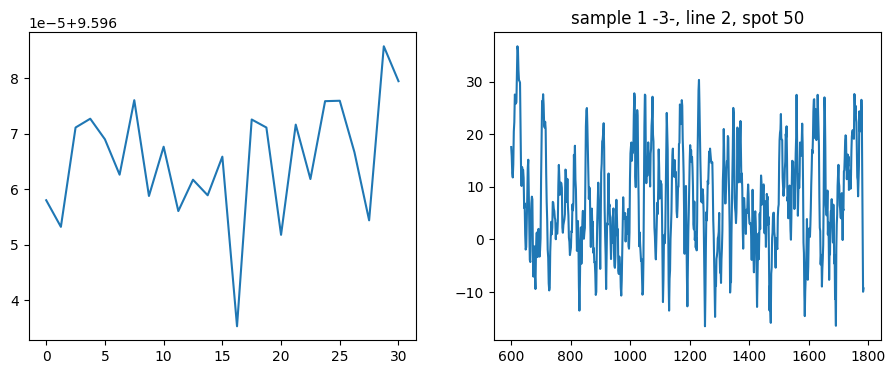

Send: MOVE X=-103218.0 Y=-237400.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.293139696121216
Position =  2.4944889330953552


<Figure size 640x480 with 0 Axes>

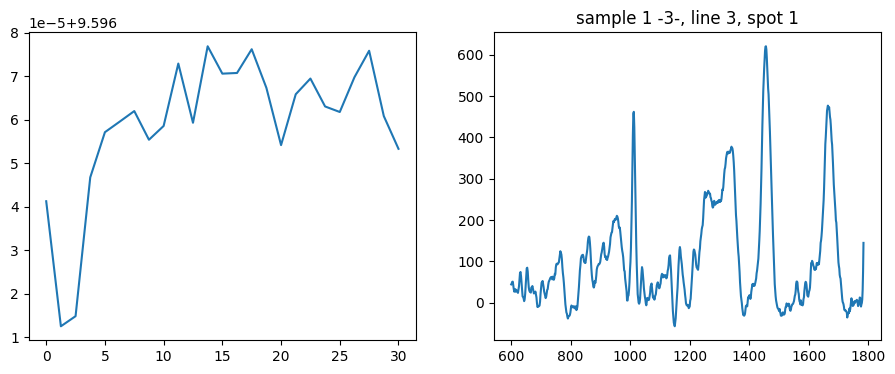

Send: MOVE X=-102656.0 Y=-237973.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.501439094543457
Position =  4.994854715058102


<Figure size 640x480 with 0 Axes>

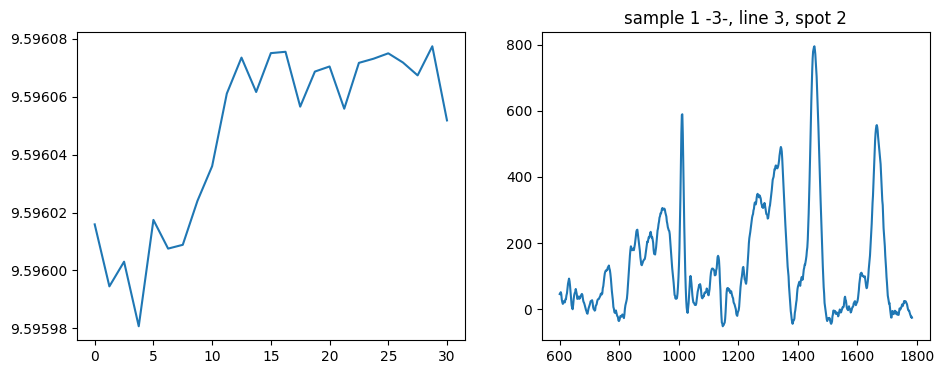

Send: MOVE X=-102094.0 Y=-238546.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.290178298950195
Position =  6.271852840780804


<Figure size 640x480 with 0 Axes>

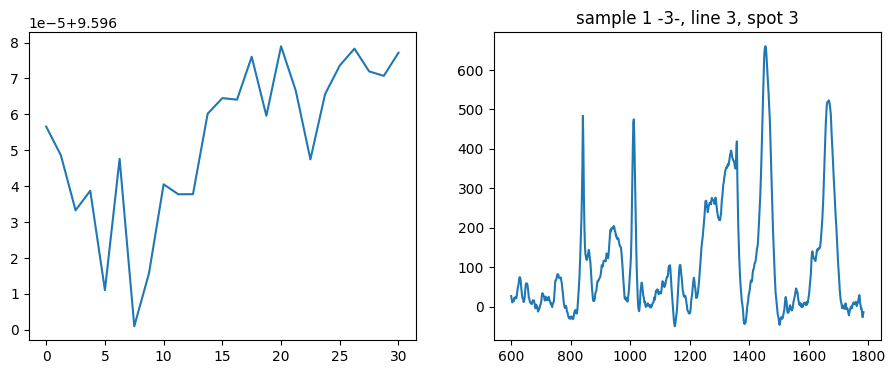

Send: MOVE X=-101531.0 Y=-239119.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.478336334228516
Position =  9.996623871344479


<Figure size 640x480 with 0 Axes>

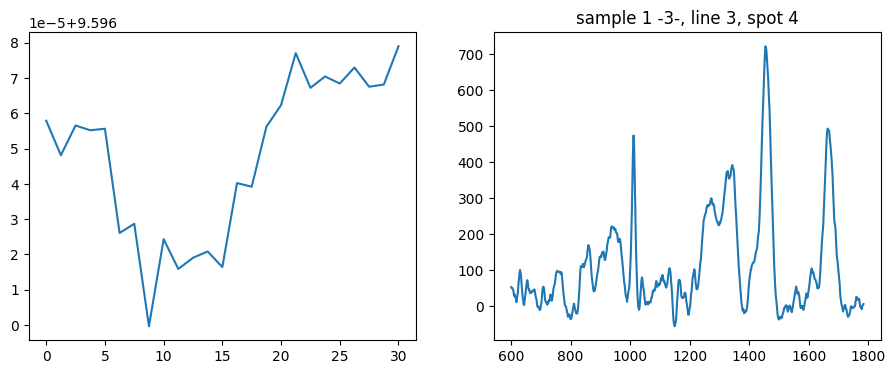

Send: MOVE X=-100969.0 Y=-239692.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.338565826416016
Position =  12.51827715509515


<Figure size 640x480 with 0 Axes>

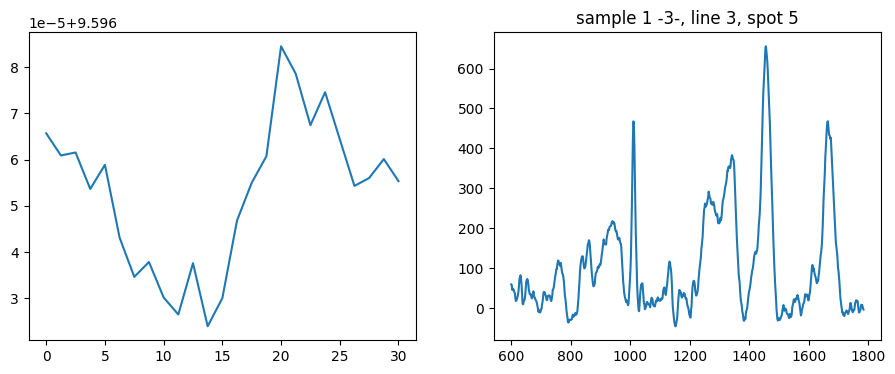

Send: MOVE X=-100407.0 Y=-240265.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.502814054489136
Position =  8.774528750265148


<Figure size 640x480 with 0 Axes>

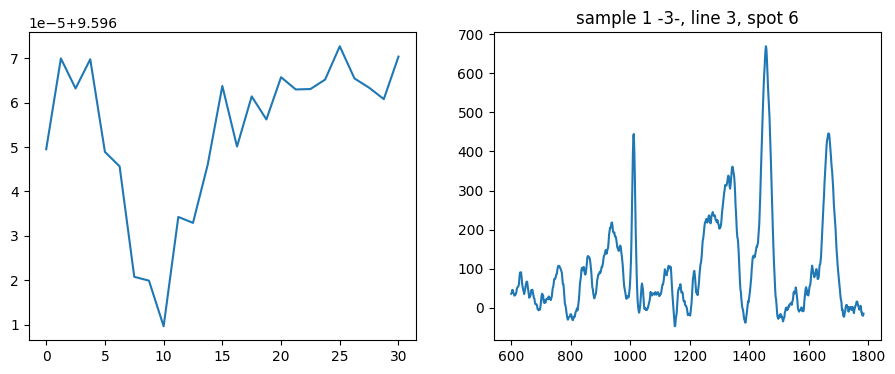

Send: MOVE X=-99845.0 Y=-240838.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.38814401626587
Position =  7.496059737658022


<Figure size 640x480 with 0 Axes>

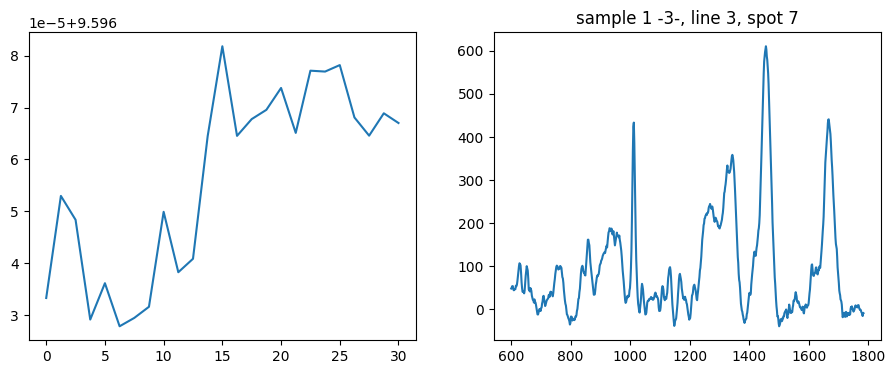

Send: MOVE X=-99282.0 Y=-241411.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.59989333152771
Position =  5.025200895354327


<Figure size 640x480 with 0 Axes>

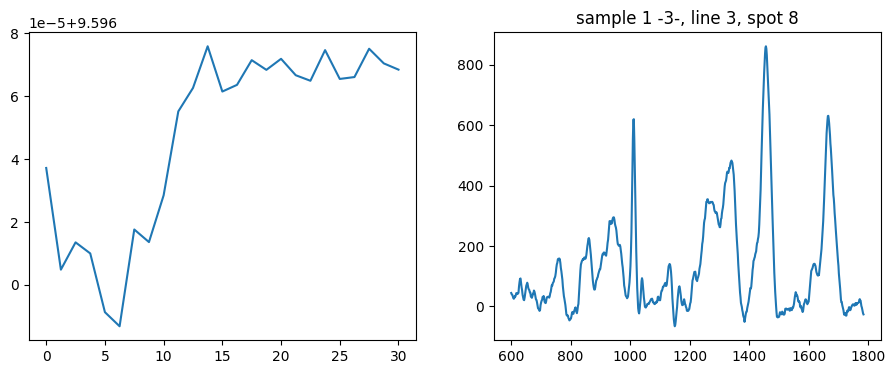

Send: MOVE X=-98720.0 Y=-241984.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.287731885910034
Position =  3.741309246083308


<Figure size 640x480 with 0 Axes>

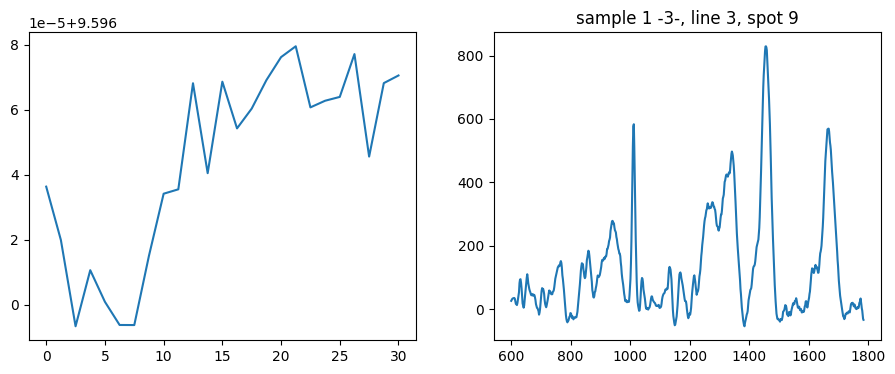

Send: MOVE X=-98158.0 Y=-242557.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.628013610839844
Position =  4.9941961934242105


<Figure size 640x480 with 0 Axes>

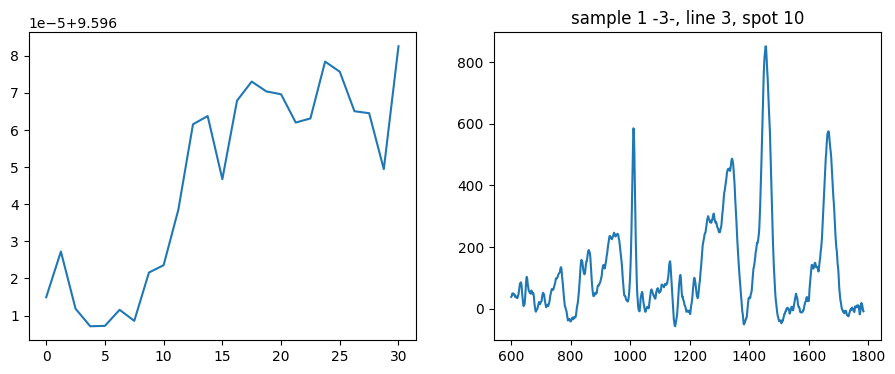

Send: MOVE X=-97596.0 Y=-243130.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.259985208511353
Position =  4.9948547151839175


<Figure size 640x480 with 0 Axes>

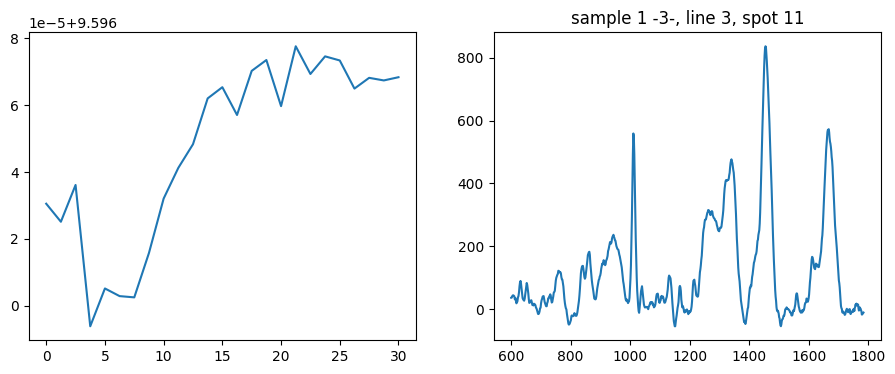

Send: MOVE X=-97033.0 Y=-243702.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.644118309020996
Position =  8.74335754474811


<Figure size 640x480 with 0 Axes>

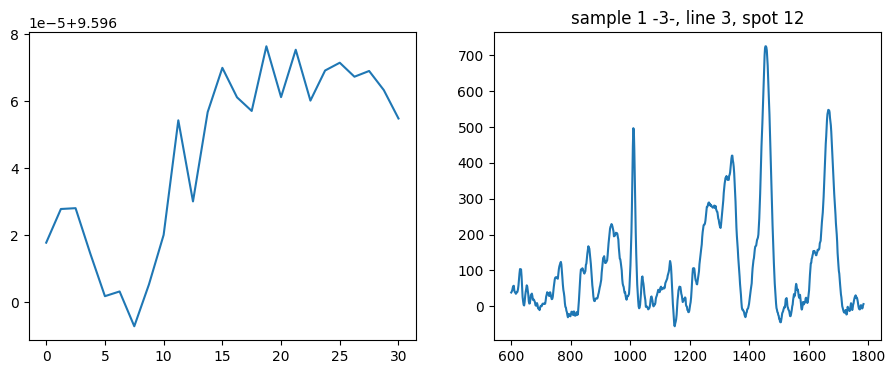

Send: MOVE X=-96471.0 Y=-244275.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.296674489974976
Position =  7.519465059676222


<Figure size 640x480 with 0 Axes>

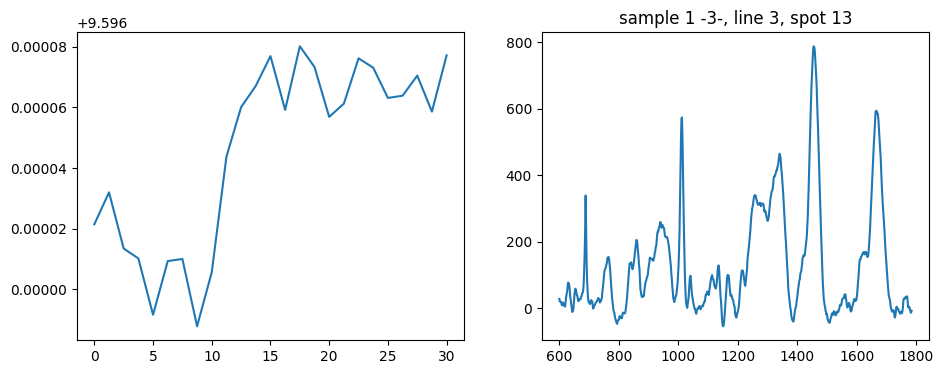

Send: MOVE X=-95909.0 Y=-244848.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.58673858642578
Position =  5.025749639793904


<Figure size 640x480 with 0 Axes>

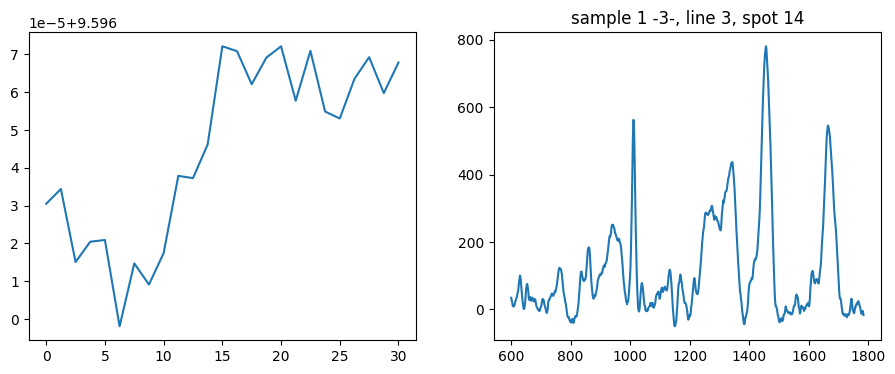

Send: MOVE X=-95347.0 Y=-245421.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.388967275619507
Position =  5.026463005300992


<Figure size 640x480 with 0 Axes>

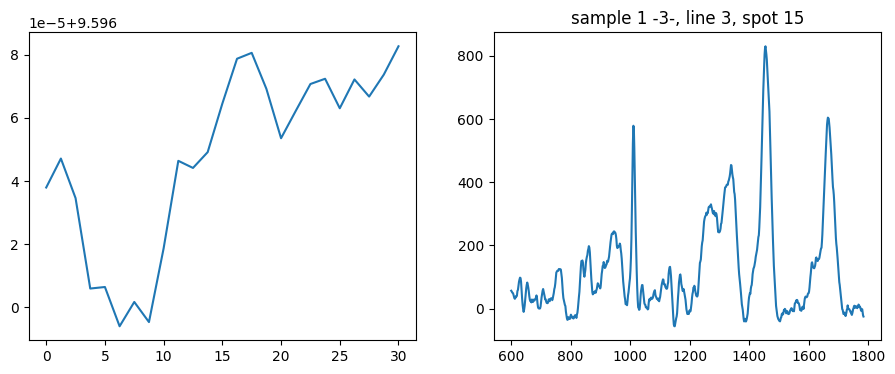

Send: MOVE X=-94784.0 Y=-245994.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.499314069747925
Position =  3.777590293224826


<Figure size 640x480 with 0 Axes>

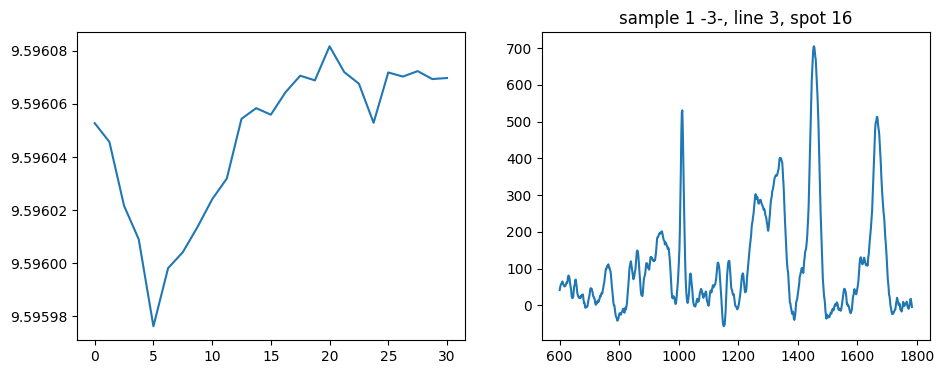

Send: MOVE X=-94222.0 Y=-246567.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.24986982345581
Position =  6.278097652635906


<Figure size 640x480 with 0 Axes>

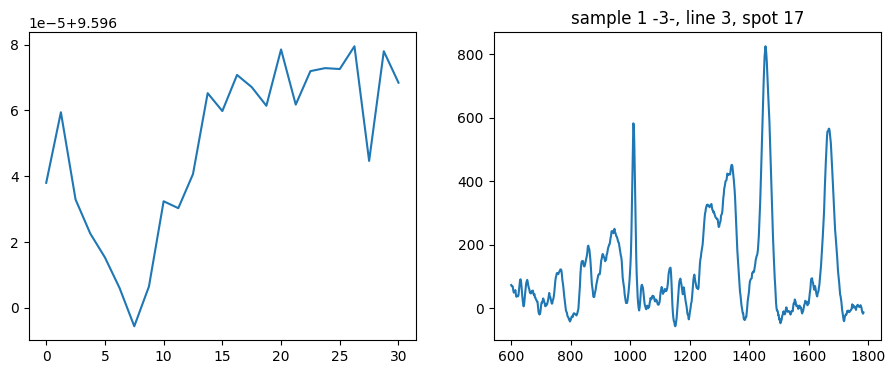

Send: MOVE X=-93660.0 Y=-247140.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.475735902786255
Position =  4.994580331515784


<Figure size 640x480 with 0 Axes>

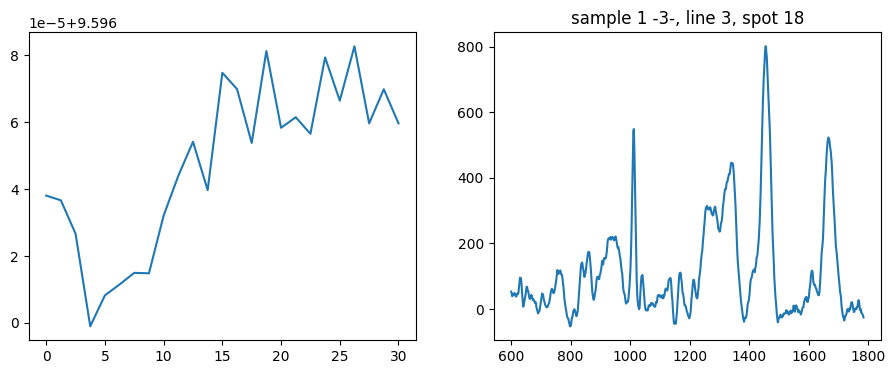

Send: MOVE X=-93098.0 Y=-247713.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28919219970703
Position =  7.529472246476581


<Figure size 640x480 with 0 Axes>

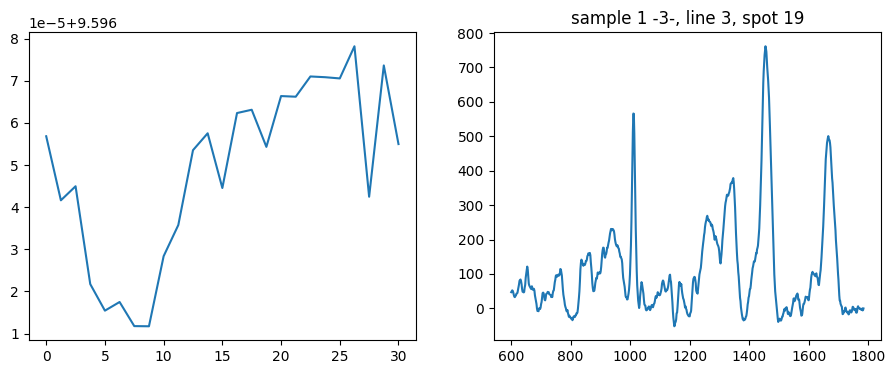

Send: MOVE X=-92535.0 Y=-248286.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.426461935043335
Position =  7.529253513438145


<Figure size 640x480 with 0 Axes>

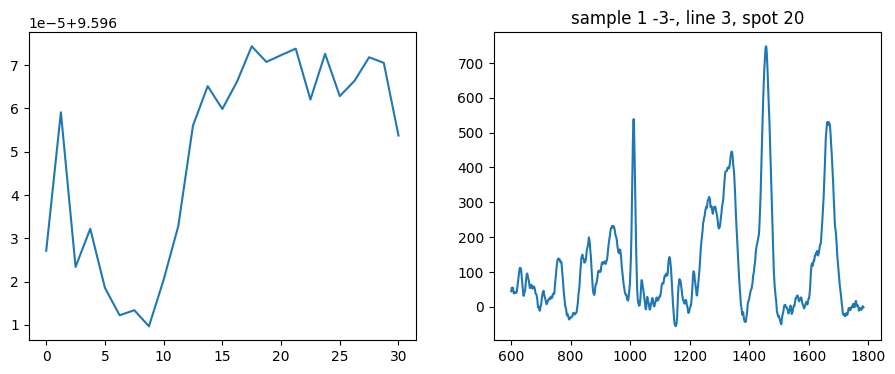

Send: MOVE X=-91973.0 Y=-248859.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.2113835811615
Position =  7.519629115461874


<Figure size 640x480 with 0 Axes>

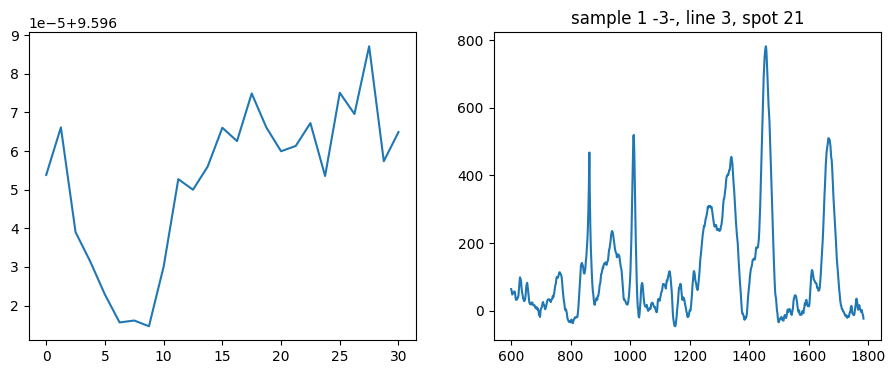

Send: MOVE X=-91411.0 Y=-249432.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.42170286178589
Position =  5.025200896989707


<Figure size 640x480 with 0 Axes>

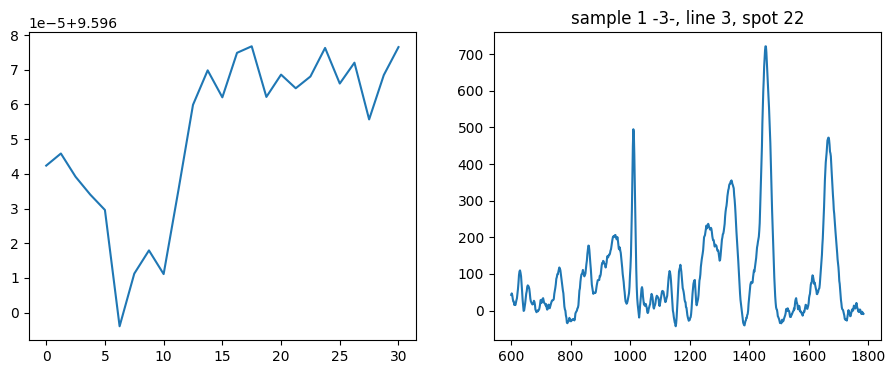

Send: MOVE X=-90849.0 Y=-250005.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.321921825408936
Position =  7.496059737409003


<Figure size 640x480 with 0 Axes>

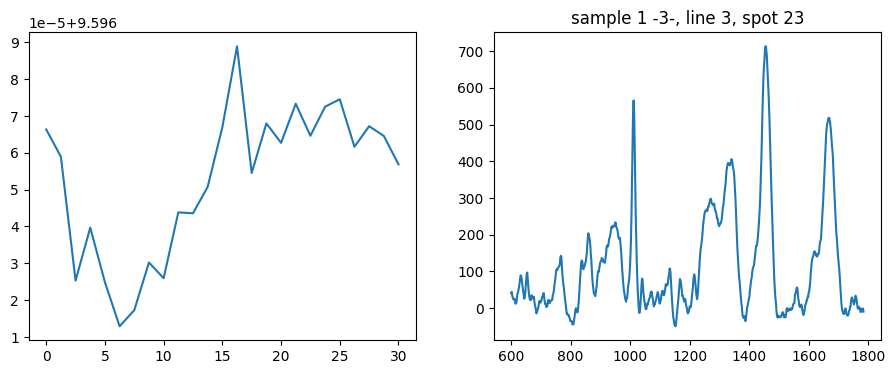

Send: MOVE X=-90287.0 Y=-250578.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.509405612945557
Position =  3.7713786705660883


<Figure size 640x480 with 0 Axes>

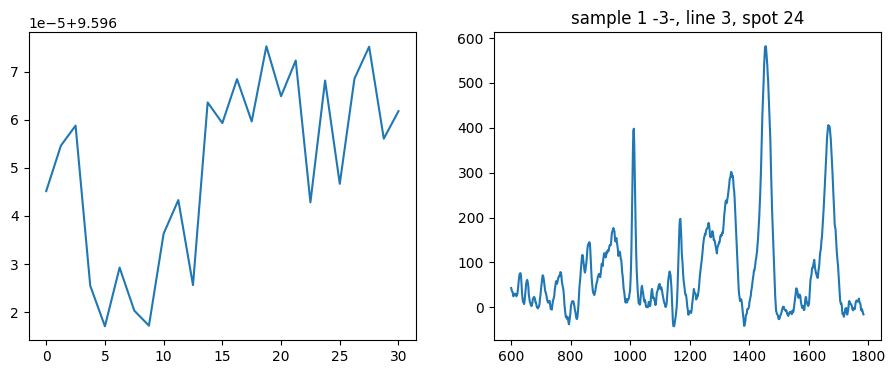

Send: MOVE X=-89724.0 Y=-251151.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.413119554519653
Position =  8.744067235880594


<Figure size 640x480 with 0 Axes>

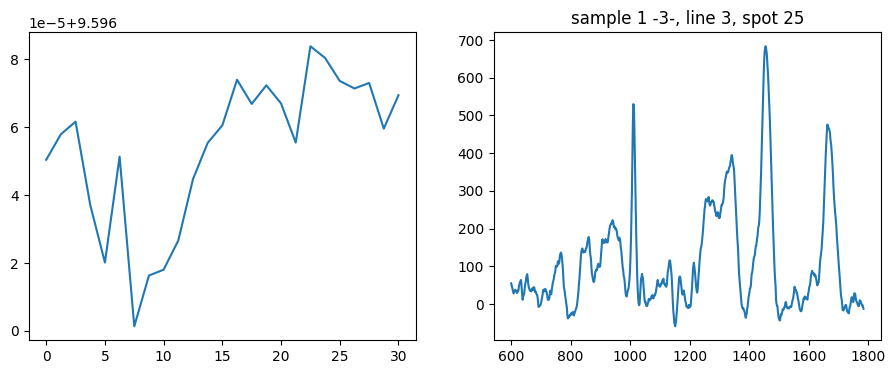

Send: MOVE X=-89162.0 Y=-251723.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.5496244430542
Position =  7.495403502189221


<Figure size 640x480 with 0 Axes>

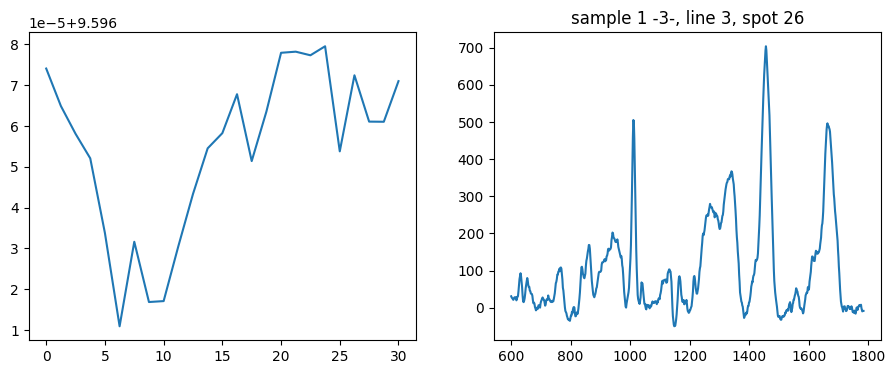

Send: MOVE X=-88600.0 Y=-252296.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.290595531463623
Position =  8.743794278190997


<Figure size 640x480 with 0 Axes>

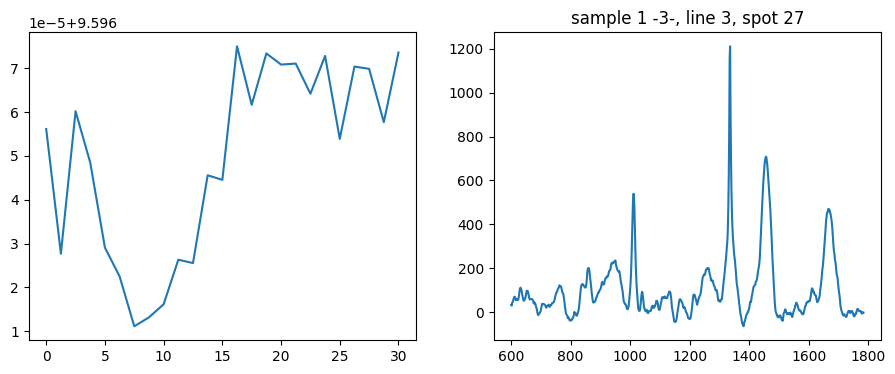

Send: MOVE X=-88038.0 Y=-252869.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.59557294845581
Position =  7.527230213816787


<Figure size 640x480 with 0 Axes>

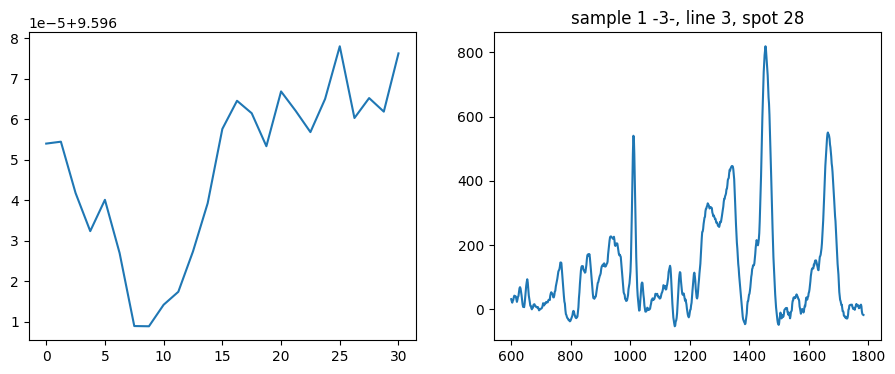

Send: MOVE X=-87475.0 Y=-253442.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.290775060653687
Position =  8.744012644788576


<Figure size 640x480 with 0 Axes>

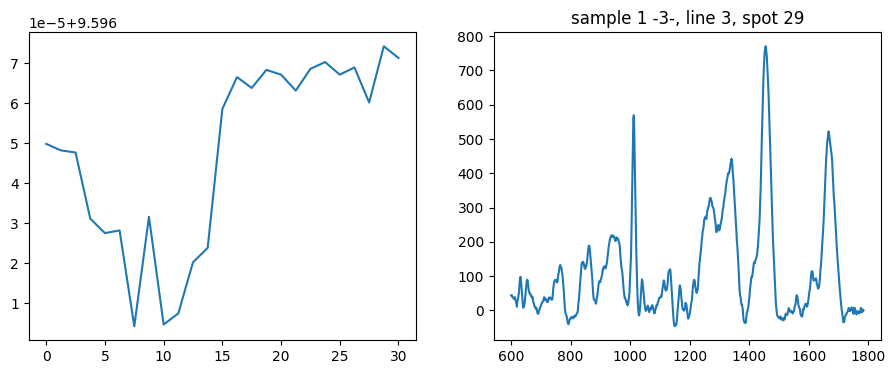

Send: MOVE X=-86913.0 Y=-254015.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.53599190711975
Position =  8.743193769118669


<Figure size 640x480 with 0 Axes>

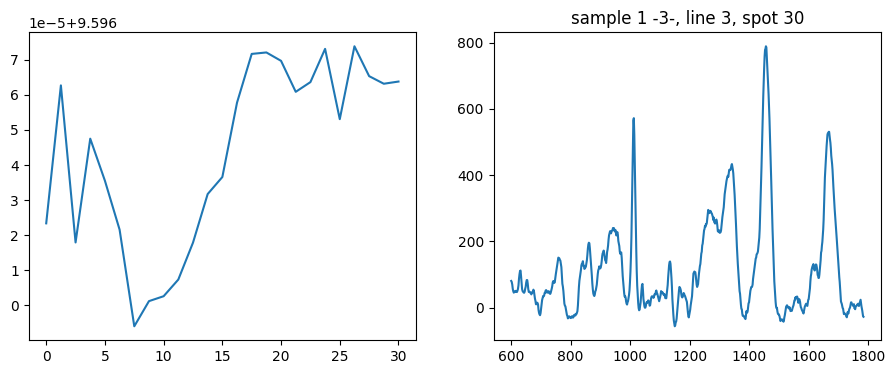

Send: MOVE X=-86351.0 Y=-254588.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.20951557159424
Position =  10.029484880785269


<Figure size 640x480 with 0 Axes>

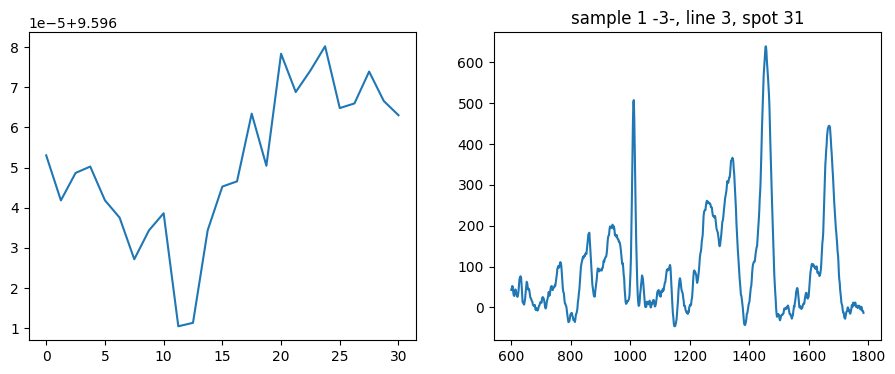

Send: MOVE X=-85789.0 Y=-255161.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.408586740493774
Position =  7.496114423376422


<Figure size 640x480 with 0 Axes>

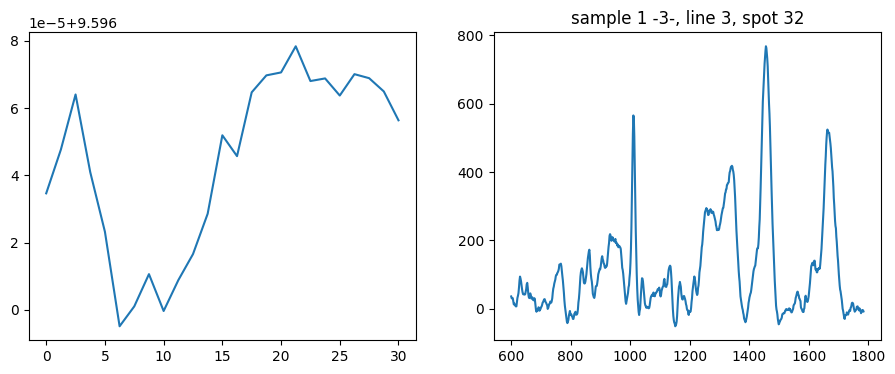

Send: MOVE X=-85226.0 Y=-255734.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.32008981704712
Position =  9.99591540833988


<Figure size 640x480 with 0 Axes>

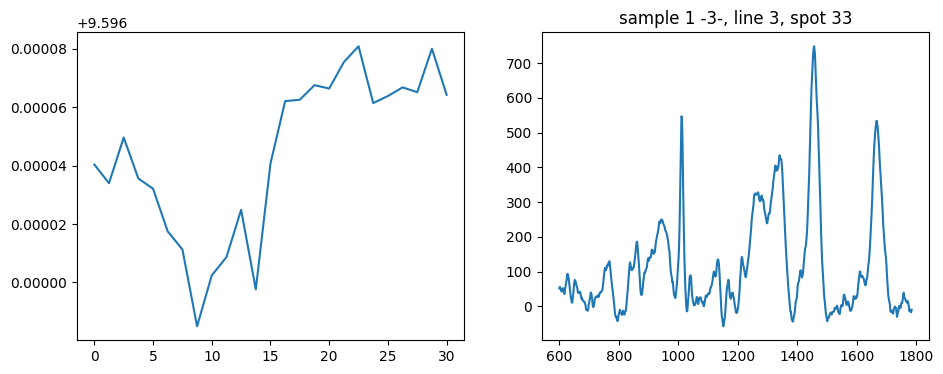

Send: MOVE X=-84664.0 Y=-256307.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.60698175430298
Position =  6.279028890723949


<Figure size 640x480 with 0 Axes>

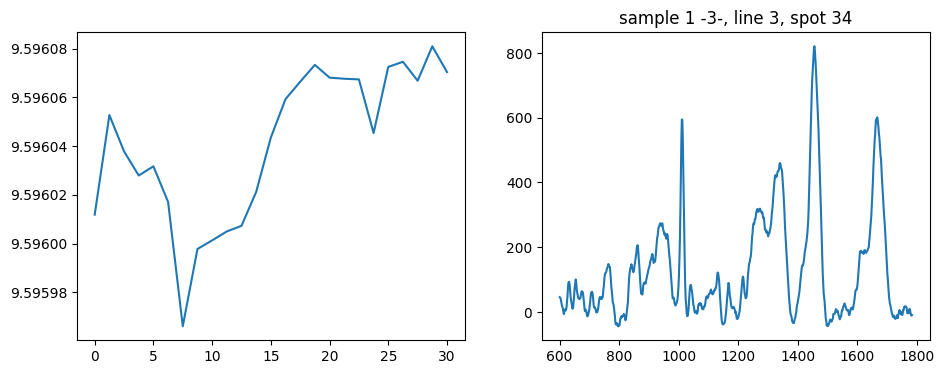

Send: MOVE X=-84102.0 Y=-256880.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.303325414657593
Position =  7.516183987163397


<Figure size 640x480 with 0 Axes>

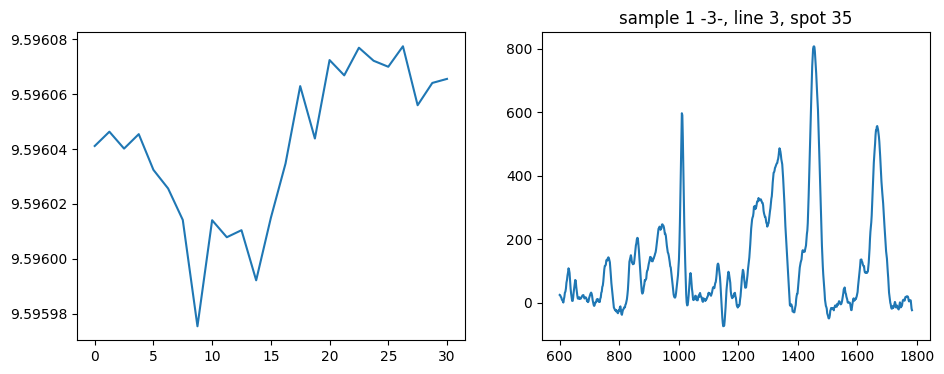

Send: MOVE X=-83540.0 Y=-257453.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.317903995513916
Position =  10.030247804767027


<Figure size 640x480 with 0 Axes>

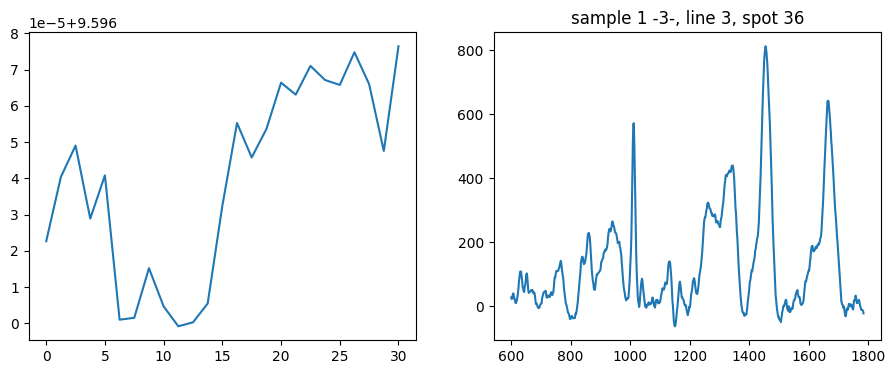

Send: MOVE X=-82977.0 Y=-258026.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.42614722251892
Position =  10.025833733507328


<Figure size 640x480 with 0 Axes>

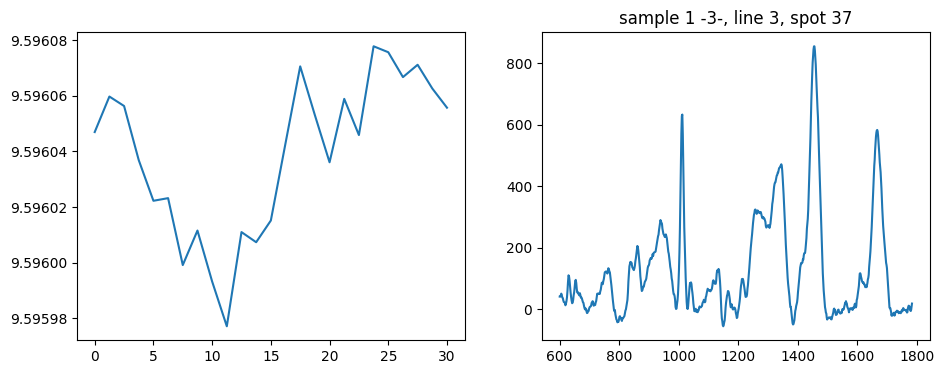

Send: MOVE X=-82415.0 Y=-258599.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.35863471031189
Position =  11.275793132716739


<Figure size 640x480 with 0 Axes>

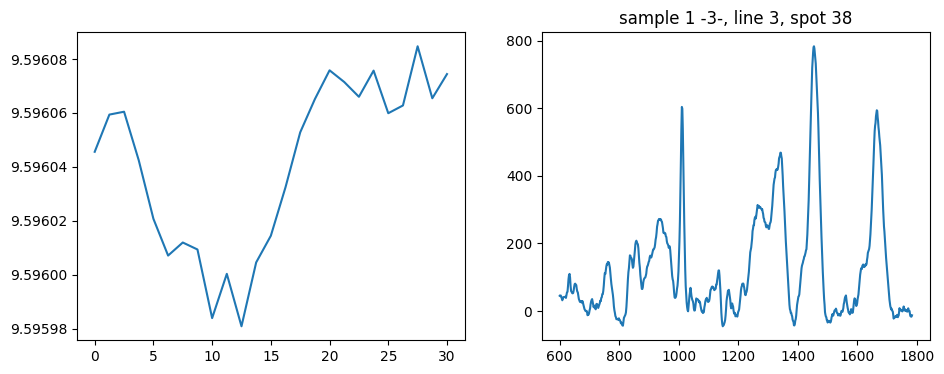

Send: MOVE X=-81853.0 Y=-259172.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.18694305419922
Position =  11.27193066033192


<Figure size 640x480 with 0 Axes>

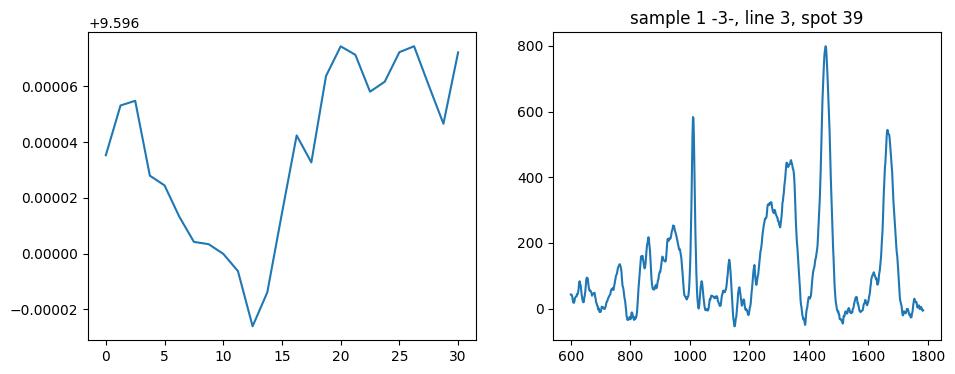

Send: MOVE X=-81291.0 Y=-259744.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.331328868865967
Position =  12.520503768119735


<Figure size 640x480 with 0 Axes>

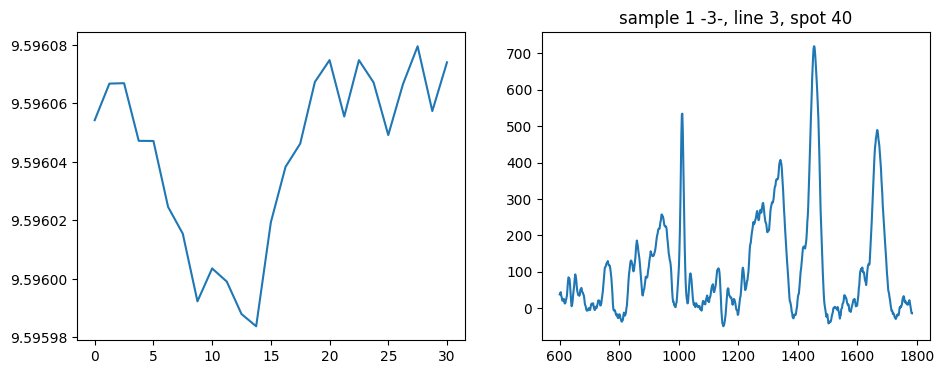

Send: MOVE X=-80729.0 Y=-260317.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.39983558654785
Position =  7.52733958126968


<Figure size 640x480 with 0 Axes>

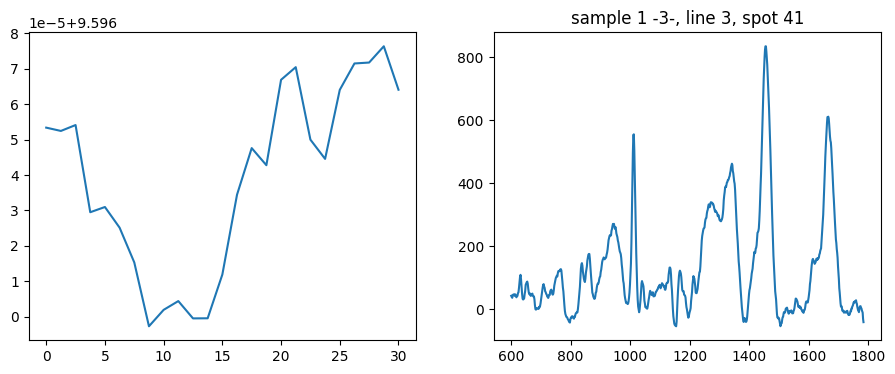

Send: MOVE X=-80166.0 Y=-260890.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.379971981048584
Position =  12.516702228913982


<Figure size 640x480 with 0 Axes>

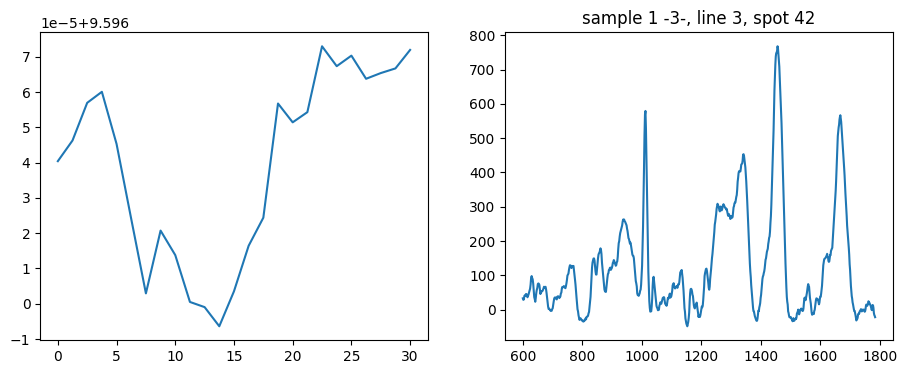

Send: MOVE X=-79604.0 Y=-261463.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.279241800308228
Position =  12.531310888917194


<Figure size 640x480 with 0 Axes>

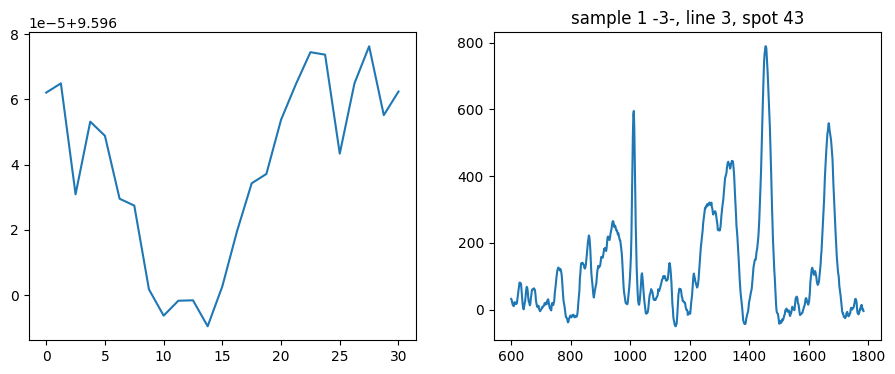

Send: MOVE X=-79042.0 Y=-262036.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.31993818283081
Position =  12.492426220715453


<Figure size 640x480 with 0 Axes>

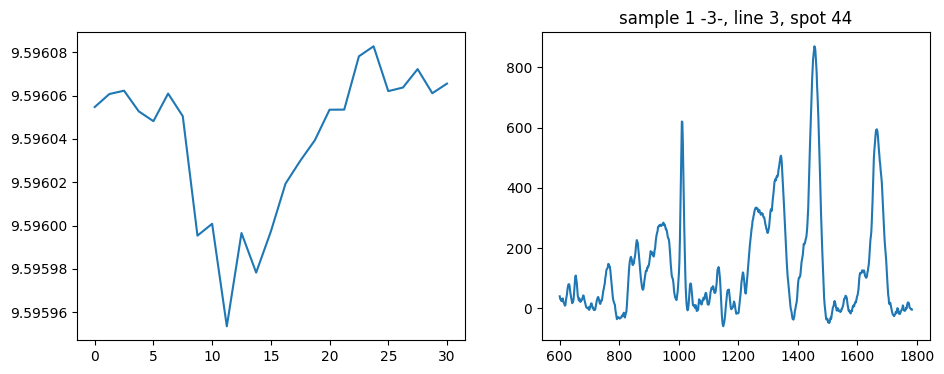

Send: MOVE X=-78480.0 Y=-262609.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.420867919921875
Position =  12.522078686130898


<Figure size 640x480 with 0 Axes>

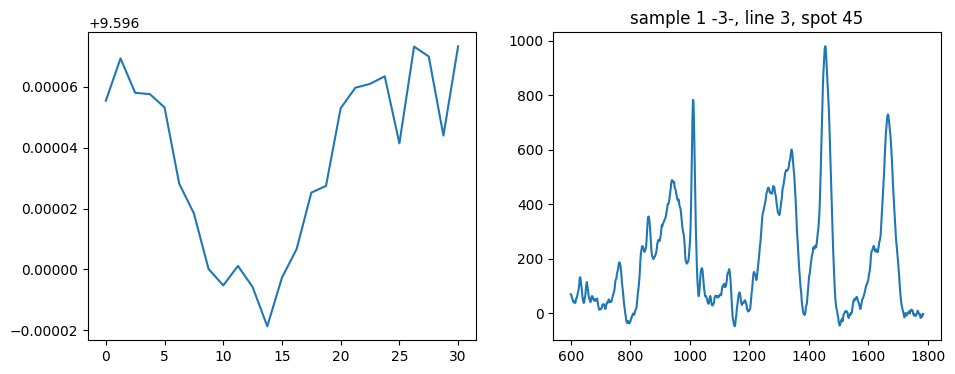

Send: MOVE X=-77917.0 Y=-263182.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.454995155334473
Position =  15.020319029961277


<Figure size 640x480 with 0 Axes>

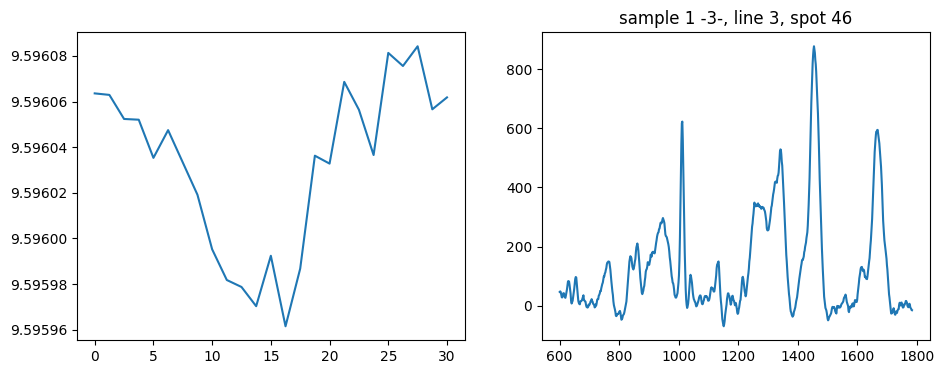

Send: MOVE X=-77355.0 Y=-263755.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.46136212348938
Position =  13.774630495169248


<Figure size 640x480 with 0 Axes>

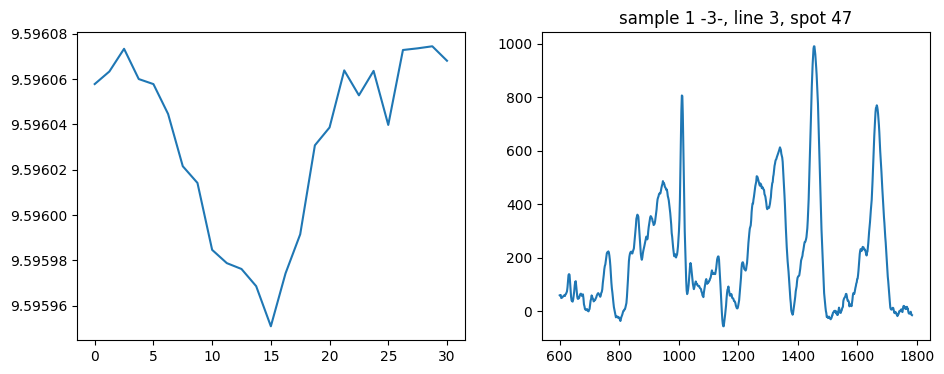

Send: MOVE X=-76793.0 Y=-264328.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.35313630104065
Position =  11.272202666308157


<Figure size 640x480 with 0 Axes>

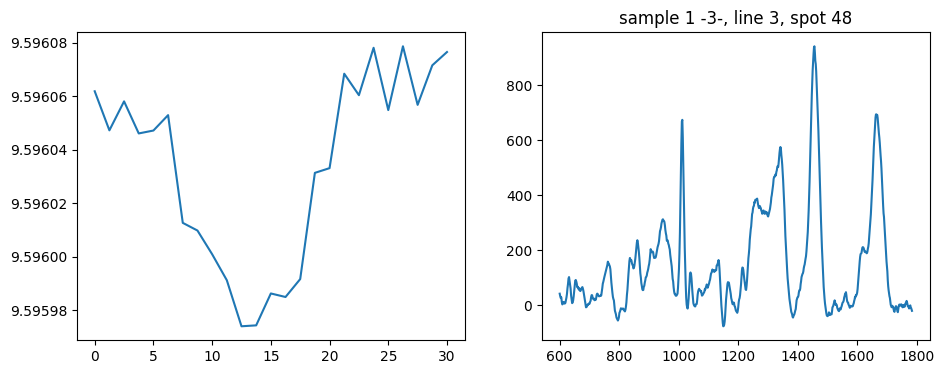

Send: MOVE X=-76231.0 Y=-264901.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.409947633743286
Position =  11.282430001367413


<Figure size 640x480 with 0 Axes>

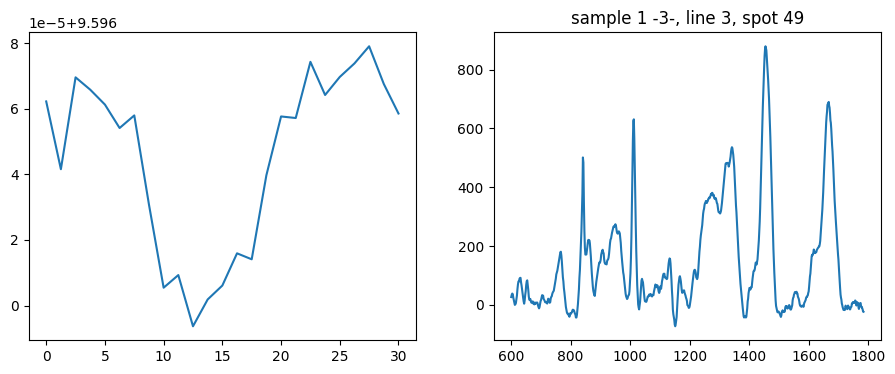

Send: MOVE X=-75668.0 Y=-265474.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.277025938034058
Position =  0.019341123869188345


<Figure size 640x480 with 0 Axes>

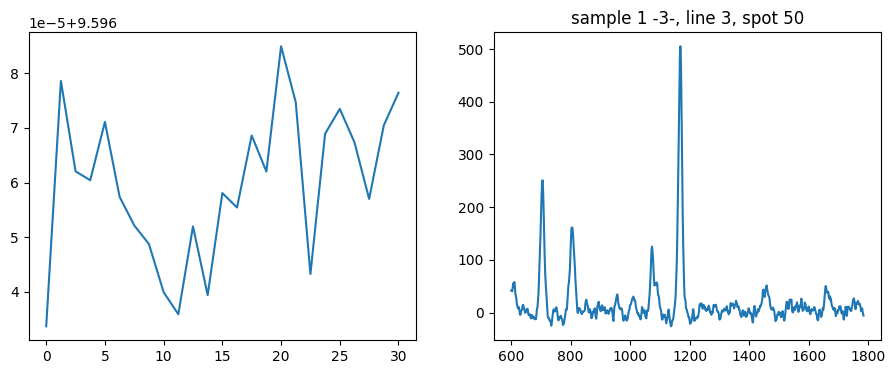

Send: MOVE X=-103218.0 Y=-265474.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.347825527191162
Position =  17.491138650564164


<Figure size 640x480 with 0 Axes>

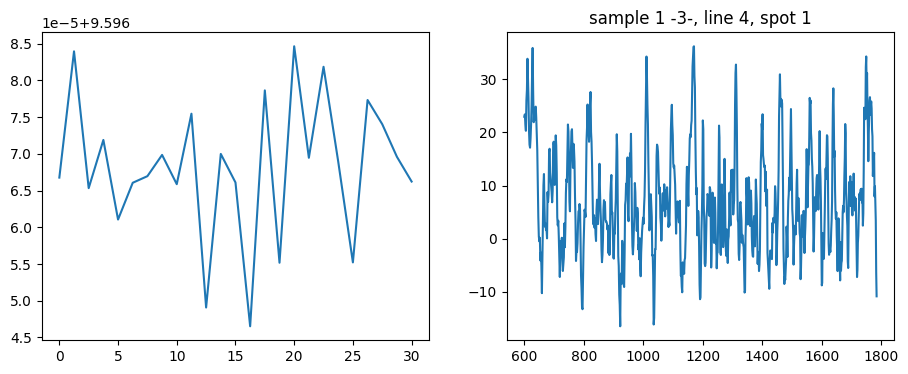

Send: MOVE X=-102656.0 Y=-264901.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.25809073448181
Position =  8.743412136459435


<Figure size 640x480 with 0 Axes>

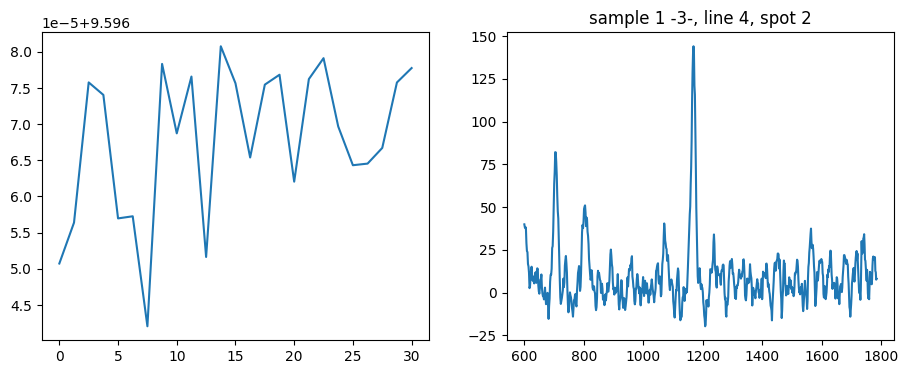

Send: MOVE X=-102094.0 Y=-264328.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.35672926902771
Position =  25.02909177830904


<Figure size 640x480 with 0 Axes>

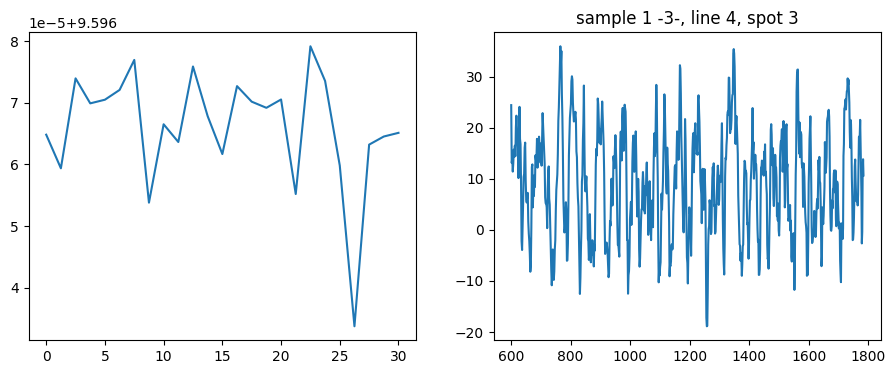

Send: MOVE X=-101531.0 Y=-263755.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.343038320541382
Position =  9.996024402989503


<Figure size 640x480 with 0 Axes>

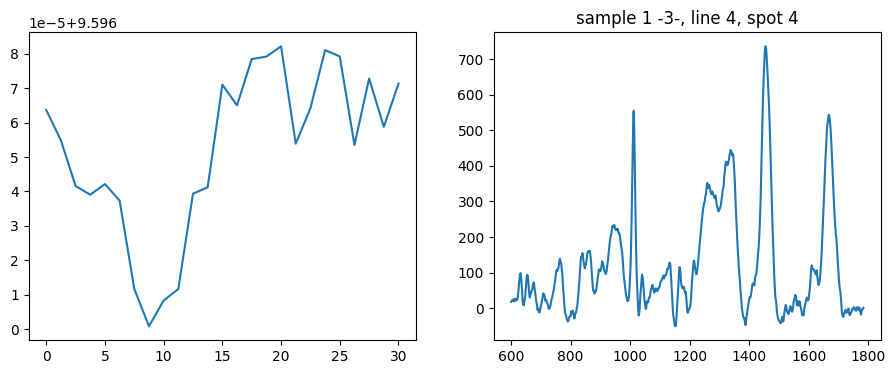

Send: MOVE X=-100969.0 Y=-263182.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3626606464386
Position =  11.24162857784835


<Figure size 640x480 with 0 Axes>

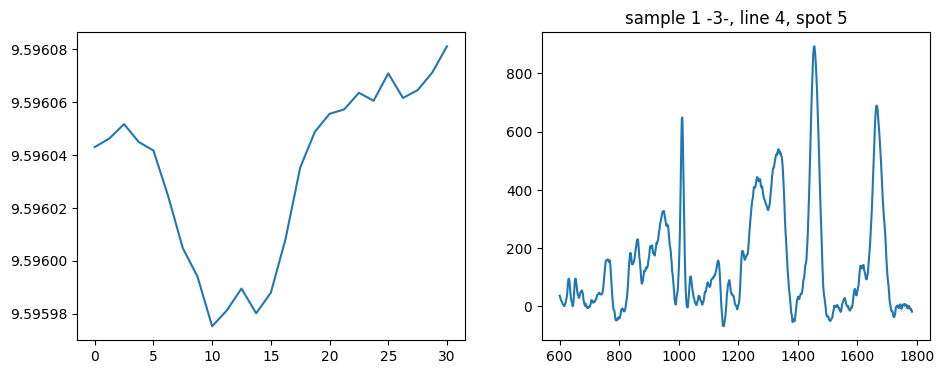

Send: MOVE X=-100407.0 Y=-262609.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.293856620788574
Position =  13.74437853687918


<Figure size 640x480 with 0 Axes>

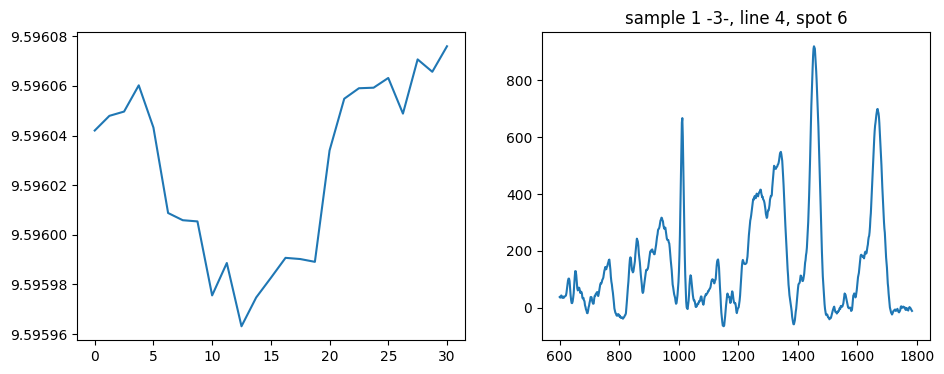

Send: MOVE X=-99845.0 Y=-262036.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.415945529937744
Position =  8.782826283401176


<Figure size 640x480 with 0 Axes>

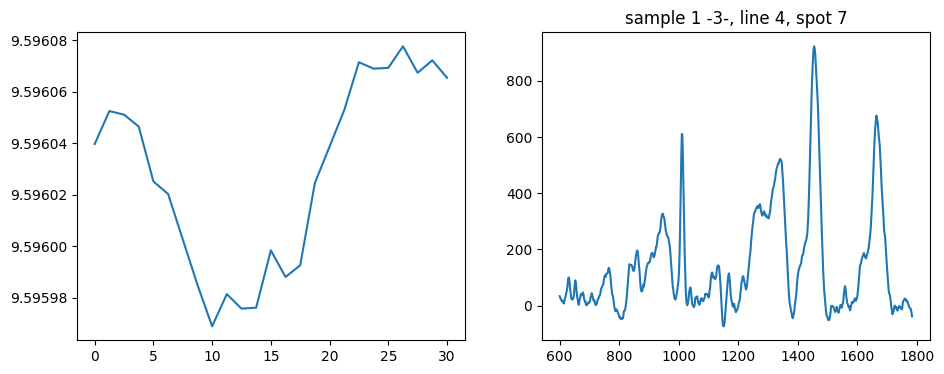

Send: MOVE X=-99282.0 Y=-261463.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.28563356399536
Position =  13.773058291566123


<Figure size 640x480 with 0 Axes>

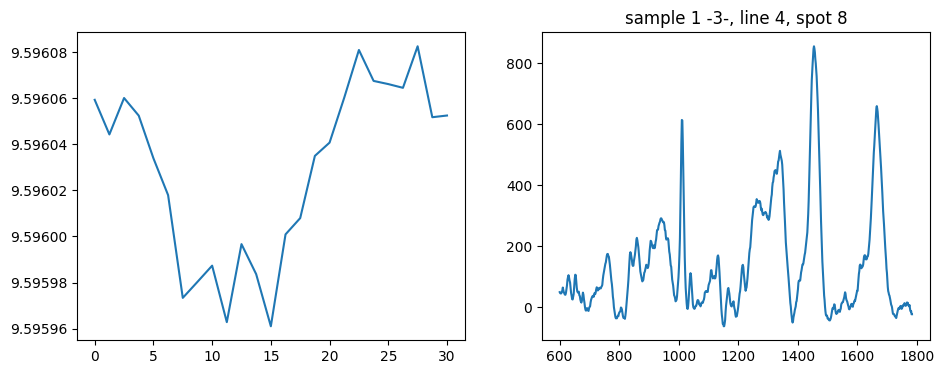

Send: MOVE X=-98720.0 Y=-260890.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.460124015808105
Position =  12.492426220471541


<Figure size 640x480 with 0 Axes>

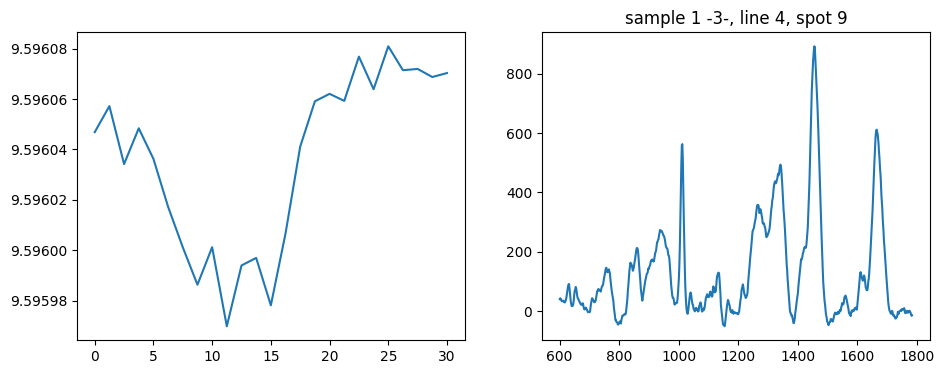

Send: MOVE X=-98158.0 Y=-260317.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.338911056518555
Position =  13.744758049494566


<Figure size 640x480 with 0 Axes>

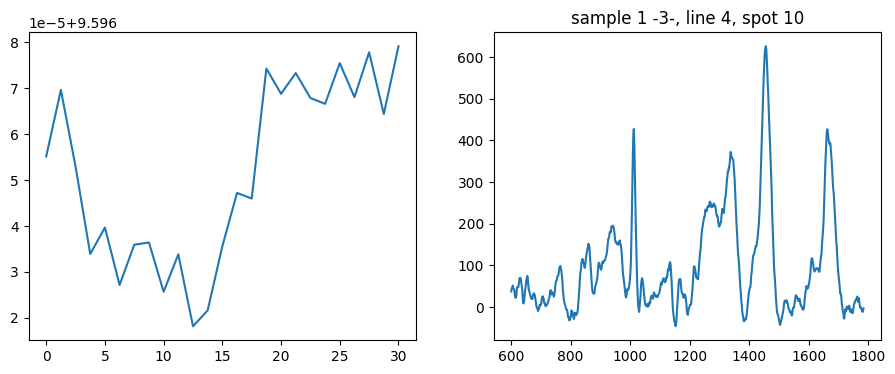

Send: MOVE X=-97596.0 Y=-259744.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.30150818824768
Position =  10.028285999520913


<Figure size 640x480 with 0 Axes>

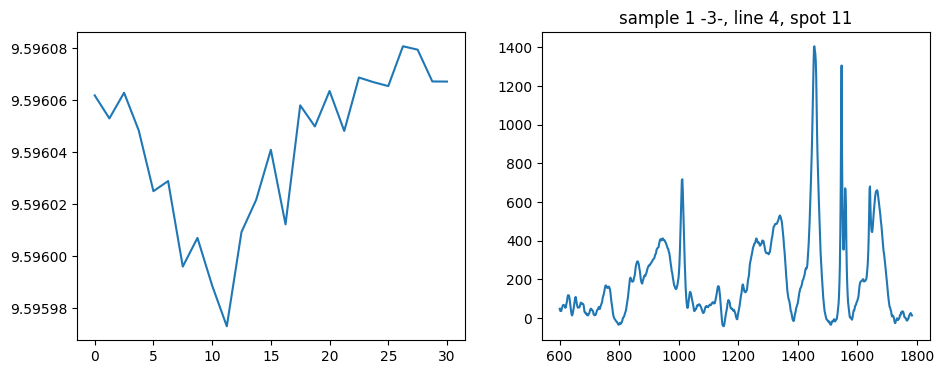

Send: MOVE X=-97033.0 Y=-259172.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.535680055618286
Position =  11.24168298127453


<Figure size 640x480 with 0 Axes>

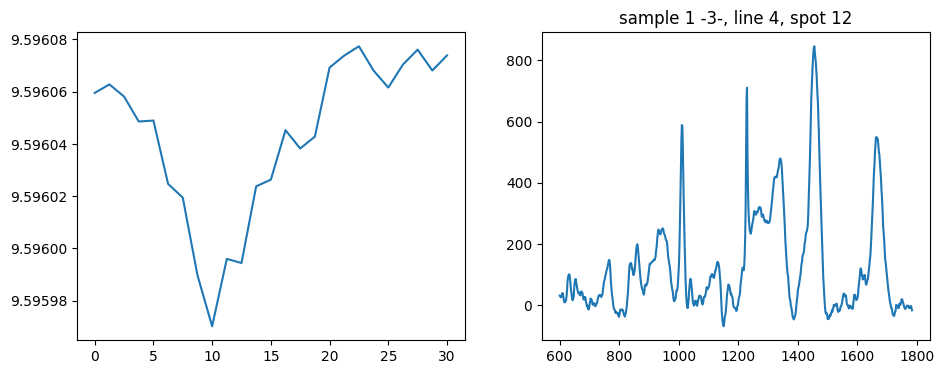

Send: MOVE X=-96471.0 Y=-258599.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.38148307800293
Position =  9.995806414676016


<Figure size 640x480 with 0 Axes>

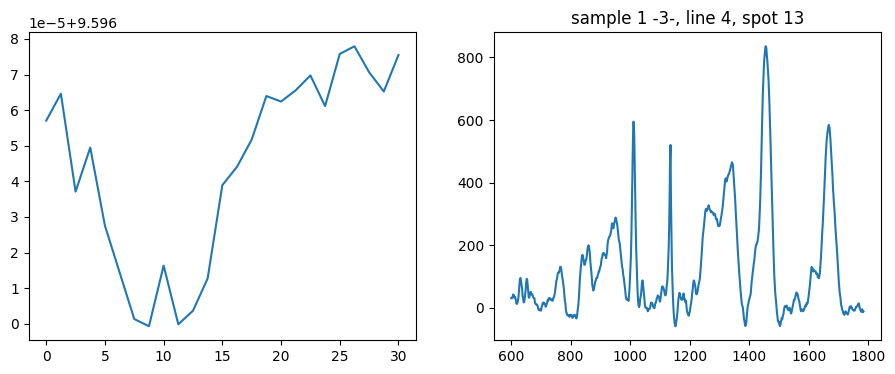

Send: MOVE X=-95909.0 Y=-258026.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.34889554977417
Position =  7.529581615796815


<Figure size 640x480 with 0 Axes>

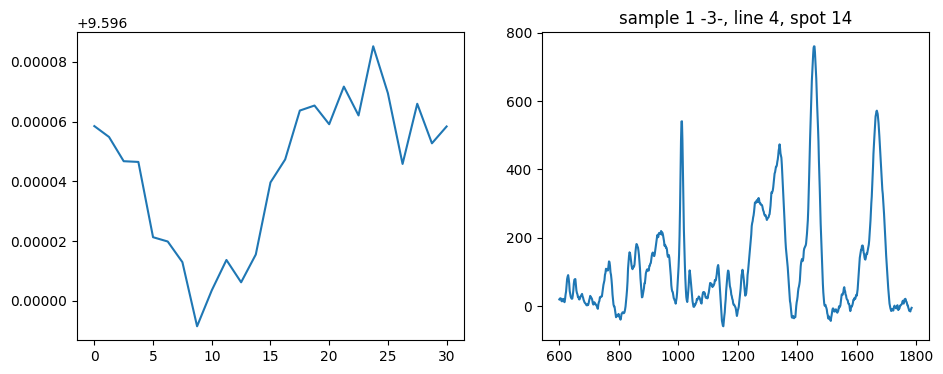

Send: MOVE X=-95347.0 Y=-257453.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.323694467544556
Position =  9.995479431220021


<Figure size 640x480 with 0 Axes>

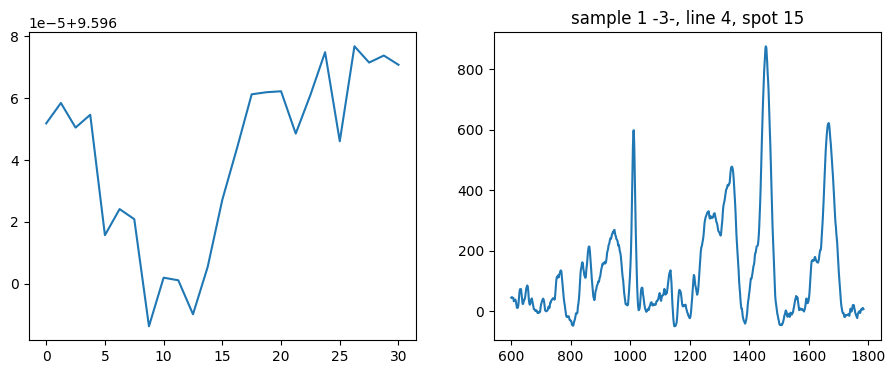

Send: MOVE X=-94784.0 Y=-256880.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.303846836090088
Position =  12.516539304246061


<Figure size 640x480 with 0 Axes>

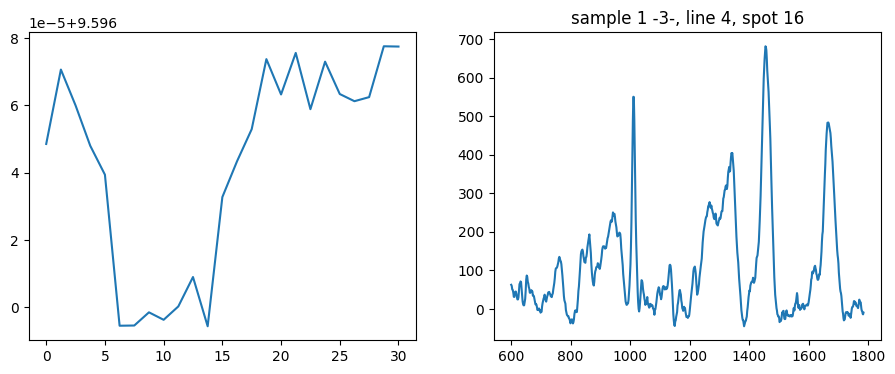

Send: MOVE X=-94222.0 Y=-256307.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.33100199699402
Position =  8.76584898697132


<Figure size 640x480 with 0 Axes>

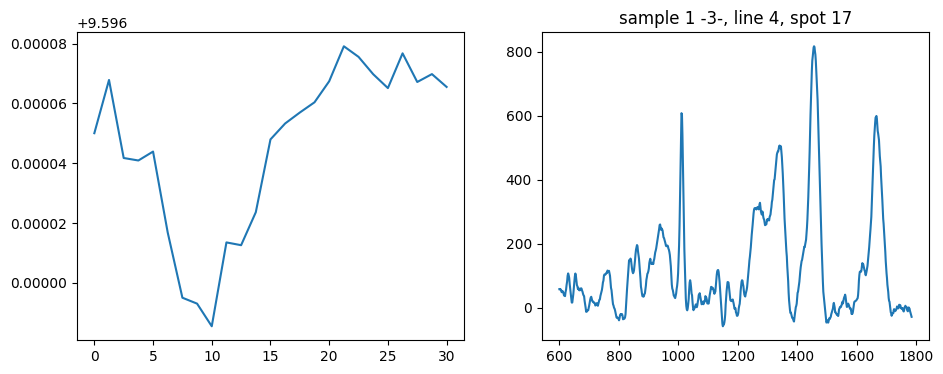

Send: MOVE X=-93660.0 Y=-255734.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.232760429382324
Position =  10.025288784901988


<Figure size 640x480 with 0 Axes>

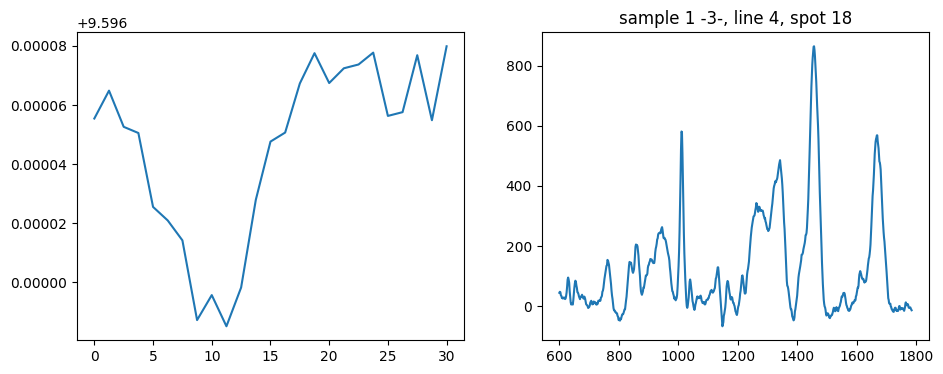

Send: MOVE X=-93098.0 Y=-255161.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.36434531211853
Position =  6.265607970482993


<Figure size 640x480 with 0 Axes>

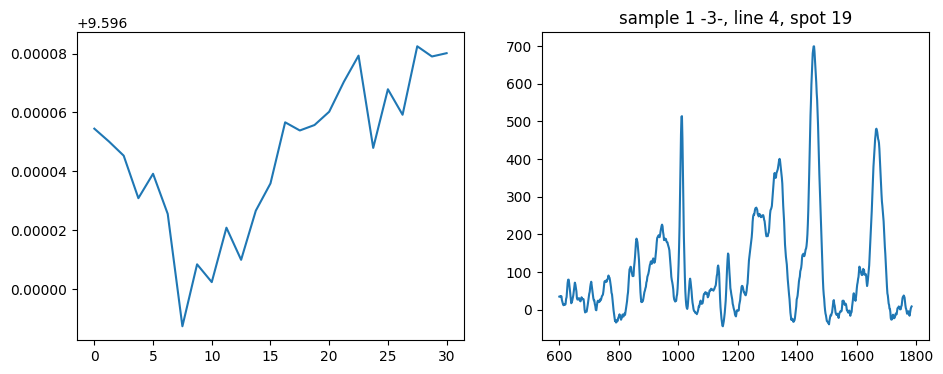

Send: MOVE X=-92535.0 Y=-254588.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.371102571487427
Position =  7.52794110338099


<Figure size 640x480 with 0 Axes>

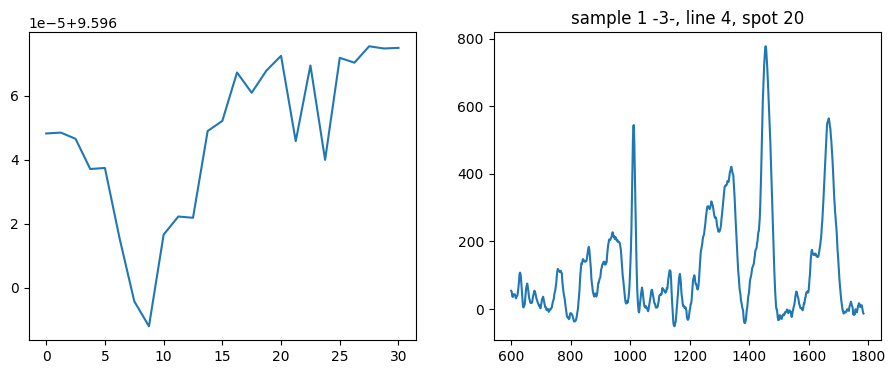

Send: MOVE X=-91973.0 Y=-254015.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.344096183776855
Position =  9.994825464184817


<Figure size 640x480 with 0 Axes>

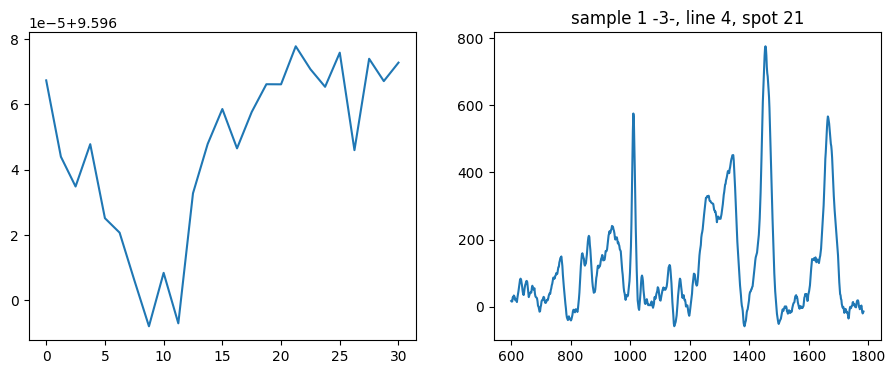

Send: MOVE X=-91411.0 Y=-253442.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.303287744522095
Position =  6.268182615079939


<Figure size 640x480 with 0 Axes>

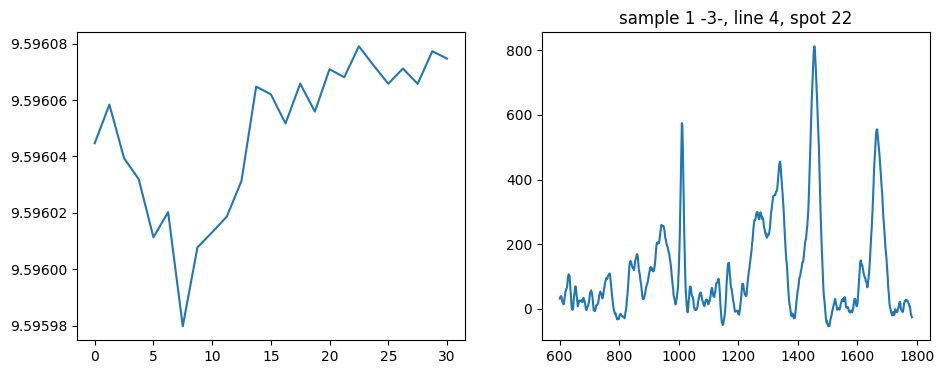

Send: MOVE X=-90849.0 Y=-252869.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.257335662841797
Position =  12.517679768873402


<Figure size 640x480 with 0 Axes>

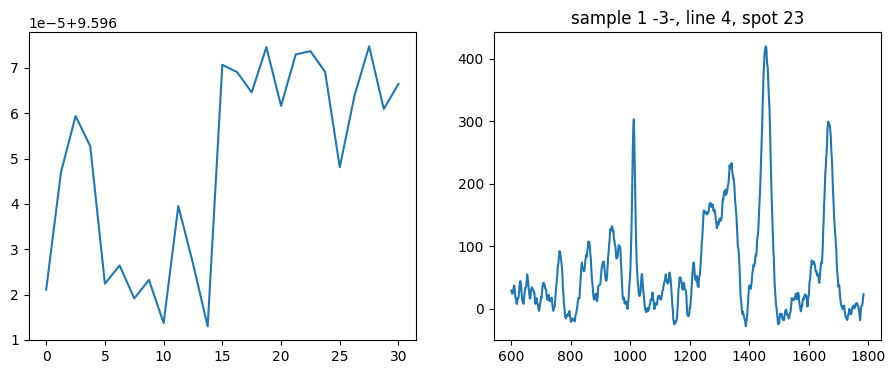

Send: MOVE X=-90287.0 Y=-252296.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.49625277519226
Position =  7.528870727726494


<Figure size 640x480 with 0 Axes>

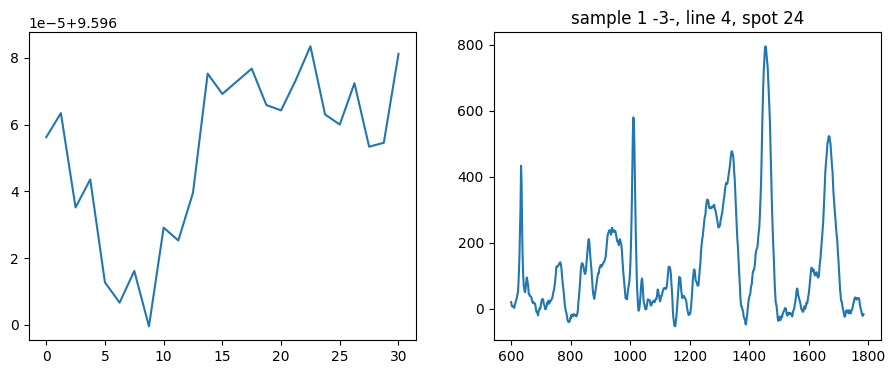

Send: MOVE X=-89724.0 Y=-251723.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3712420463562
Position =  6.244517452756978


<Figure size 640x480 with 0 Axes>

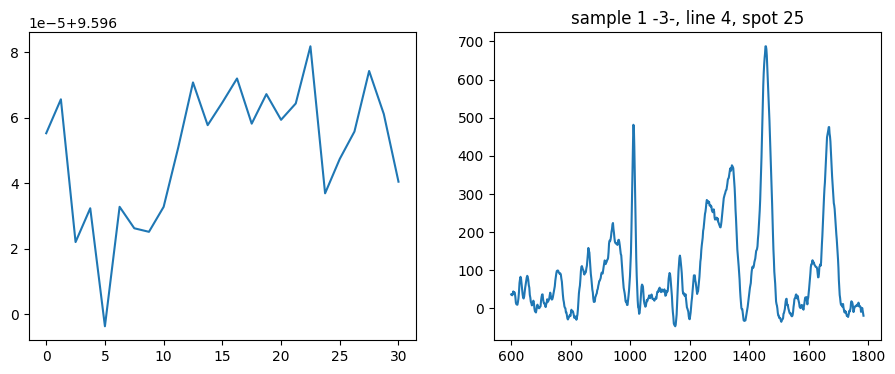

Send: MOVE X=-89162.0 Y=-251151.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.414346933364868
Position =  7.496551913979477


<Figure size 640x480 with 0 Axes>

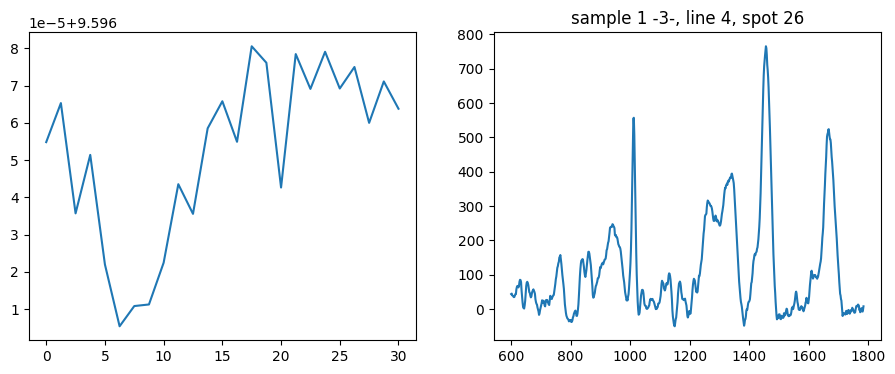

Send: MOVE X=-88600.0 Y=-250578.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.447860956192017
Position =  7.526081852200173


<Figure size 640x480 with 0 Axes>

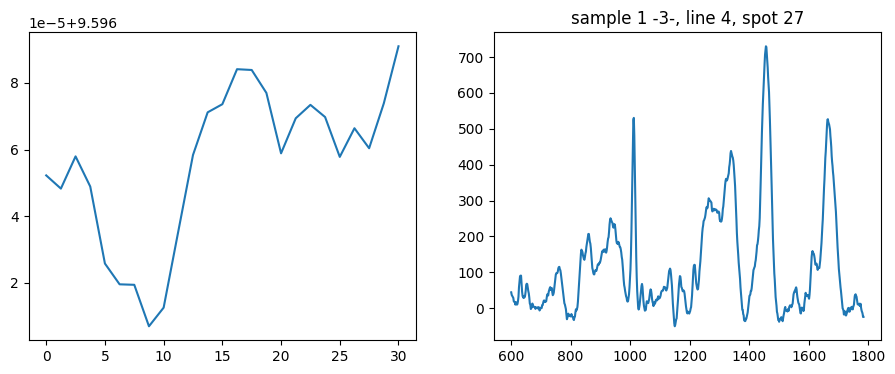

Send: MOVE X=-88038.0 Y=-250005.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.18130588531494
Position =  7.530784655164314


<Figure size 640x480 with 0 Axes>

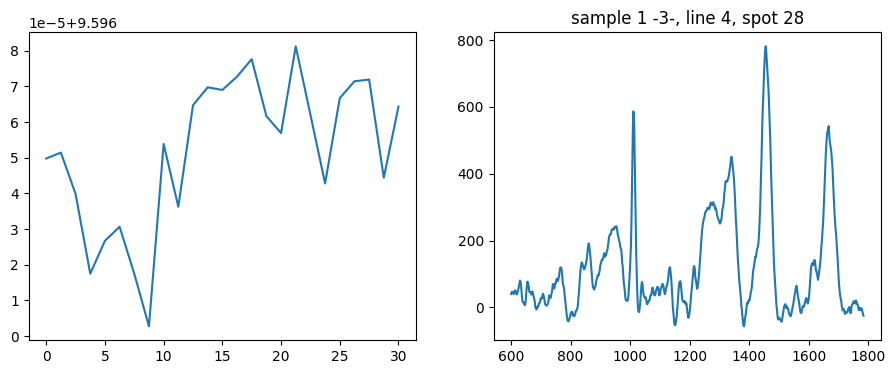

Send: MOVE X=-87475.0 Y=-249432.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.49169611930847
Position =  6.277495085562815


<Figure size 640x480 with 0 Axes>

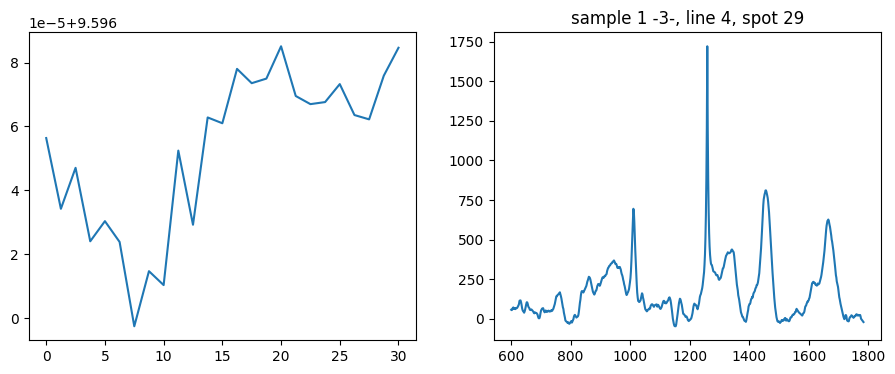

Send: MOVE X=-86913.0 Y=-248859.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.303035974502563
Position =  7.495731619861368


<Figure size 640x480 with 0 Axes>

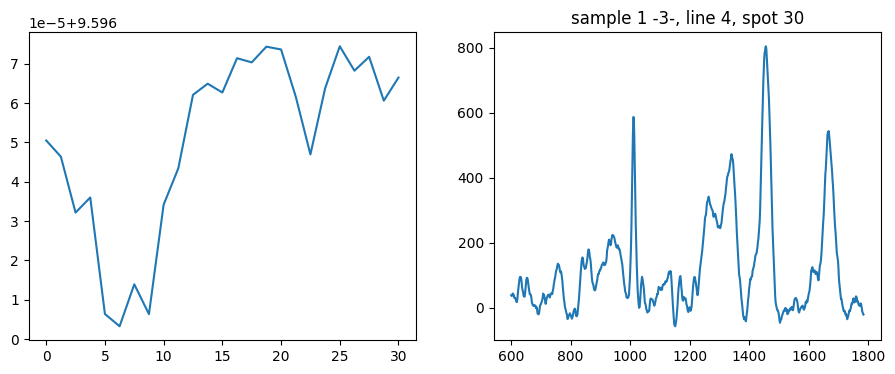

Send: MOVE X=-86351.0 Y=-248286.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.54611110687256
Position =  5.023335161366445


<Figure size 640x480 with 0 Axes>

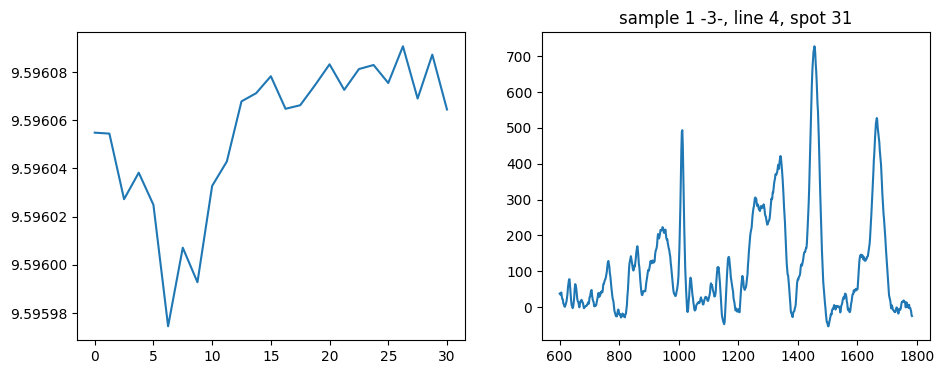

Send: MOVE X=-85789.0 Y=-247713.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.383805751800537
Position =  7.495950364727112


<Figure size 640x480 with 0 Axes>

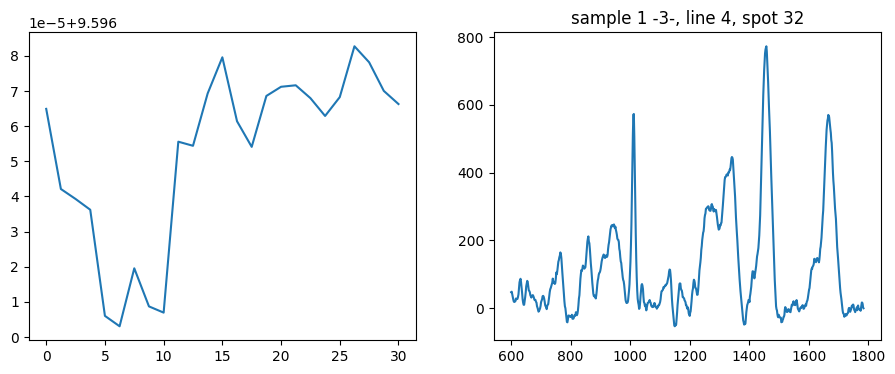

Send: MOVE X=-85226.0 Y=-247140.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.365858554840088
Position =  6.244681796899764


<Figure size 640x480 with 0 Axes>

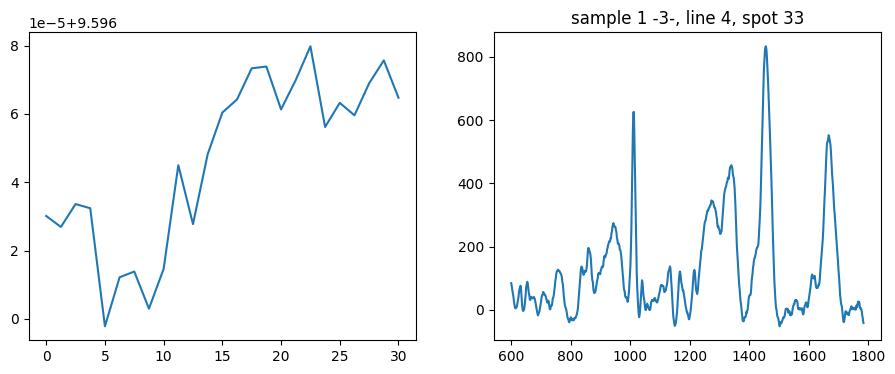

Send: MOVE X=-84664.0 Y=-246567.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.29859185218811
Position =  7.49584099216973


<Figure size 640x480 with 0 Axes>

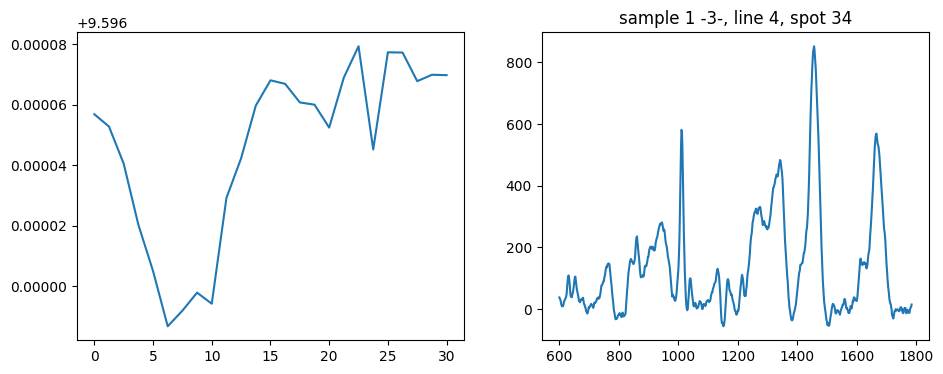

Send: MOVE X=-84102.0 Y=-245994.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.493613958358765
Position =  6.2724554132350505


<Figure size 640x480 with 0 Axes>

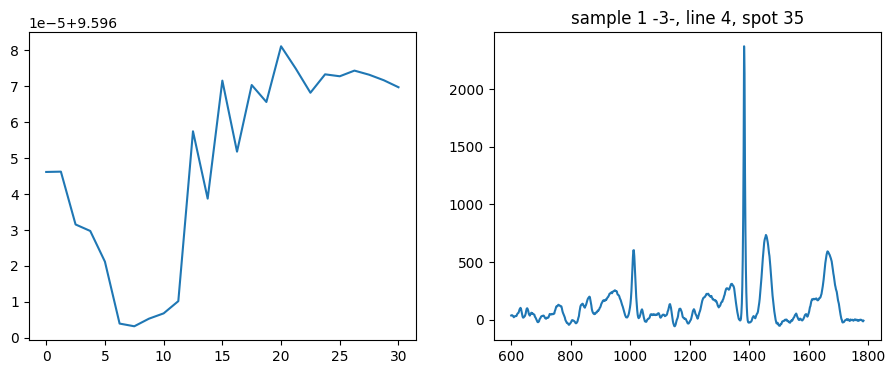

Send: MOVE X=-83540.0 Y=-245421.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.3005428314209
Position =  7.4958409917962046


<Figure size 640x480 with 0 Axes>

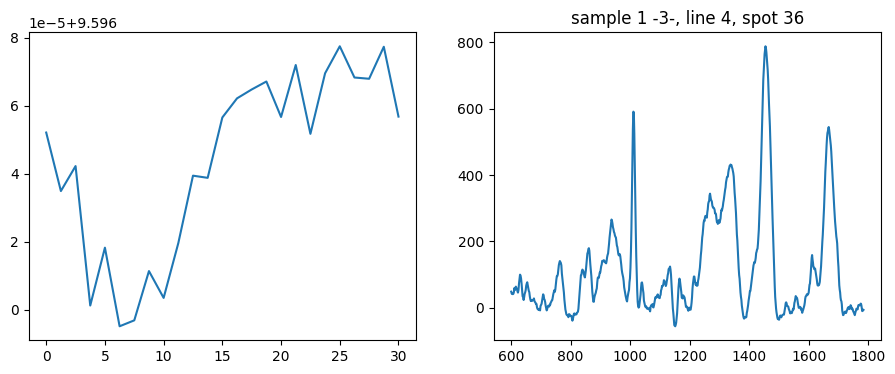

Send: MOVE X=-82977.0 Y=-244848.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.58168625831604
Position =  6.24380529422083


<Figure size 640x480 with 0 Axes>

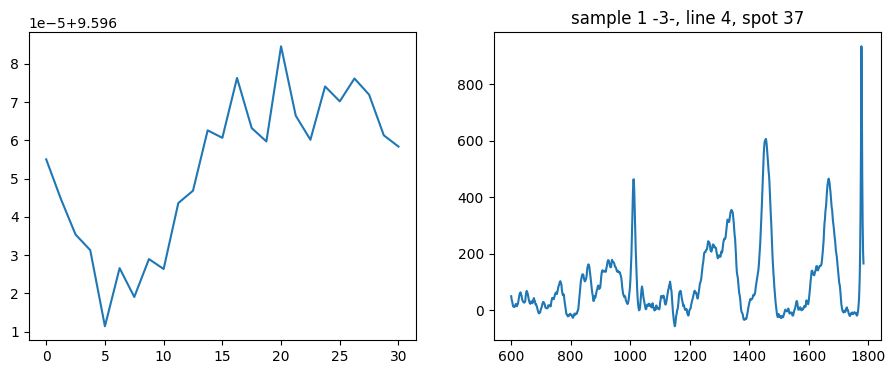

Send: MOVE X=-82415.0 Y=-244275.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.424044370651245
Position =  6.268730412952979


<Figure size 640x480 with 0 Axes>

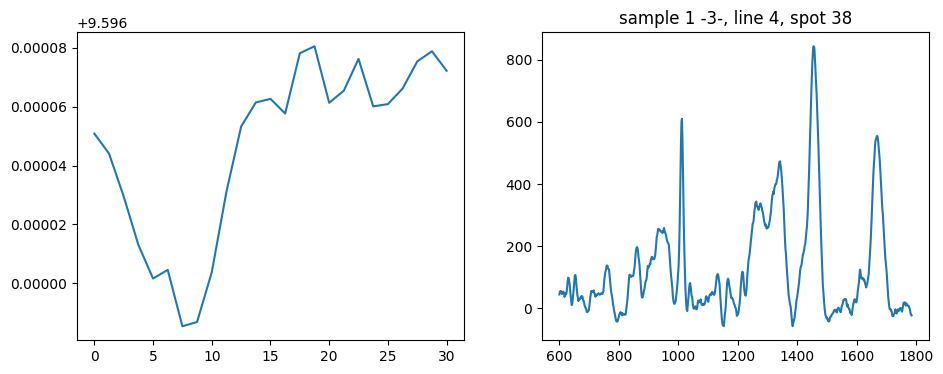

Send: MOVE X=-81853.0 Y=-243702.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.521010160446167
Position =  8.74335754462424


<Figure size 640x480 with 0 Axes>

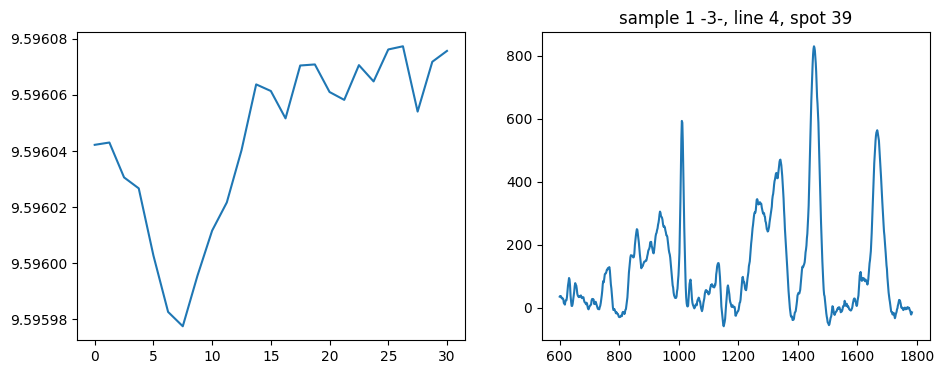

Send: MOVE X=-81291.0 Y=-243130.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.223206758499146
Position =  7.526027168722704


<Figure size 640x480 with 0 Axes>

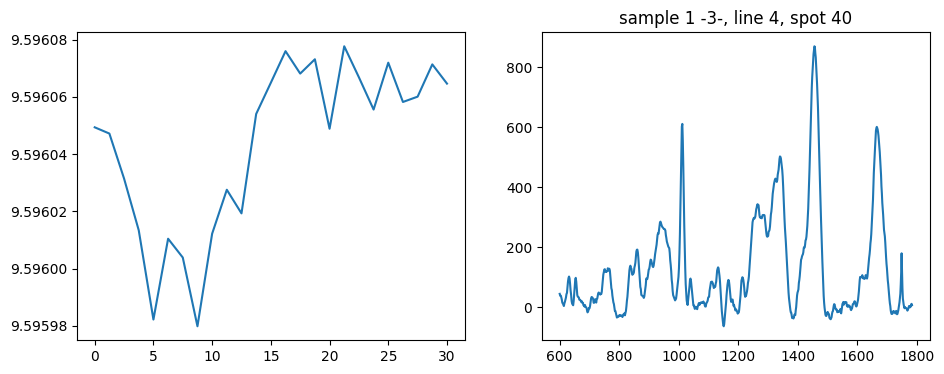

Send: MOVE X=-80729.0 Y=-242557.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.379355907440186
Position =  11.241846191798253


<Figure size 640x480 with 0 Axes>

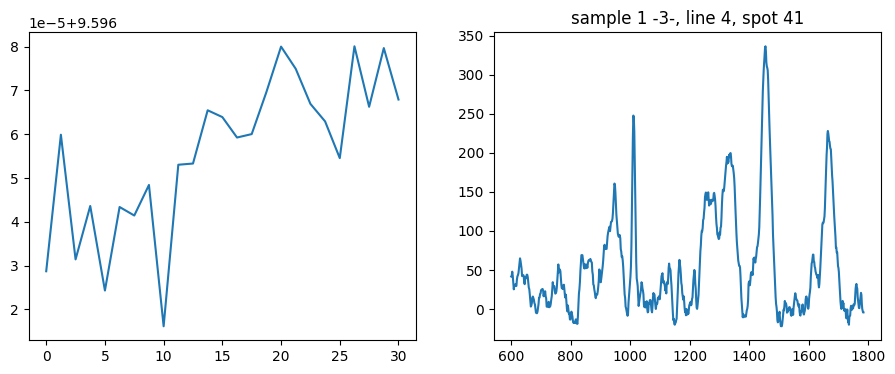

Send: MOVE X=-80166.0 Y=-241984.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.397464275360107
Position =  7.529855033931083


<Figure size 640x480 with 0 Axes>

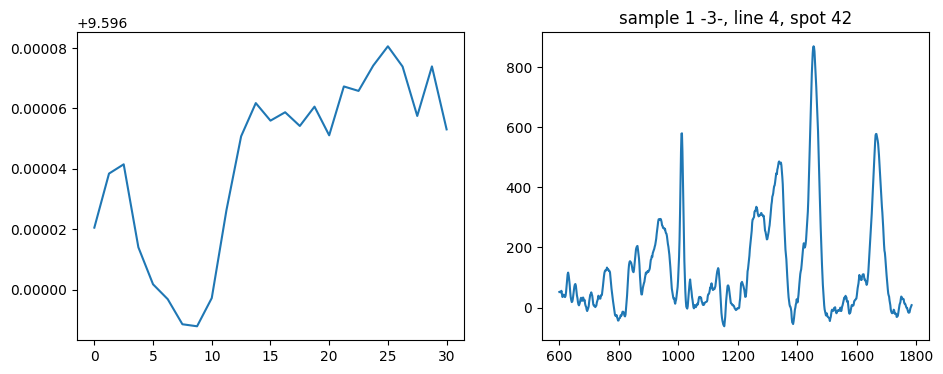

Send: MOVE X=-79604.0 Y=-241411.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.493967533111572
Position =  7.524496016041278


<Figure size 640x480 with 0 Axes>

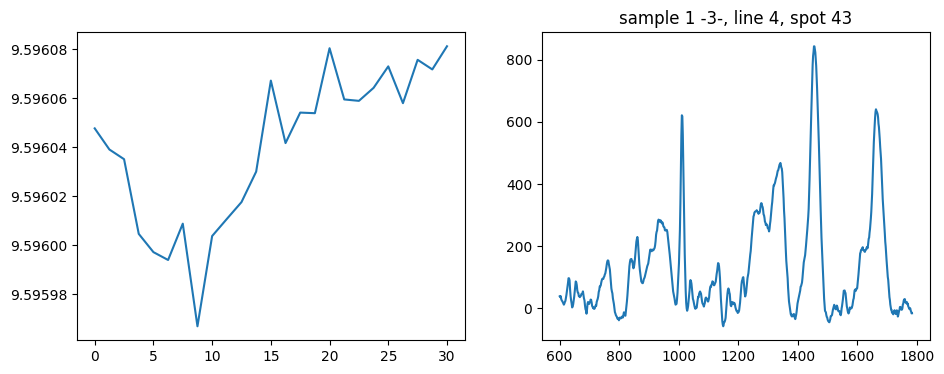

Send: MOVE X=-79042.0 Y=-240838.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.421844005584717
Position =  7.496715972130748


<Figure size 640x480 with 0 Axes>

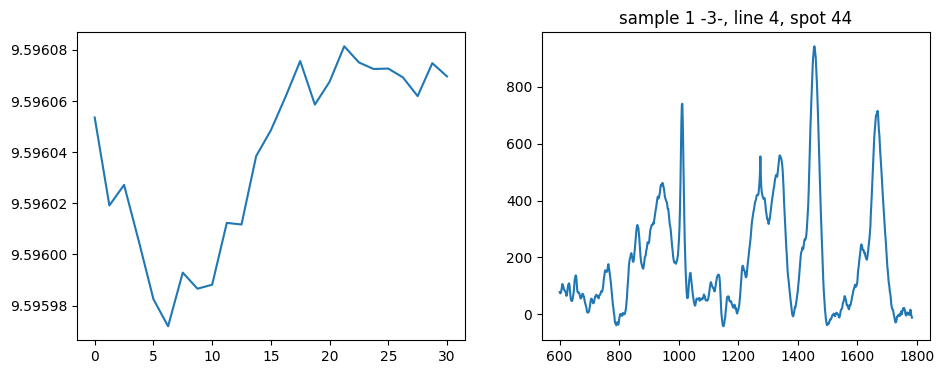

Send: MOVE X=-78480.0 Y=-240265.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.4708194732666
Position =  9.989648207483803


<Figure size 640x480 with 0 Axes>

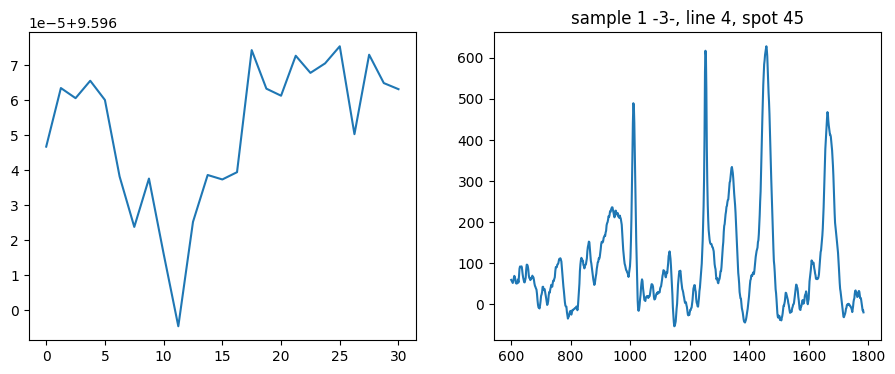

Send: MOVE X=-77917.0 Y=-239692.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.275474309921265
Position =  12.492589149529643


<Figure size 640x480 with 0 Axes>

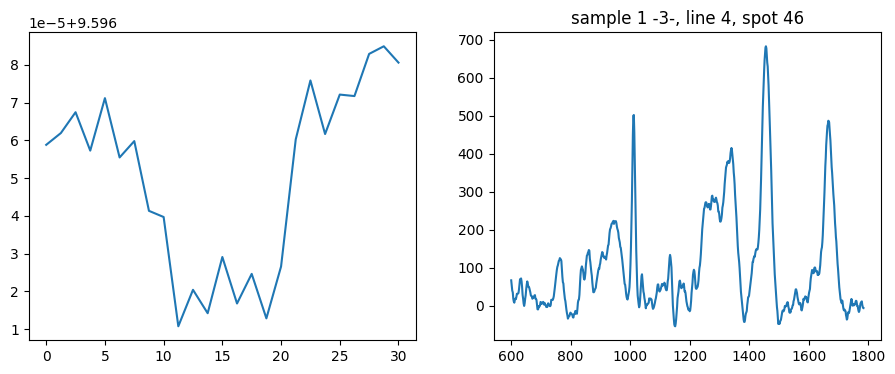

Send: MOVE X=-77355.0 Y=-239119.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.42842388153076
Position =  10.02305448835086


<Figure size 640x480 with 0 Axes>

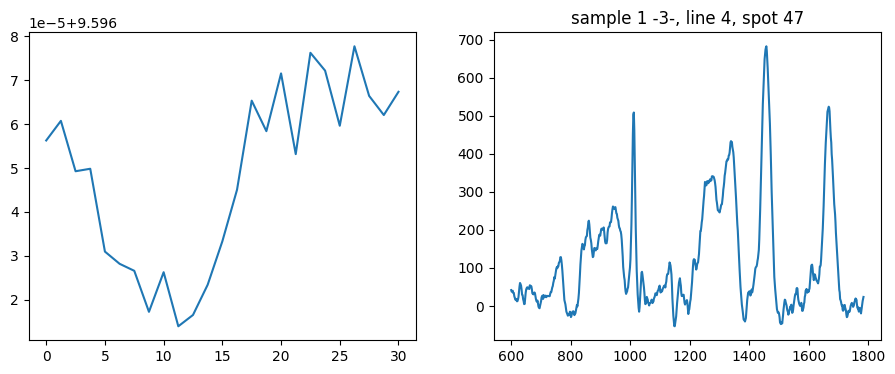

Send: MOVE X=-76793.0 Y=-238546.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.250048398971558
Position =  7.527995787605415


<Figure size 640x480 with 0 Axes>

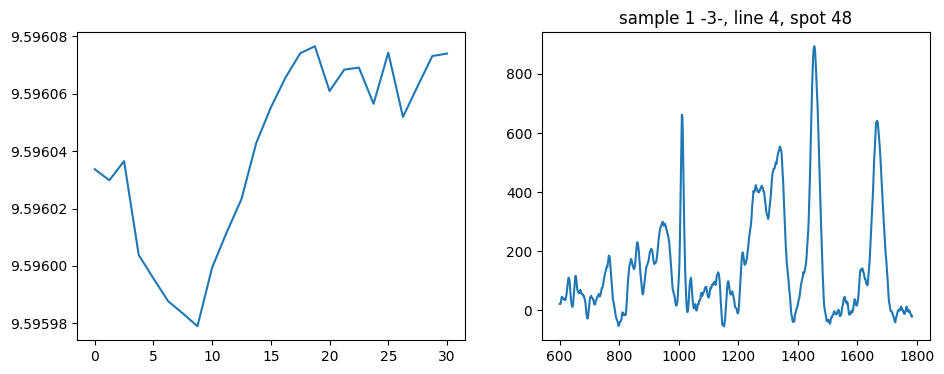

Send: MOVE X=-76231.0 Y=-237973.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.517728567123413
Position =  6.243969638488774


<Figure size 640x480 with 0 Axes>

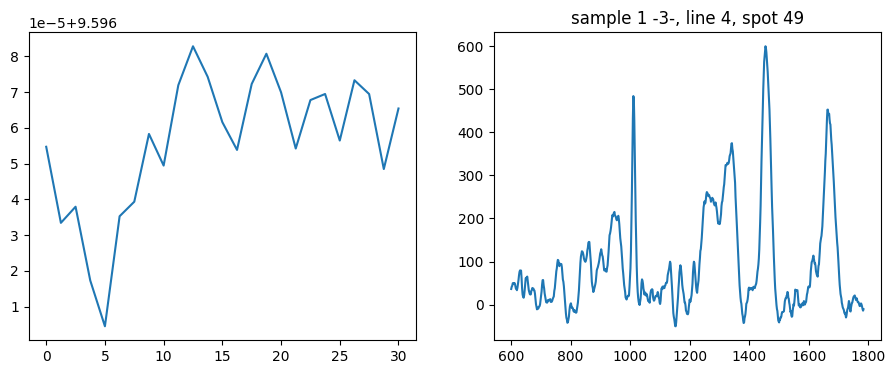

Send: MOVE X=-75668.0 Y=-237400.0 Z=0
Recv: :A
Waiting for device...
Time elapsed =  23.372676610946655
Position =  3.7811633271388985


In [ ]:
#Do line measurements
import pandas as pd
##TO EDIT: repitition number and exposure time
num_rep = 5
exp_time = 10
h = 0
exposures = .1 #(.1,.5,1)
for h in range(spot_num):
    patient_number = sample_names[h]
    measurement_line = []
    for k in range(4):
        measurement_line = k+1
        current_spot = []
        for i in range(data_points):
            current_spot = i+1
            ms2k.move(x_vectors_grid[h,k,i],y_vectors_grid[h,k,i])
            ms2k.wait_for_device()
            time.sleep(0.75)
            df_list = []
            data_point = 1024
            int_array = np.zeros((num_rep,data_point))
            wa_array = np.zeros((num_rep,data_point))
            
            (z_axis_range,entropy_graph) = autofocus(exposures)
            for rep in range(num_rep):
                wavenumbers, intensity = cam.camera_aquisition(exp_time)
                df = pd.DataFrame({
                    'Wavelength':wavenumbers,
                    'Intensity':intensity
                })
                df_list.append(df)
            final_df = pd.concat(df_list)
            
            if len(str(current_spot)) == 1:
                newspotnum = str(0) + str(current_spot)
            else:
                newspotnum = current_spot

            final_df.to_csv(f'{date}_{patient_number}_plasma_{filename}_{measurement_line}_{newspotnum}.txt',index=False,sep = ',',header = False)

            collected_spectra = np.column_stack((wavenumbers,intensity))
            processed = preprocessing(collected_spectra)
            plt.figure()
            plt.figure(figsize=(11,4))
            plt.subplot(1,2,1)
            plt.plot(z_axis_range,entropy_graph)
            plt.subplot(1,2,2)
            plt.plot(processed[:,0],processed[:,1])
            plt.title(f'sample {h+1} -{patient_number}-, line {measurement_line}, spot {current_spot}')
            plt.show()

In [ ]:
#go back to a specific spot number to visualize:

#edit for the sample, line, and spot needed:

spot= [1, 1, 15]

num1 = spot[0]-1
num2 = spot[1]-1
num3 = spot[2]-1
patient_number = sample_names[num1]
filenameline = (f'{date}_{patient_number}_{filename}_{spot[1]}')
filenum = spot[2]
if len(str(filenum)) == 1:
    newfilenum = str(0) + str(filenum)
else:
    newfilenum = filenum

x_redo = x_vectors_grid[num1,num2,num3]
y_redo = y_vectors_grid[num1,num2,num3]

ms2k.move(x_redo,y_redo)
ms2k.wait_for_device()
time.sleep(0.75)


In [ ]:
df_list = []
num_rep = 5
data_point = 1024
int_array = np.zeros((num_rep,data_point))
wa_array = np.zeros((num_rep,data_point))

exp_time = 10
#(z_axis_range,entropy_graph) = autofocus(.1)

for rep in range(num_rep):
    wavenumbers, intensity = cam.camera_aquisition(exp_time)
    df = pd.DataFrame({
        'Wavelength':wavenumbers,
        'Intensity':intensity
    })
    df_list.append(df)
final_df = pd.concat(df_list)
final_df.to_csv(f'{filenameline}_{newfilenum}_redone.txt',index=False,sep = ',',header = False)

collected_spectra = np.column_stack((wavenumbers,intensity))
processed = preprocessing(collected_spectra)
plt.figure()
plt.figure(figsize=(11,4))
plt.subplot(1,2,1)
plt.plot(z_axis_range,entropy_graph)
plt.subplot(1,2,2)
plt.plot(processed[:,0],processed[:,1])
plt.show()